In [2]:
from F1_library import libraryF1dataNotebook as libraryDataF1
import pandas as pd
import fastf1 as ff1

# FORMULA 1 QATAR AIRWAYS AZERBAIJAN GRAND PRIX 2025
The first Formula One Grand Prix to be held in Azerbaijan was the 2016 European Grand Prix, which took place at the Baku City Circuit. A year later, in 2017, the same venue hosted the first Azerbaijan Grand Prix. The race was held on 25 June and was one of five races to be held on a street circuit during the 2017 Formula One season, along with the Singapore, Monaco, Australian and Canadian Grands Prix. The first Azerbaijan Grand Prix winner was Daniel Ricciardo of Red Bull, grabbing his first win of the 2017 campaign during Sunday's Azerbaijan Grand Prix.


The 2018 Azerbaijan Grand Prix and Baku city walls behind
The 2018 Azerbaijan Grand Prix took place on 29 April as the 4th round of the season and was won by Lewis Hamilton.

The 2019 Azerbaijan Grand Prix was held on 28 April as the 4th round of the season and was won by Valtteri Bottas. In March 2020, the 2020 race was postponed due to the COVID-19 pandemic, before being cancelled later in the year. The 2021 Azerbaijan Grand Prix featured as the 6th round of the season, and the race was won by Sergio Pérez after Max Verstappen, who led a majority of the race, was struck by tyre failure. The 2022 Azerbaijan Grand Prix was won by Verstappen.

The 2023 Azerbaijan Grand Prix became the first Grand Prix to implement a new format, featuring a new qualifying session called "sprint shootout" which determined the grid for one of the six sprints in the 2023 season. Sergio Pérez became the first driver to win the Azerbaijan Grand Prix twice, following his win in 2021, securing a victory in the race and also in the sprint. For the 2024 event, the Azerbaijan Grand Prix was moved to September, swapping positions with the Japanese Grand Prix.


Source: Wikipedia

## Obtain session information

In [3]:
libraryDataF1.obtain_information('sessions',year=2025,country_acronym='AZE')

,meeting_key,session_key,location,date_start,date_end,session_type,session_name,country_key,country_code,country_name,circuit_key,circuit_short_name,gmt_offset,year
0,1269,9897,Baku,2025-09-19T08:30:00+00:00,2025-09-19T09:30:00+00:00,Practice,Practice 1,30,AZE,Azerbaijan,144,Baku,04:00:00,2025
1,1269,9898,Baku,2025-09-19T12:00:00+00:00,2025-09-19T13:00:00+00:00,Practice,Practice 2,30,AZE,Azerbaijan,144,Baku,04:00:00,2025
2,1269,9899,Baku,2025-09-20T08:30:00+00:00,2025-09-20T09:30:00+00:00,Practice,Practice 3,30,AZE,Azerbaijan,144,Baku,04:00:00,2025
3,1269,9900,Baku,2025-09-20T12:00:00+00:00,2025-09-20T13:00:00+00:00,Qualifying,Qualifying,30,AZE,Azerbaijan,144,Baku,04:00:00,2025
4,1269,9904,Baku,2025-09-21T11:00:00+00:00,2025-09-21T13:00:00+00:00,Race,Race,30,AZE,Azerbaijan,144,Baku,04:00:00,2025


## Free Practice 1
### Obtain setup

In [4]:
practice = libraryDataF1.obtain_information('laps',session_key=9897)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9897)
drivers = libraryDataF1.obtain_information('drivers',session_key=9897)

In [5]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

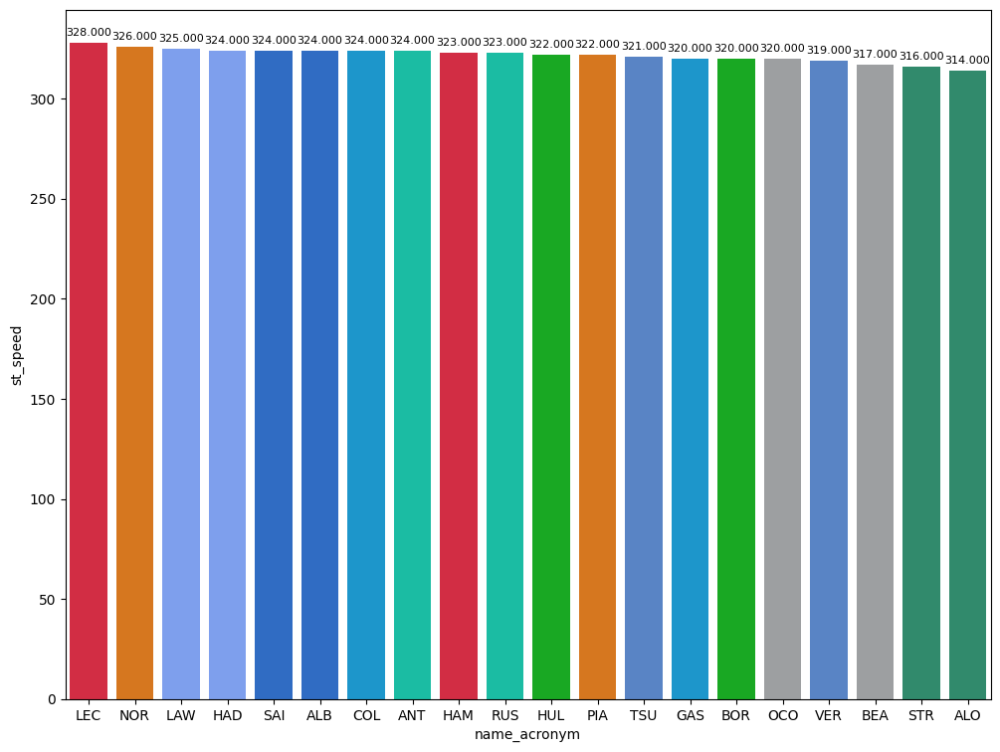

In [6]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

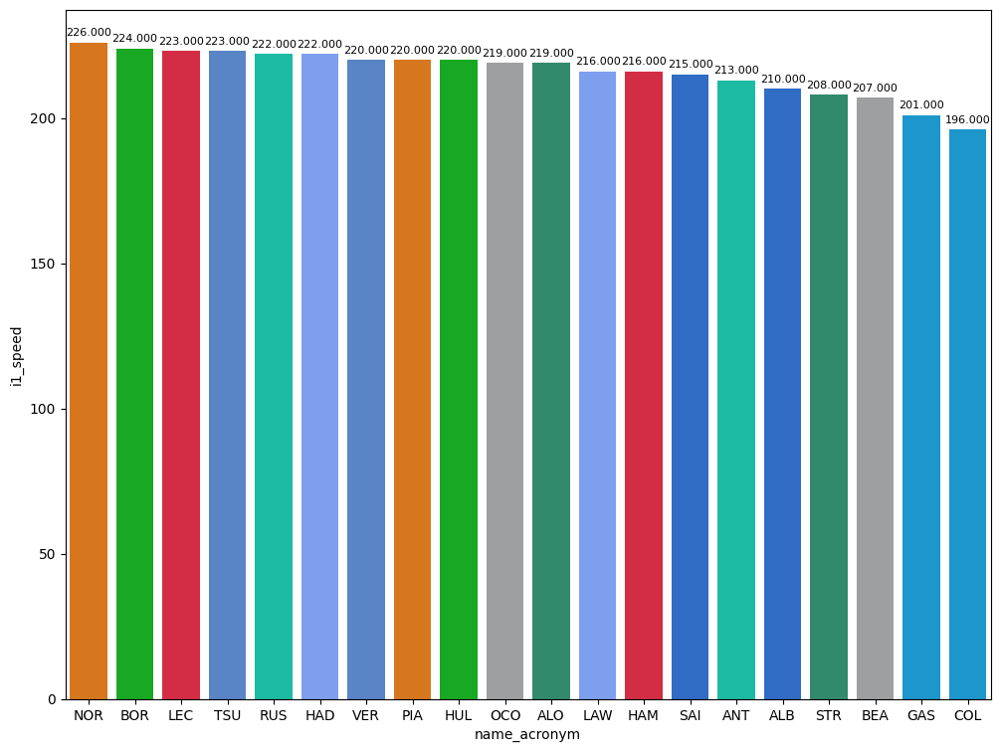

In [7]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

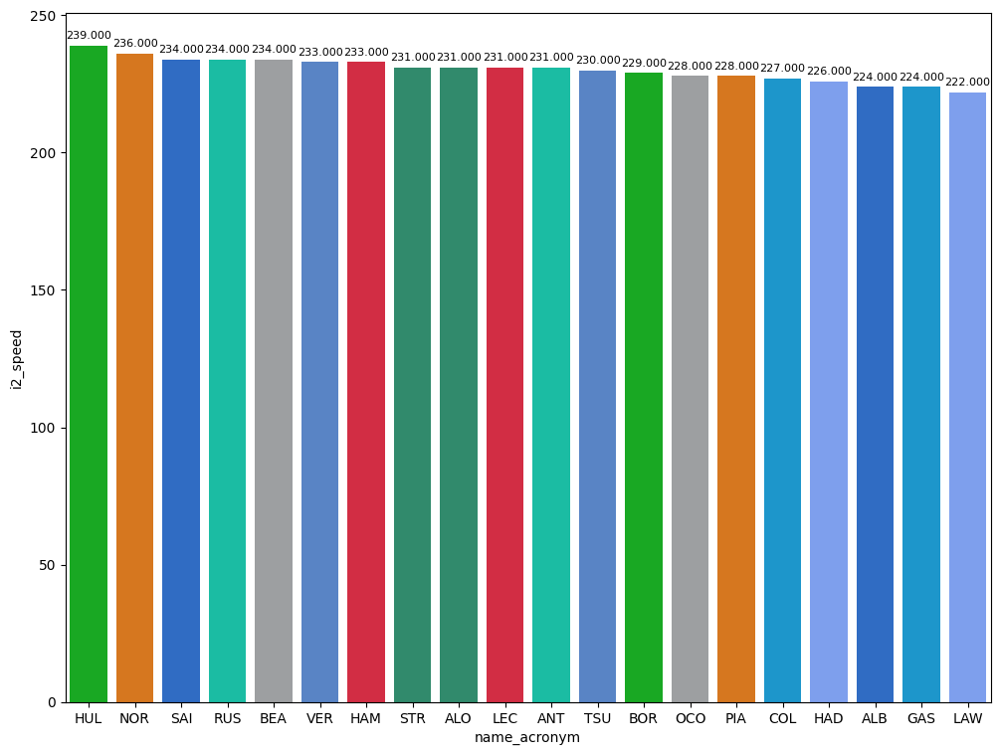

In [8]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [9]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
168,Lando NORRIS,SOFT,36.127,41.699,24.878,102.704


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session.

In [10]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


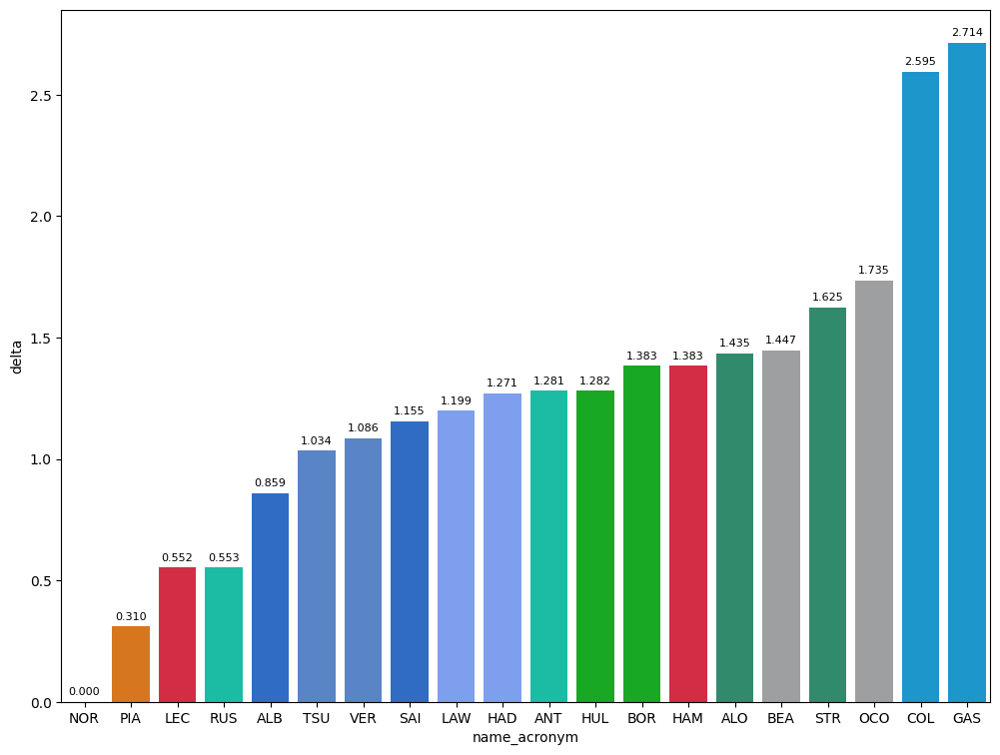

In [11]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

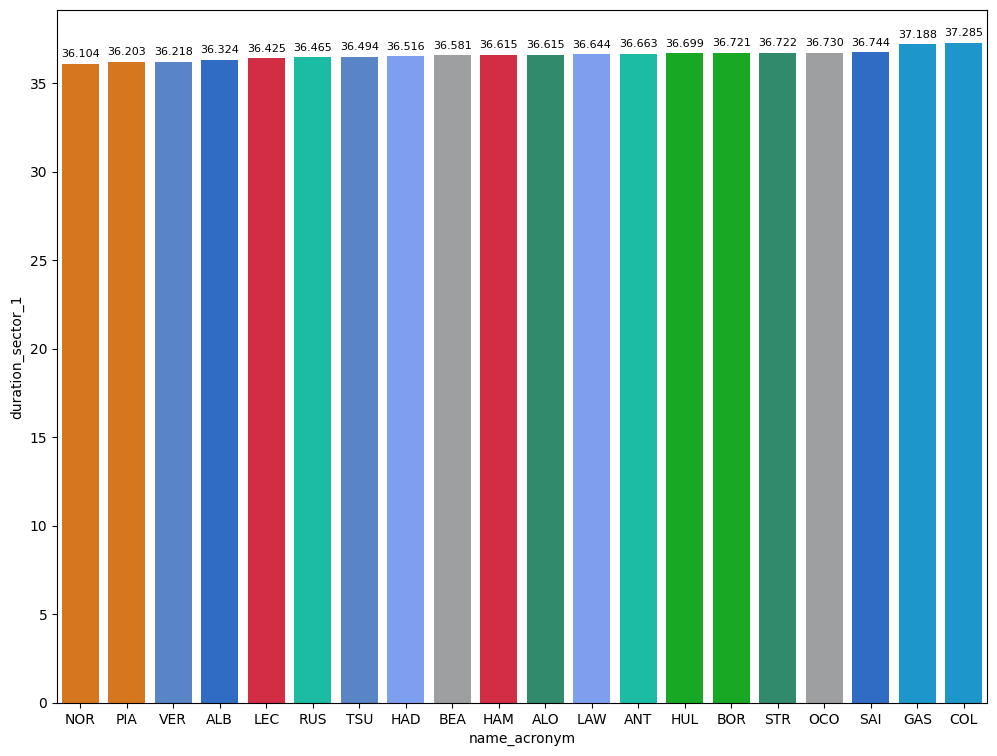

In [12]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin().dropna()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

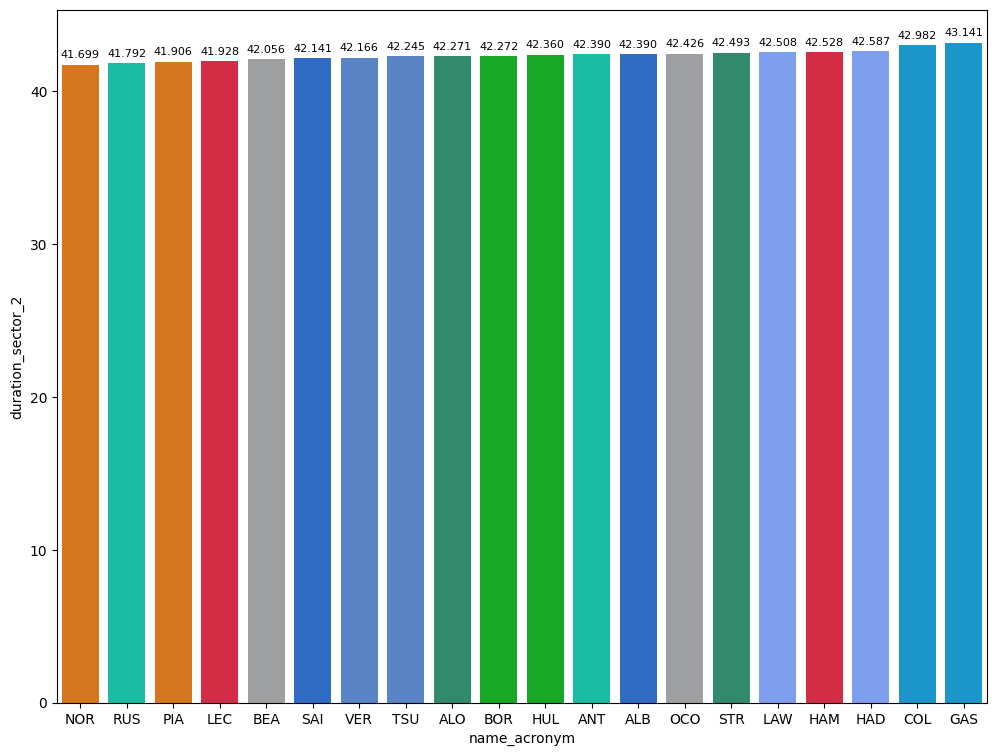

In [13]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin().dropna()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

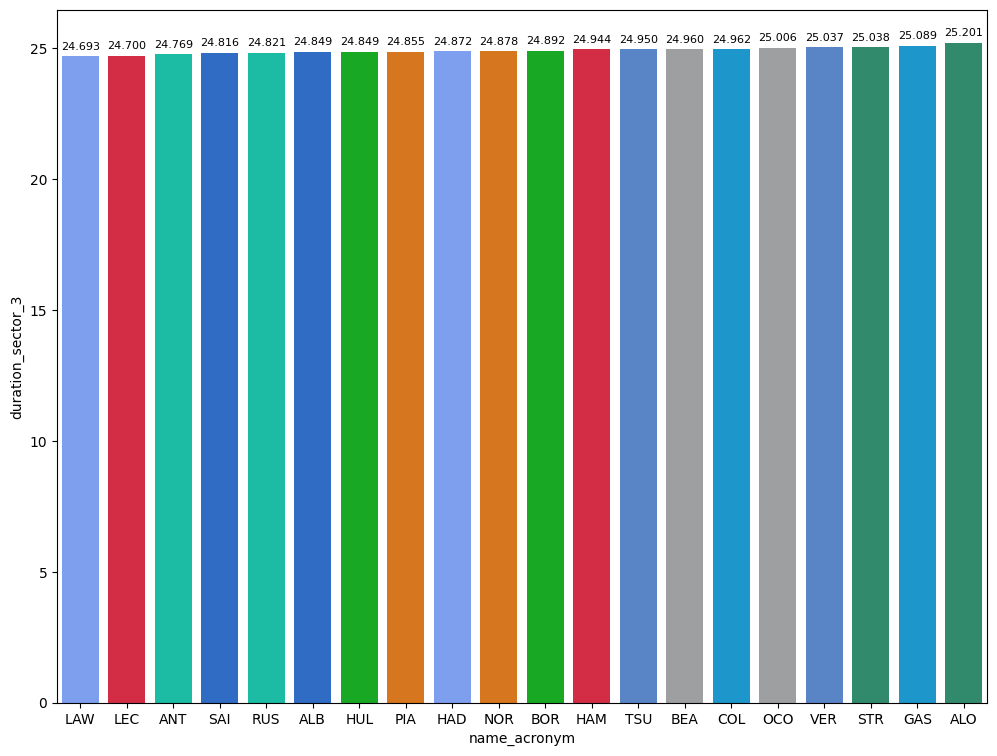

In [14]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin().dropna()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [15]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False and lap_duration > 106.5 and lap_duration <=109").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,107.4745


## Free Practice 2
### Obtain setup

In [16]:
practice = libraryDataF1.obtain_information('laps',session_key=9898	)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9898)
drivers = libraryDataF1.obtain_information('drivers',session_key=9898)

In [17]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

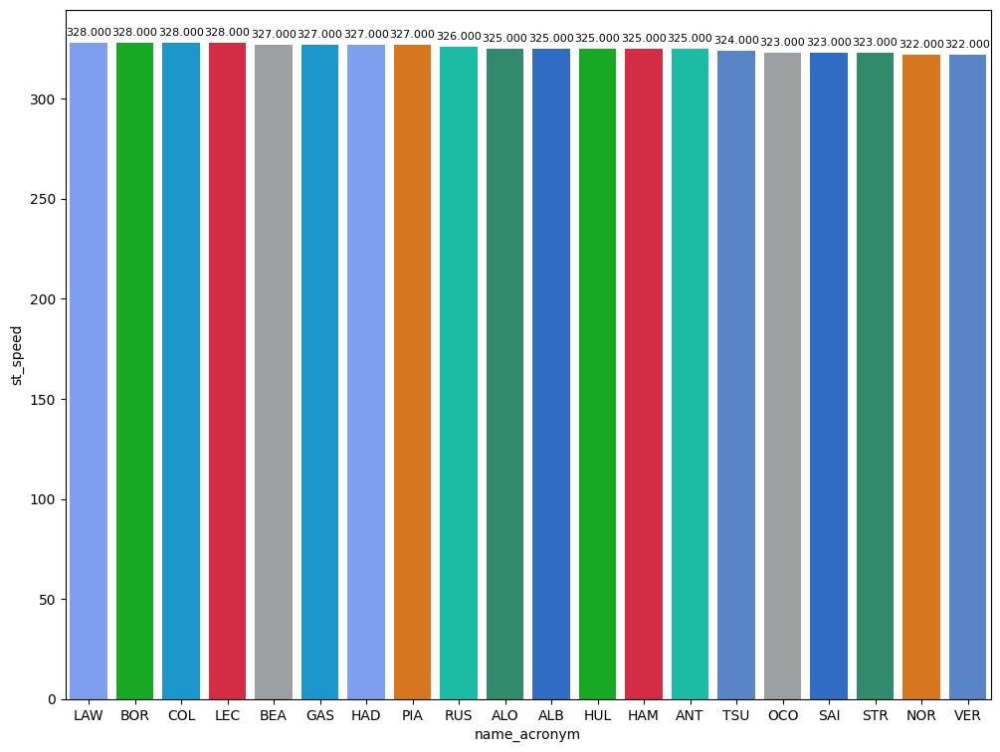

In [18]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

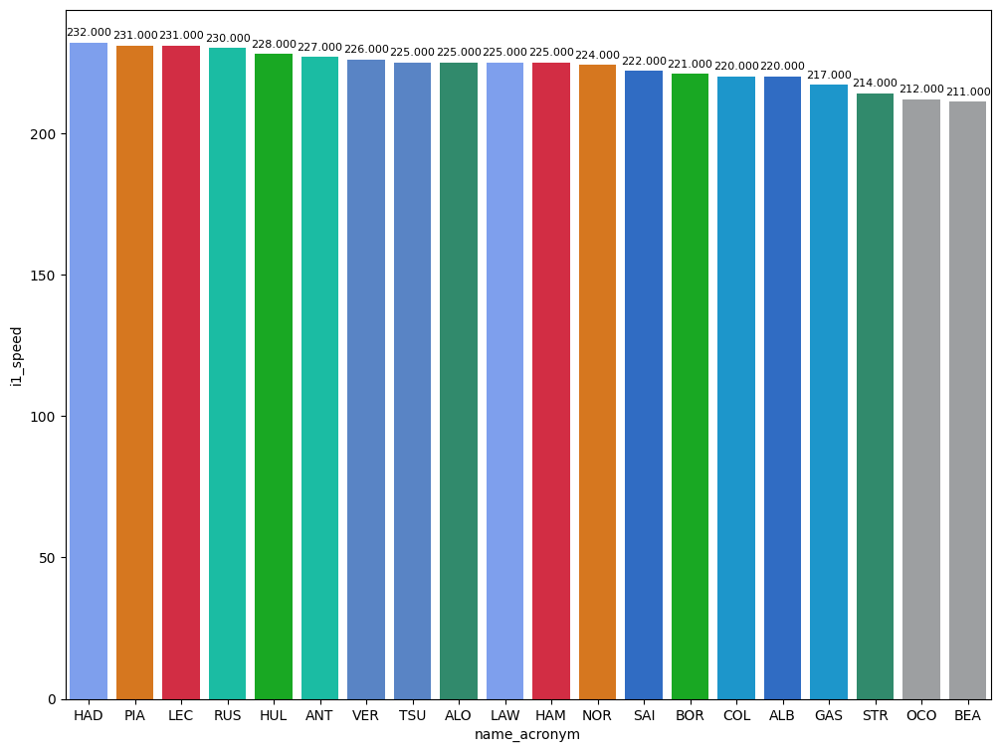

In [19]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

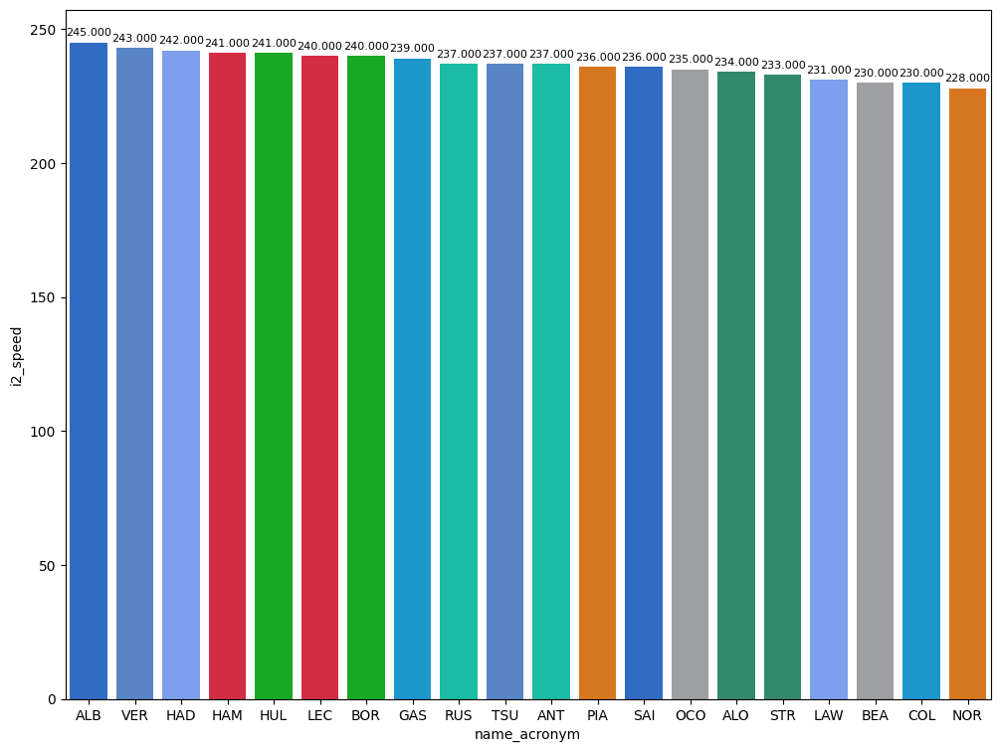

In [20]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [21]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
111,Alexander ALBON,HARD,35.953,41.450,25.215,102.618
136,Lewis HAMILTON,MEDIUM,35.622,41.126,24.795,101.543
260,Lewis HAMILTON,SOFT,35.517,41.073,24.703,101.293
318,Gabriel BORTOLETO,UNKNOWN,38.071,43.351,25.414,106.836


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session.Due to changing conditions, only a part of the free practice were important and this part will be taken into consideration.

In [22]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


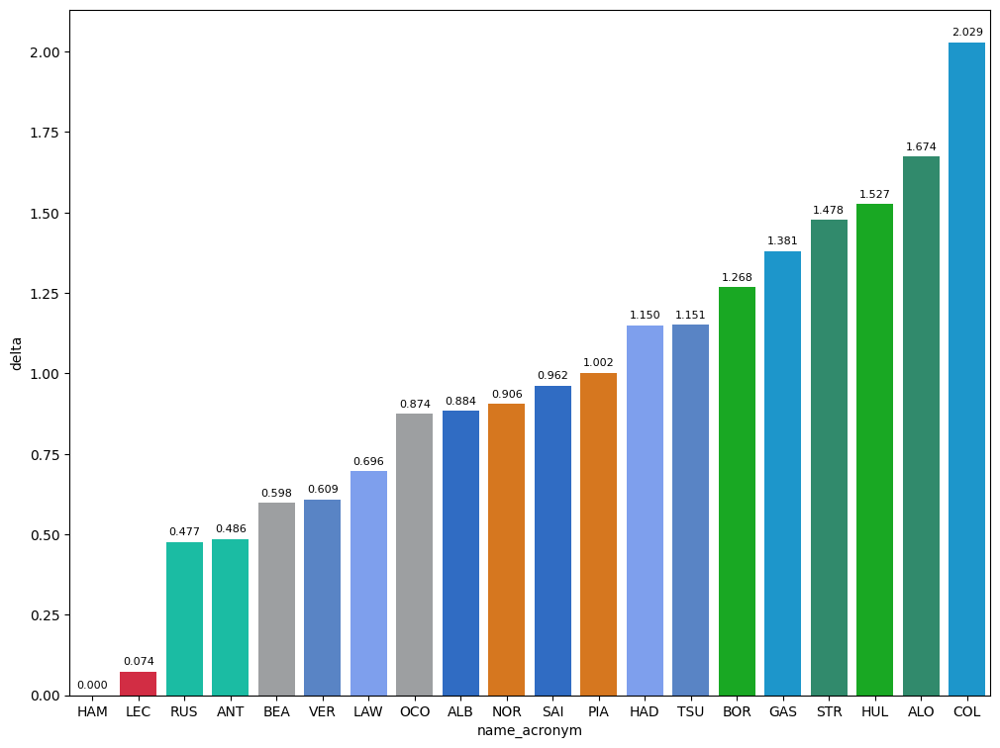

In [23]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

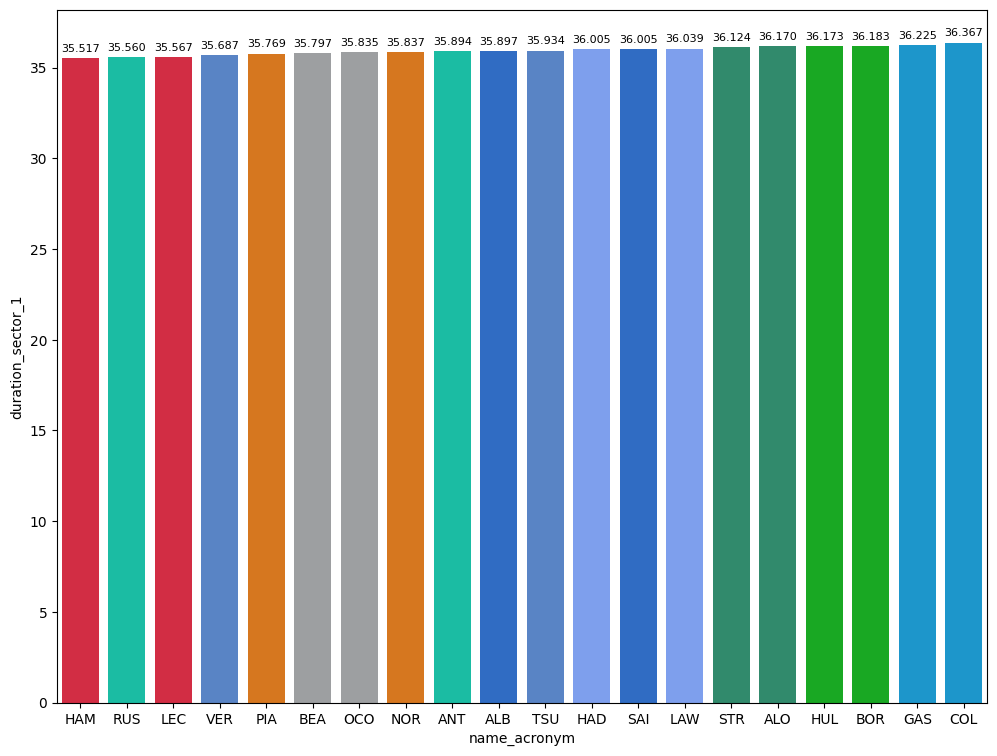

In [24]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin().dropna()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

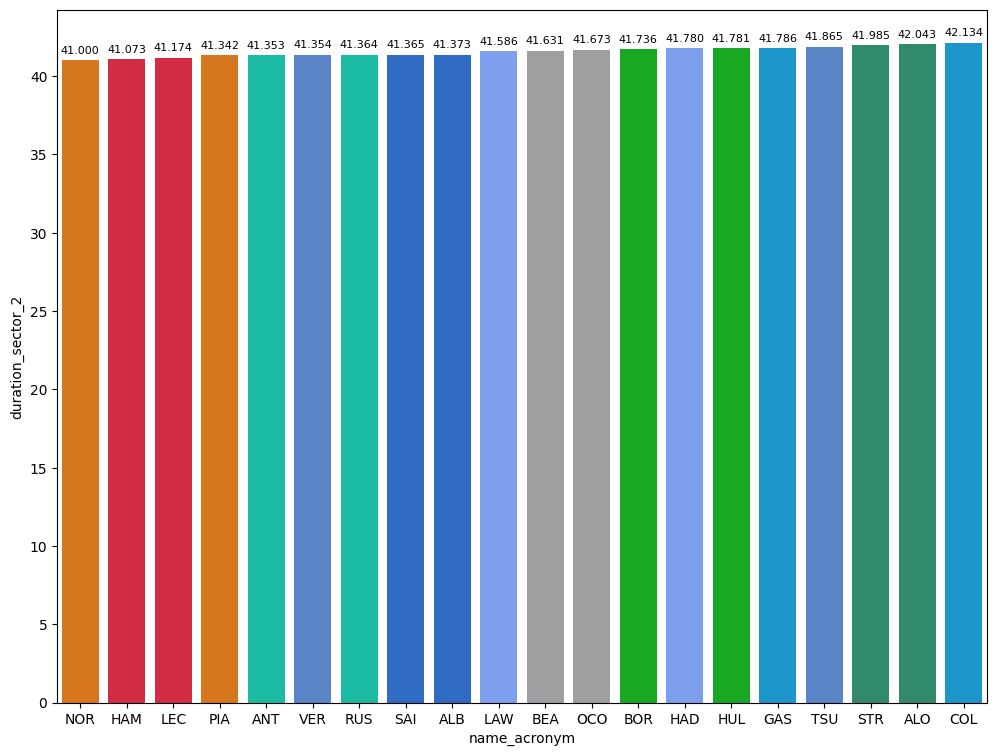

In [25]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin().dropna()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

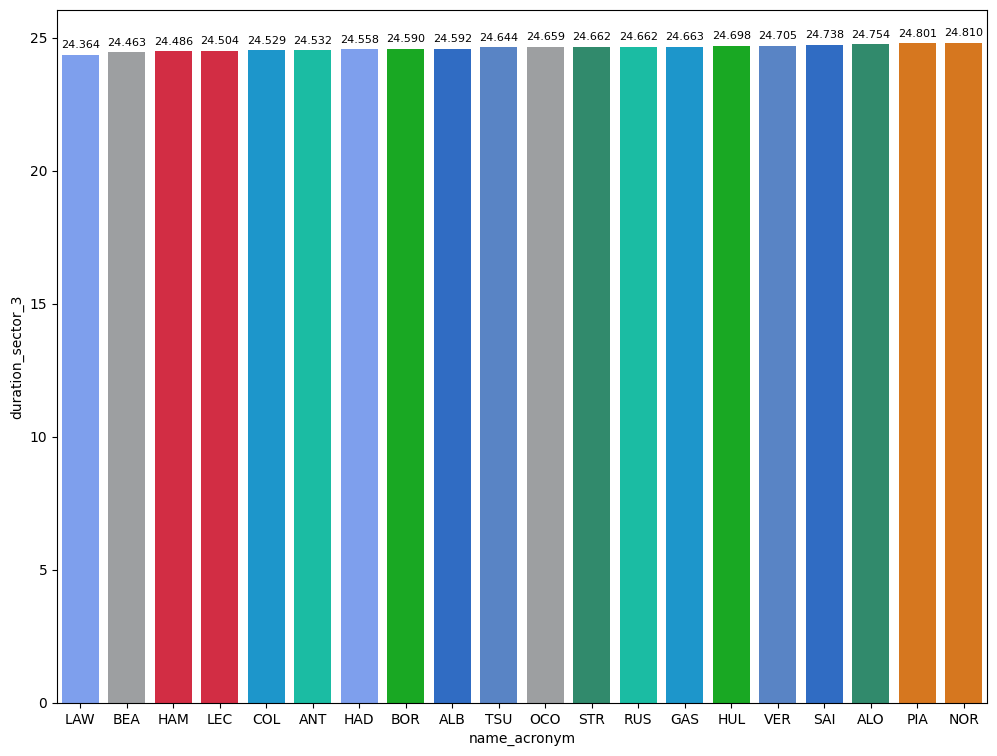

In [26]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin().dropna()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [27]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration>108 and lap_duration <=113").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
UNKNOWN,108.122000
MEDIUM,108.896700
SOFT,109.099364
HARD,110.729000


### Long runs

In [107]:
MINIMUN_SECONDS = 106
MAXIMUM_SECONDS = 109

#### Red Bull Racing

In [108]:
stintInformation.query('driver_number == 1 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
13,1269,9898,1,22,1,7,SOFT,0
16,1269,9898,1,1,1,7,SOFT,0
41,1269,9898,2,1,8,13,SOFT,0
42,1269,9898,2,22,8,13,MEDIUM,0
55,1269,9898,3,1,14,22,SOFT,6
56,1269,9898,3,22,14,22,MEDIUM,6


In [109]:
data = libraryDataF1.getinfolongruns(jointables2,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
307,Max VERSTAPPEN,SOFT,2025-09-19T12:51:33.321000+00:00,16,37.844,43.488,25.462,106.794
324,Max VERSTAPPEN,SOFT,2025-09-19T12:53:20.084000+00:00,17,37.739,43.444,25.384,106.567
343,Max VERSTAPPEN,SOFT,2025-09-19T12:55:06.582000+00:00,18,37.861,43.403,25.438,106.702
380,Max VERSTAPPEN,SOFT,2025-09-19T12:58:42.726000+00:00,20,37.743,43.189,25.267,106.199


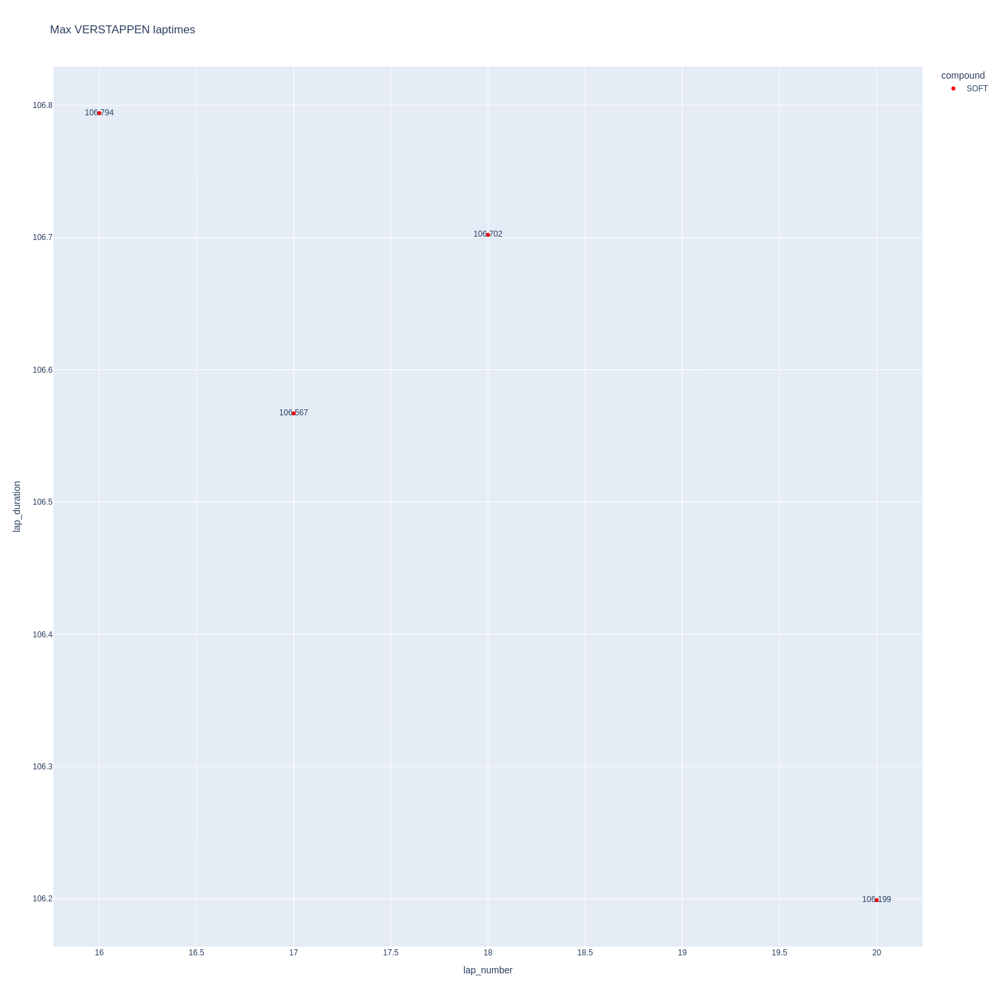

In [110]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

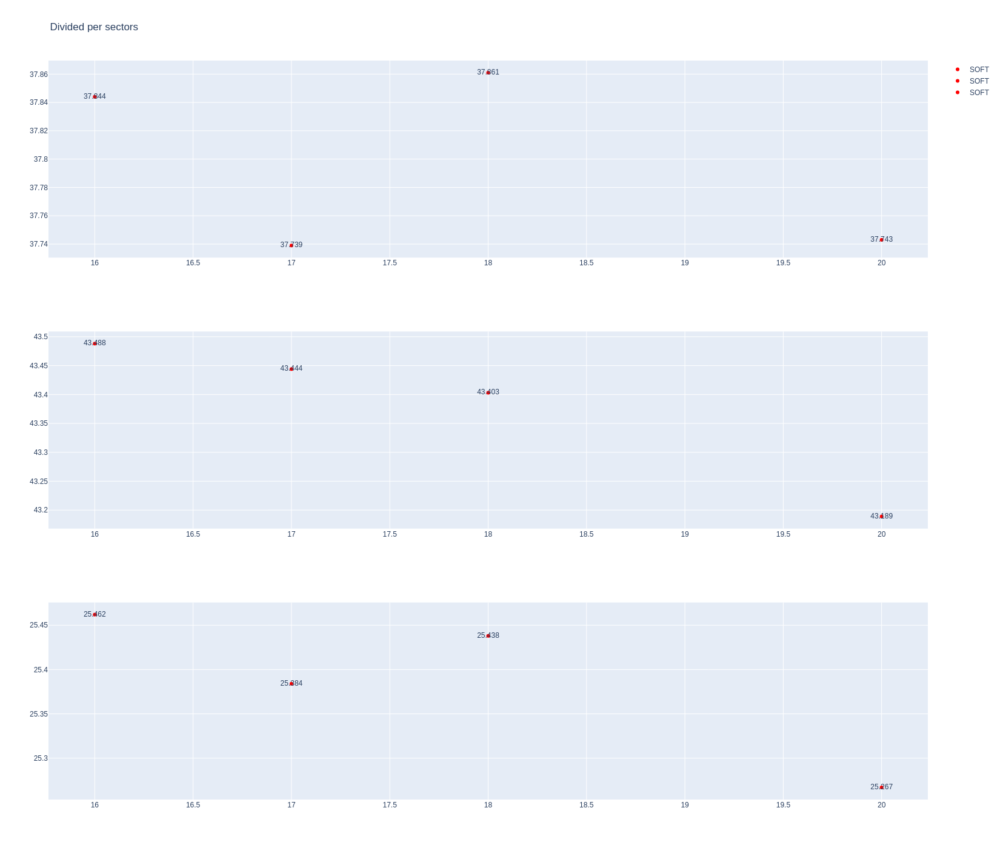

In [111]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [112]:
data = libraryDataF1.getinfolongruns(jointables2,22,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
107,Yuki TSUNODA,SOFT,2025-09-19T12:14:14.679000+00:00,6,36.120,41.865,30.733,108.718
308,Yuki TSUNODA,MEDIUM,2025-09-19T12:51:40.385000+00:00,16,38.077,43.533,25.380,106.990
325,Yuki TSUNODA,MEDIUM,2025-09-19T12:53:27.298000+00:00,17,37.885,43.521,25.374,106.780
344,Yuki TSUNODA,MEDIUM,2025-09-19T12:55:14.175000+00:00,18,37.895,43.543,25.423,106.861
363,Yuki TSUNODA,MEDIUM,2025-09-19T12:57:01.066000+00:00,19,38.543,43.886,25.327,107.756
381,Yuki TSUNODA,MEDIUM,2025-09-19T12:58:49.069000+00:00,20,37.729,43.202,25.246,106.177


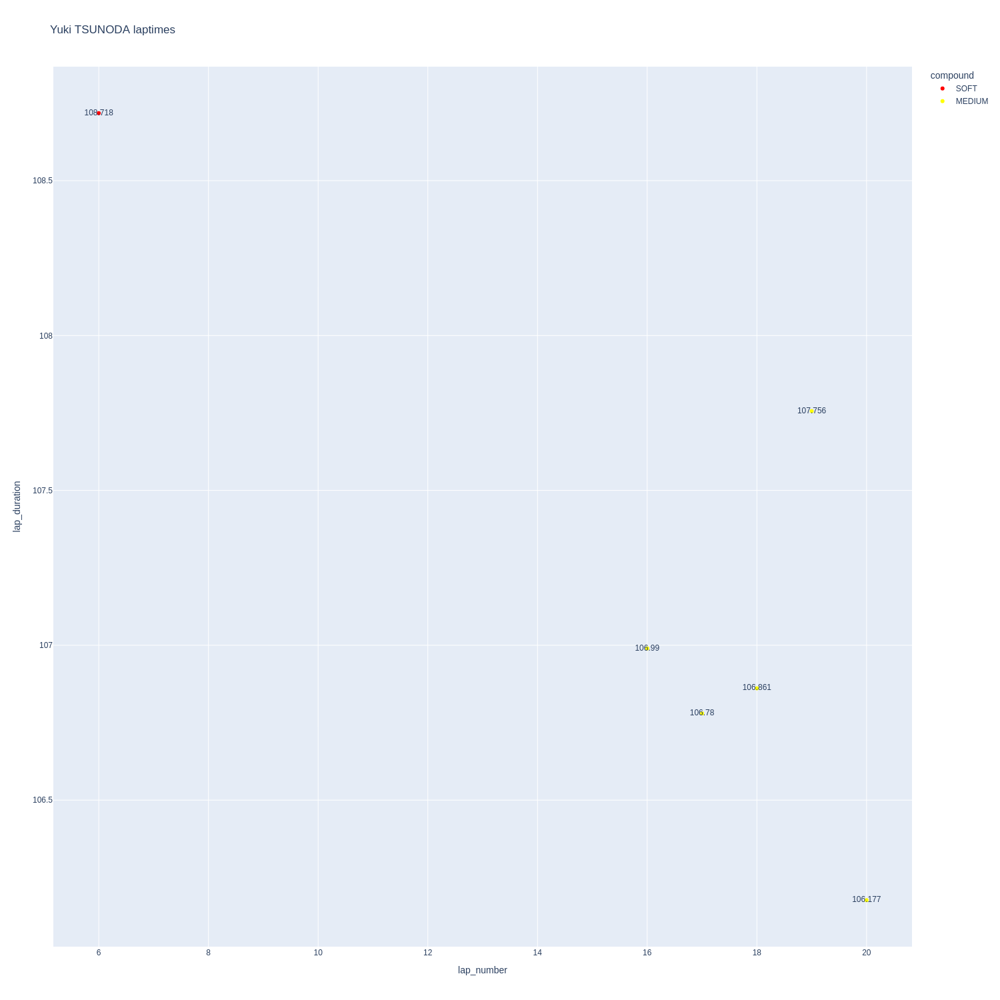

In [113]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

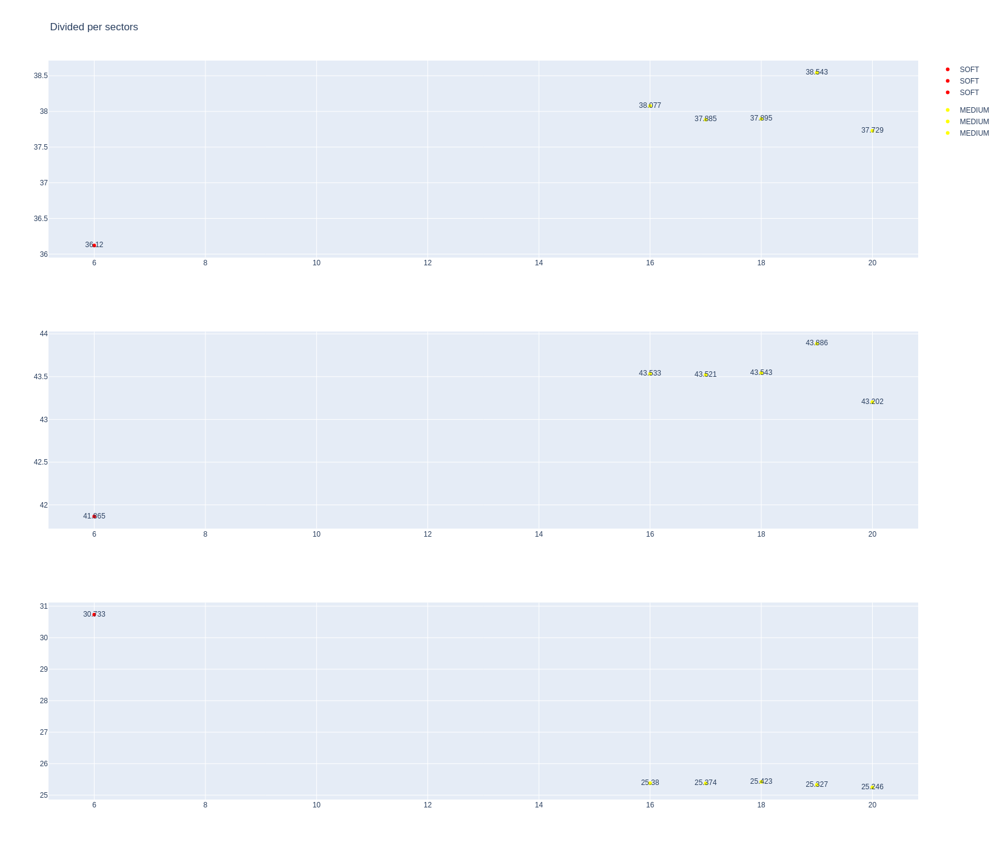

In [114]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [115]:
stintInformation.query('driver_number == 44 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
21,1269,9898,1,16,1,9,SOFT,0
23,1269,9898,1,44,1,8,MEDIUM,0
29,1269,9898,2,16,10,14,SOFT,0
30,1269,9898,2,44,9,12,SOFT,0
47,1269,9898,3,16,15,16,SOFT,0
49,1269,9898,3,44,13,15,SOFT,4
62,1269,9898,4,16,17,23,SOFT,0
65,1269,9898,4,44,16,21,MEDIUM,8


In [116]:
data = libraryDataF1.getinfolongruns(jointables2,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
323,Charles LECLERC,SOFT,2025-09-19T12:53:09.821000+00:00,18,37.751,43.139,25.265,106.155
342,Charles LECLERC,SOFT,2025-09-19T12:54:55.941000+00:00,19,37.656,43.294,25.427,106.377
389,Charles LECLERC,SOFT,2025-09-19T12:59:18.370000+00:00,21,37.624,43.199,25.282,106.105


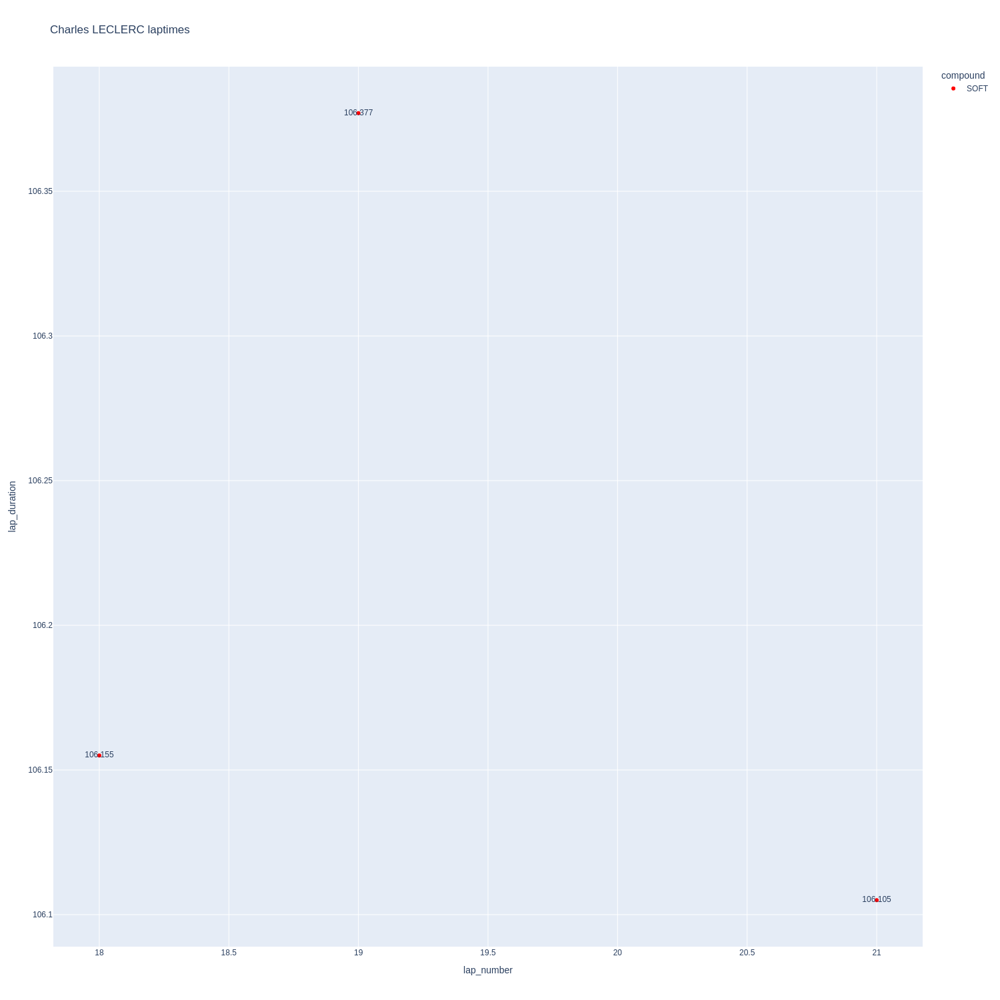

In [117]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

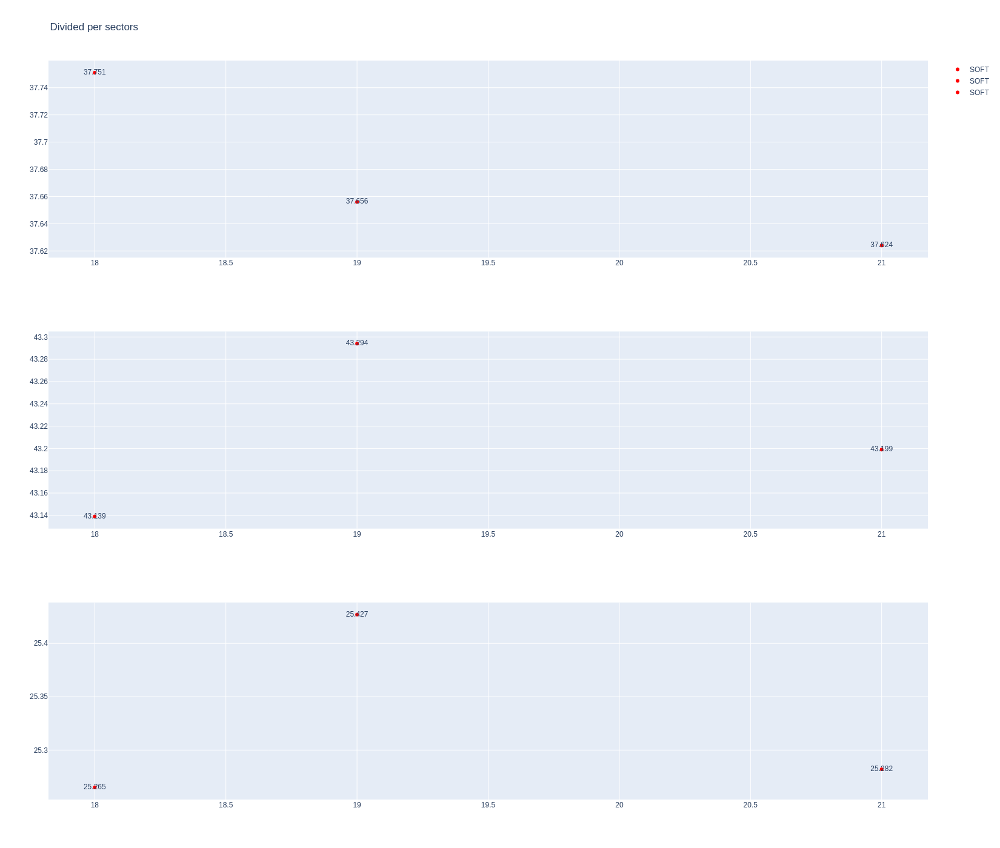

In [118]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [119]:
data = libraryDataF1.getinfolongruns(jointables2,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
354,Lewis HAMILTON,MEDIUM,2025-09-19T12:56:06.613000+00:00,17,37.701,43.204,25.510,106.415
373,Lewis HAMILTON,MEDIUM,2025-09-19T12:57:53.041000+00:00,18,37.674,43.164,25.416,106.254
392,Lewis HAMILTON,MEDIUM,2025-09-19T12:59:39.317000+00:00,19,37.644,43.202,25.376,106.222


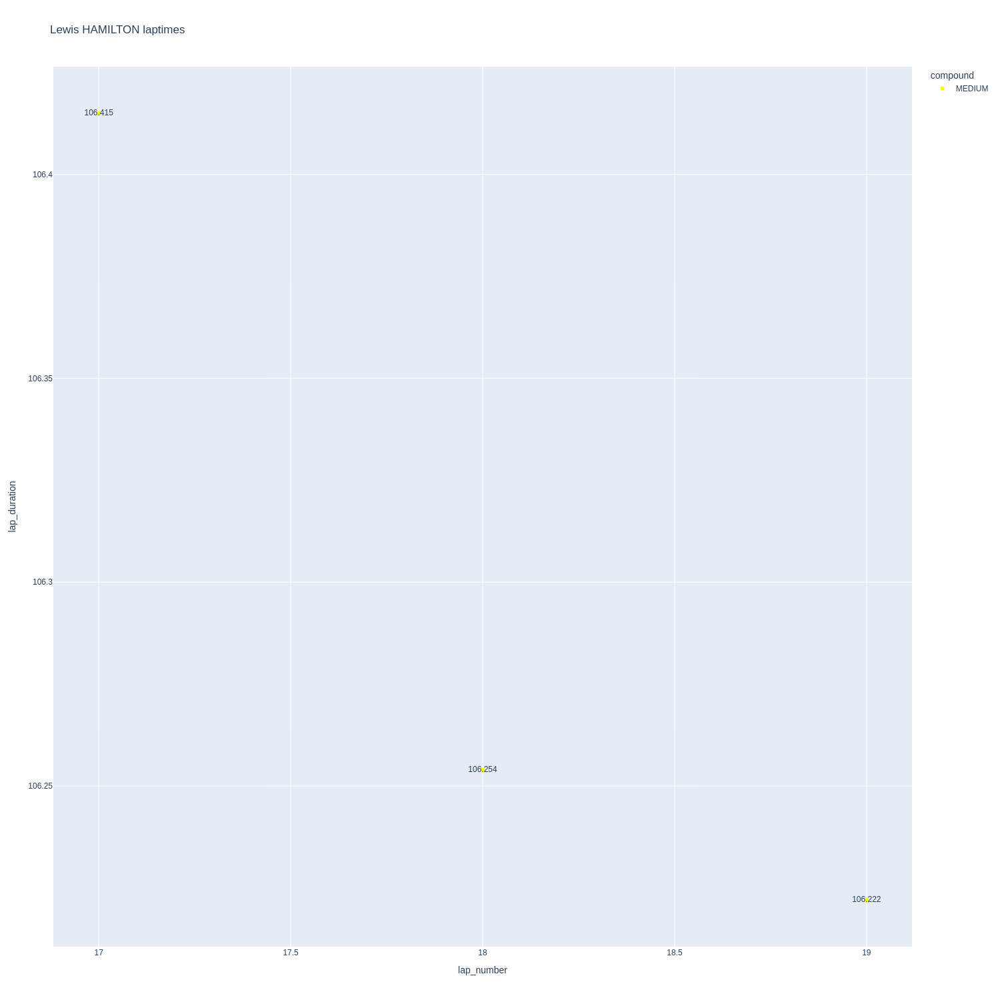

In [120]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

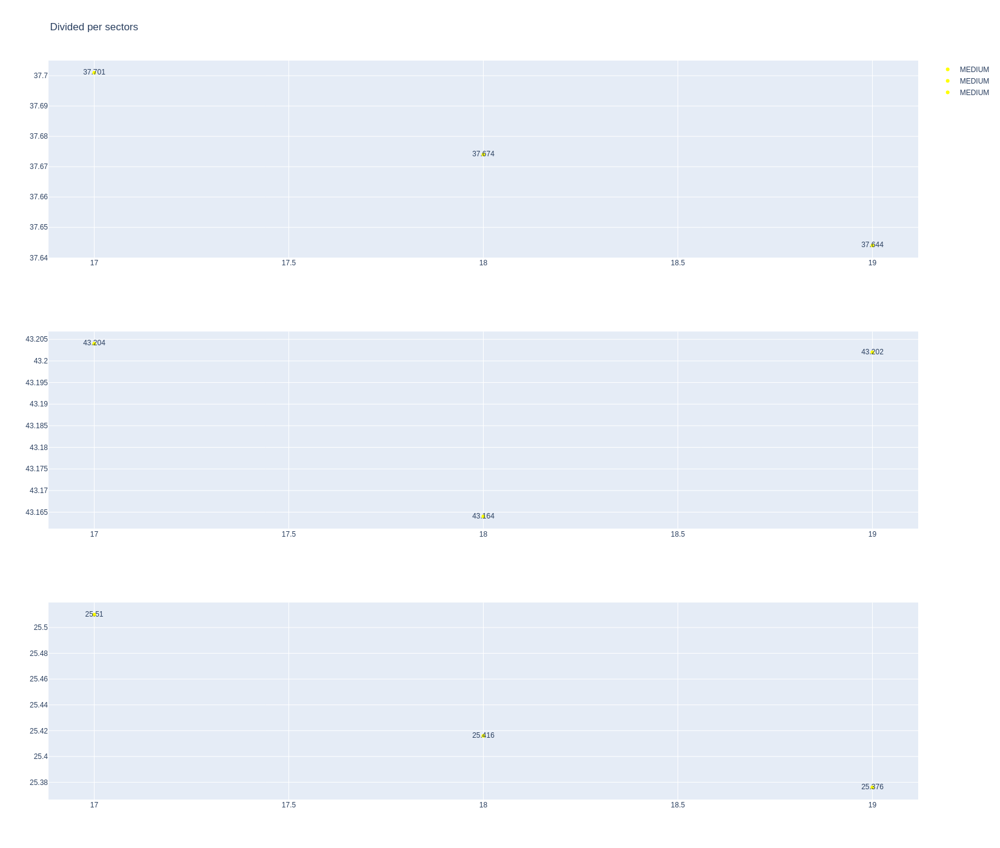

In [121]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [122]:
stintInformation.query('driver_number == 63 or driver_number == 12')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
14,1269,9898,1,12,1,7,SOFT,0
24,1269,9898,1,63,1,6,SOFT,0
27,1269,9898,2,12,8,11,SOFT,0
28,1269,9898,2,63,7,9,SOFT,0
45,1269,9898,3,63,10,11,SOFT,0
46,1269,9898,3,12,12,14,SOFT,4
67,1269,9898,4,63,12,19,SOFT,6
68,1269,9898,4,12,15,22,SOFT,7


In [123]:
data = libraryDataF1.getinfolongruns(jointables2,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
319,Kimi ANTONELLI,SOFT,2025-09-19T12:52:44.547000+00:00,16,37.657,43.642,25.377,106.676
338,Kimi ANTONELLI,SOFT,2025-09-19T12:54:31.191000+00:00,17,37.802,43.695,25.408,106.905
357,Kimi ANTONELLI,SOFT,2025-09-19T12:56:18.066000+00:00,18,37.775,43.779,25.591,107.145
375,Kimi ANTONELLI,SOFT,2025-09-19T12:58:05.254000+00:00,19,37.895,44.211,25.522,107.628
394,Kimi ANTONELLI,SOFT,2025-09-19T12:59:52.817000+00:00,20,37.993,44.114,25.410,107.517


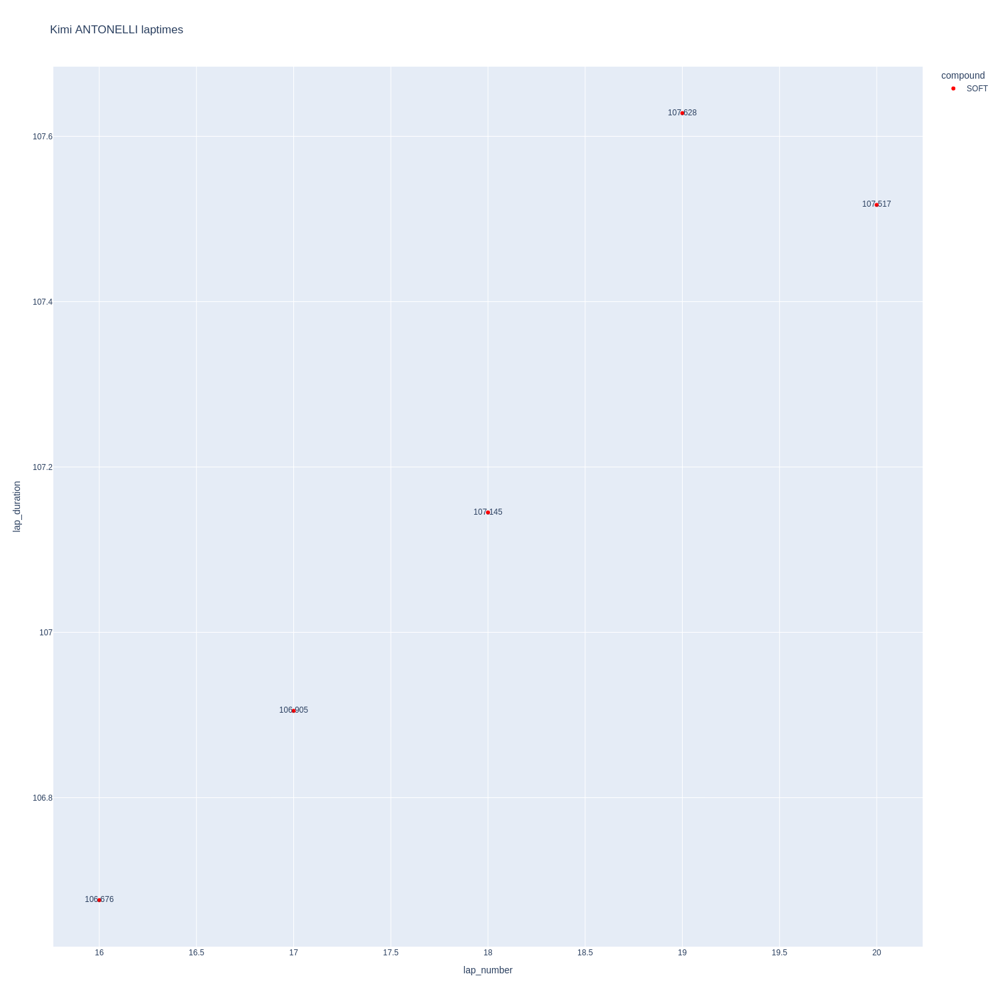

In [124]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

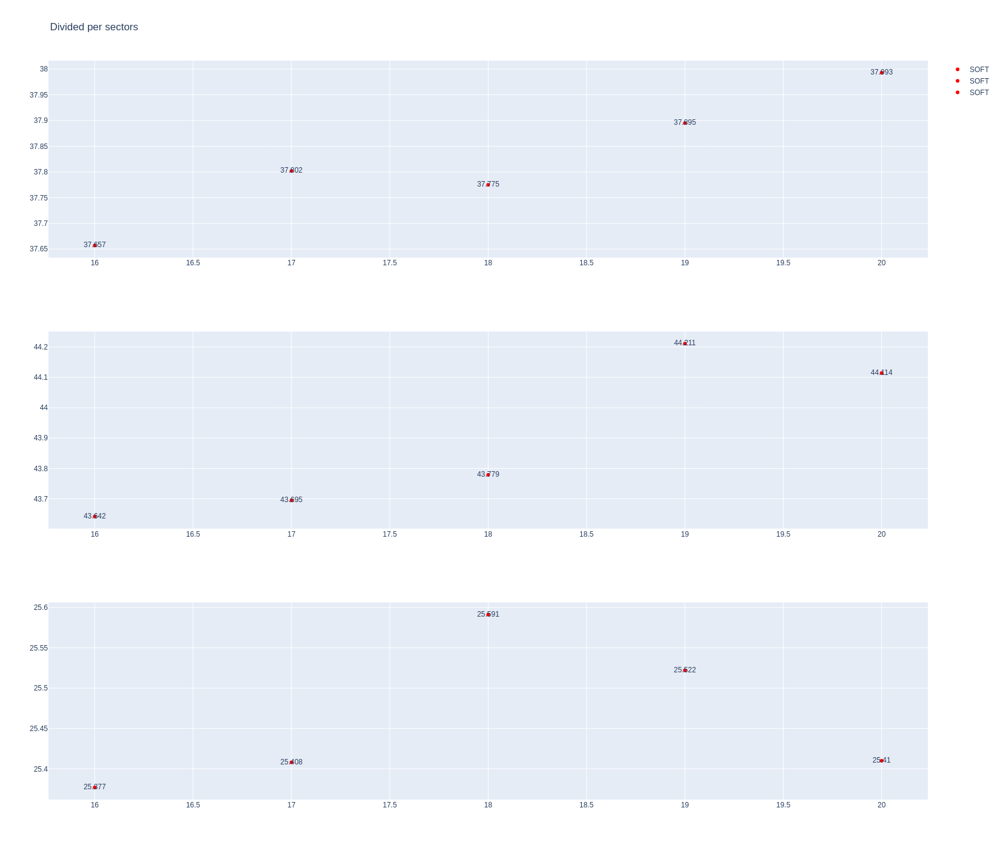

In [125]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [126]:
data = libraryDataF1.getinfolongruns(jointables2,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
316,George RUSSELL,SOFT,2025-09-19T12:52:24.226000+00:00,13,38.162,43.819,25.528,107.509
335,George RUSSELL,SOFT,2025-09-19T12:54:11.722000+00:00,14,38.020,43.362,25.489,106.871
353,George RUSSELL,SOFT,2025-09-19T12:55:58.488000+00:00,15,37.738,43.520,25.505,106.763
372,George RUSSELL,SOFT,2025-09-19T12:57:45.361000+00:00,16,37.823,43.795,25.510,107.128


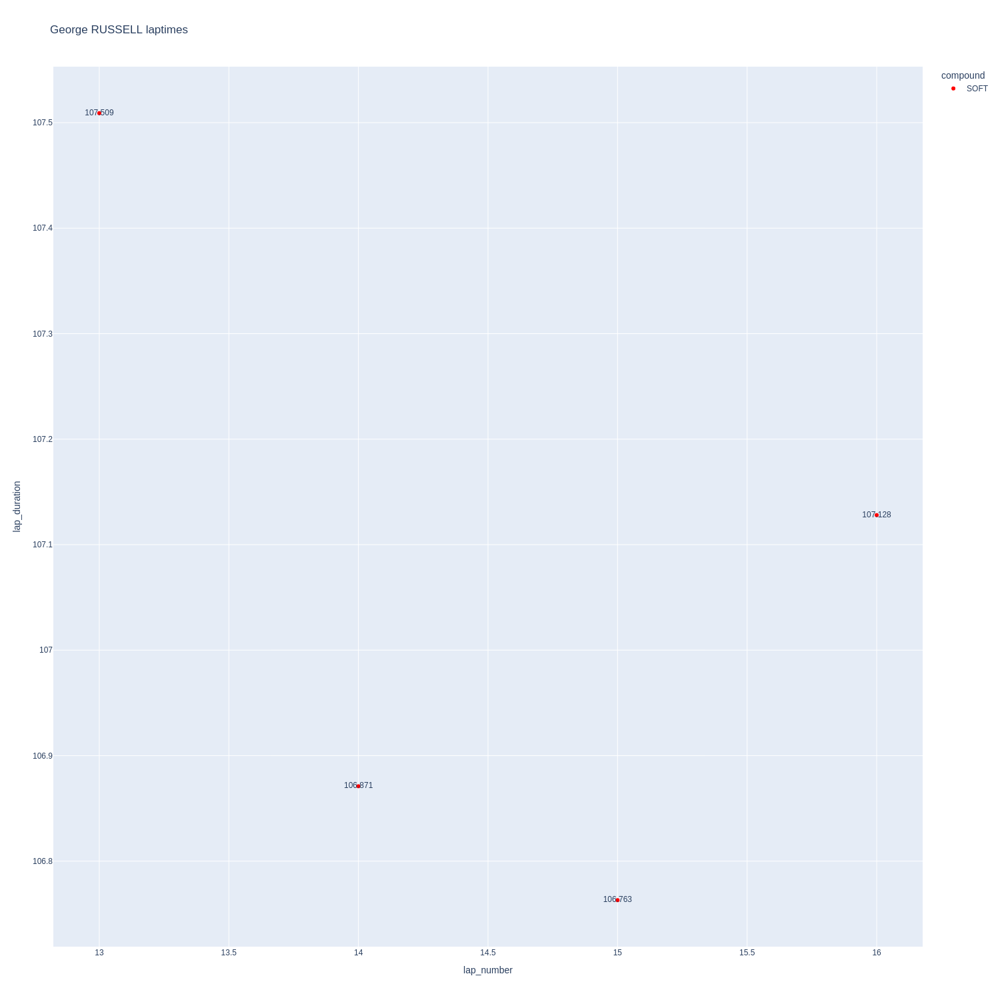

In [127]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

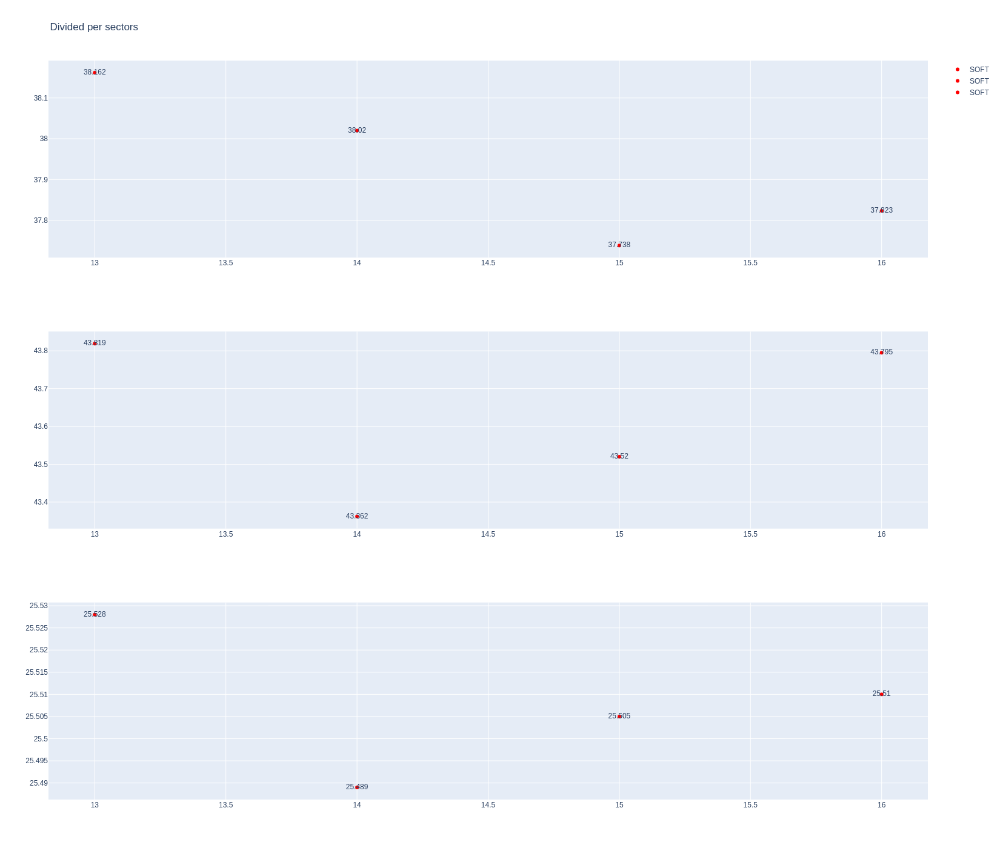

In [128]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [129]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1269,9898,1,81,1,3,SOFT,0
3,1269,9898,2,81,4,6,SOFT,3
5,1269,9898,1,4,1,5,SOFT,0
18,1269,9898,3,81,7,8,SOFT,6
19,1269,9898,2,4,6,7,SOFT,5
26,1269,9898,4,81,9,11,SOFT,0
44,1269,9898,5,81,12,15,SOFT,0
57,1269,9898,6,81,16,23,SOFT,7


In [130]:
data = libraryDataF1.getinfolongruns(jointables2,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
120,Lando NORRIS,SOFT,2025-09-19T12:15:39.093000+00:00,5,35.837,41.0,31.788,108.625


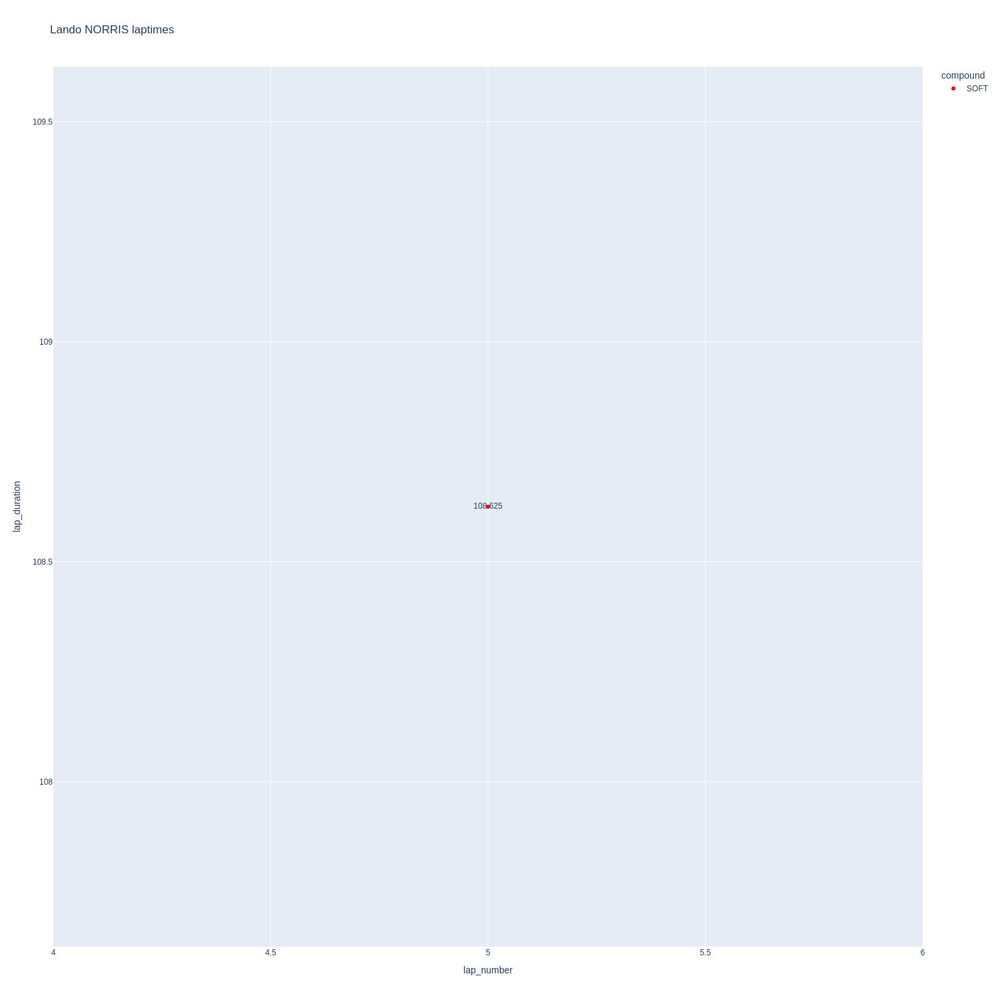

In [131]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

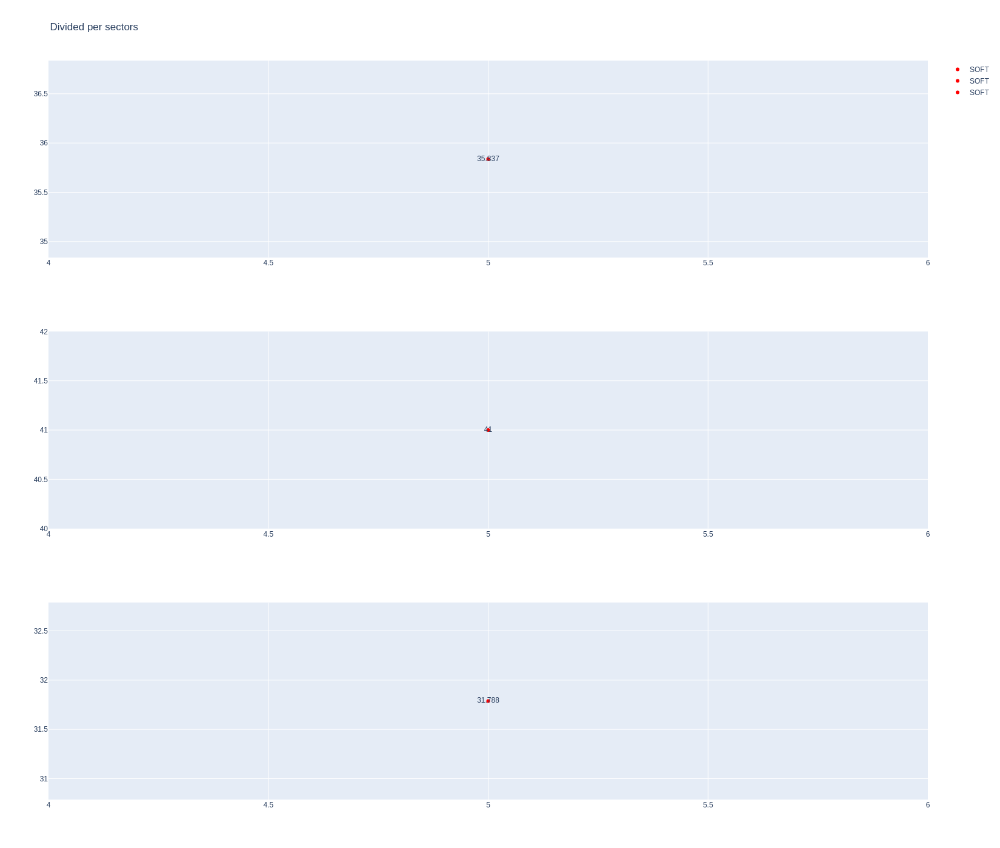

In [132]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [133]:
data = libraryDataF1.getinfolongruns(jointables2,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
327,Oscar PIASTRI,SOFT,2025-09-19T12:53:32.894000+00:00,18,37.810,43.619,25.390,106.819
345,Oscar PIASTRI,SOFT,2025-09-19T12:55:19.722000+00:00,19,38.077,43.688,25.453,107.218
364,Oscar PIASTRI,SOFT,2025-09-19T12:57:06.879000+00:00,20,38.288,43.779,25.402,107.469
382,Oscar PIASTRI,SOFT,2025-09-19T12:58:54.398000+00:00,21,38.130,43.678,25.480,107.288


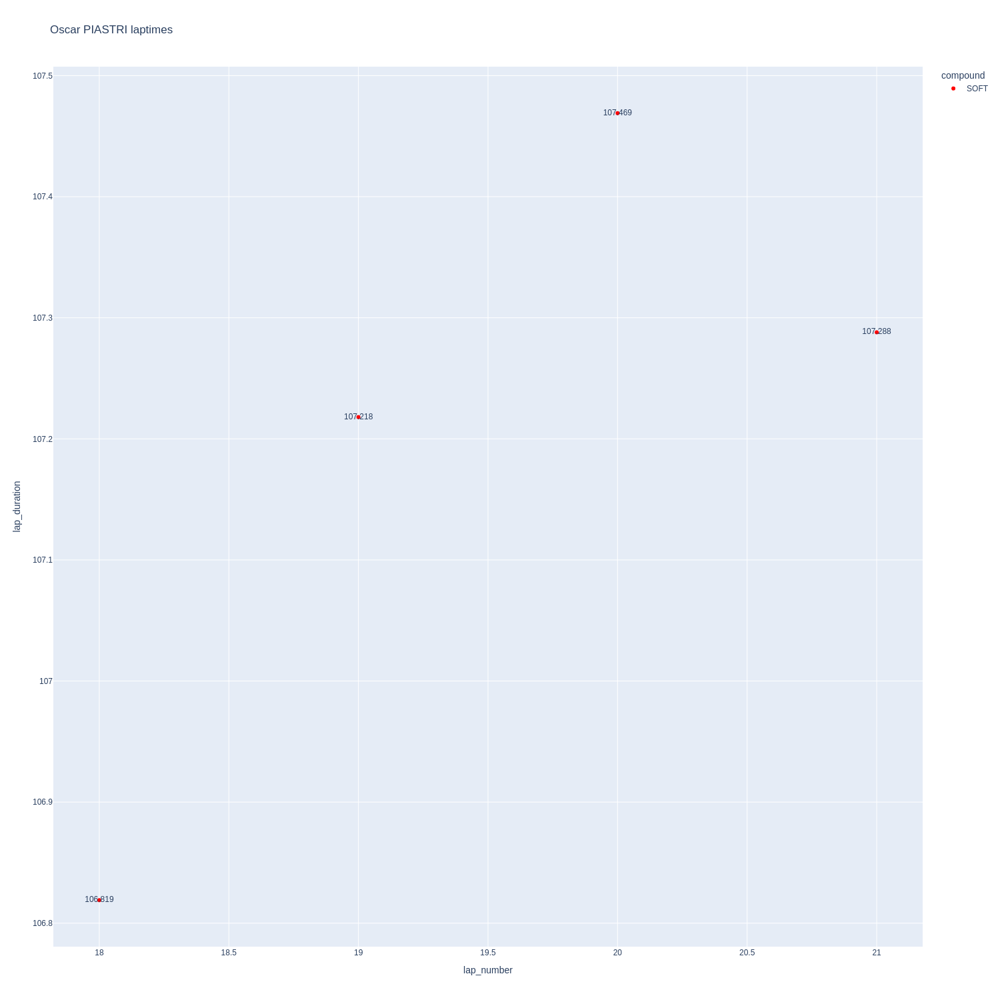

In [134]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

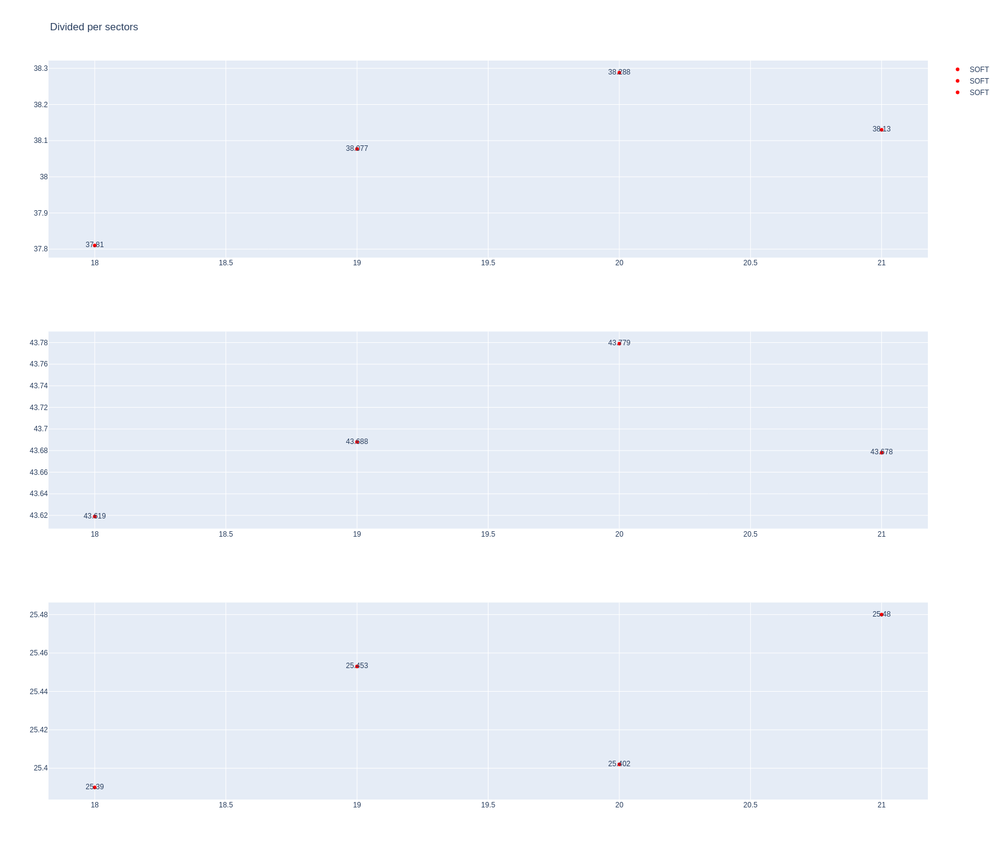

In [135]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [136]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1269,9898,1,18,1,5,SOFT,0
6,1269,9898,2,18,6,8,SOFT,5
20,1269,9898,1,14,1,9,SOFT,0
25,1269,9898,3,18,9,11,SOFT,0
39,1269,9898,4,18,12,14,SOFT,3
43,1269,9898,2,14,10,15,SOFT,0
63,1269,9898,5,18,15,24,SOFT,6
64,1269,9898,3,14,16,24,SOFT,6


In [137]:
data = libraryDataF1.getinfolongruns(jointables2,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
301,Fernando ALONSO,SOFT,2025-09-19T12:50:44.850000+00:00,17,38.459,43.928,25.623,108.010
317,Fernando ALONSO,SOFT,2025-09-19T12:52:32.809000+00:00,18,38.194,43.964,25.567,107.725
336,Fernando ALONSO,SOFT,2025-09-19T12:54:20.519000+00:00,19,38.439,44.255,25.490,108.184


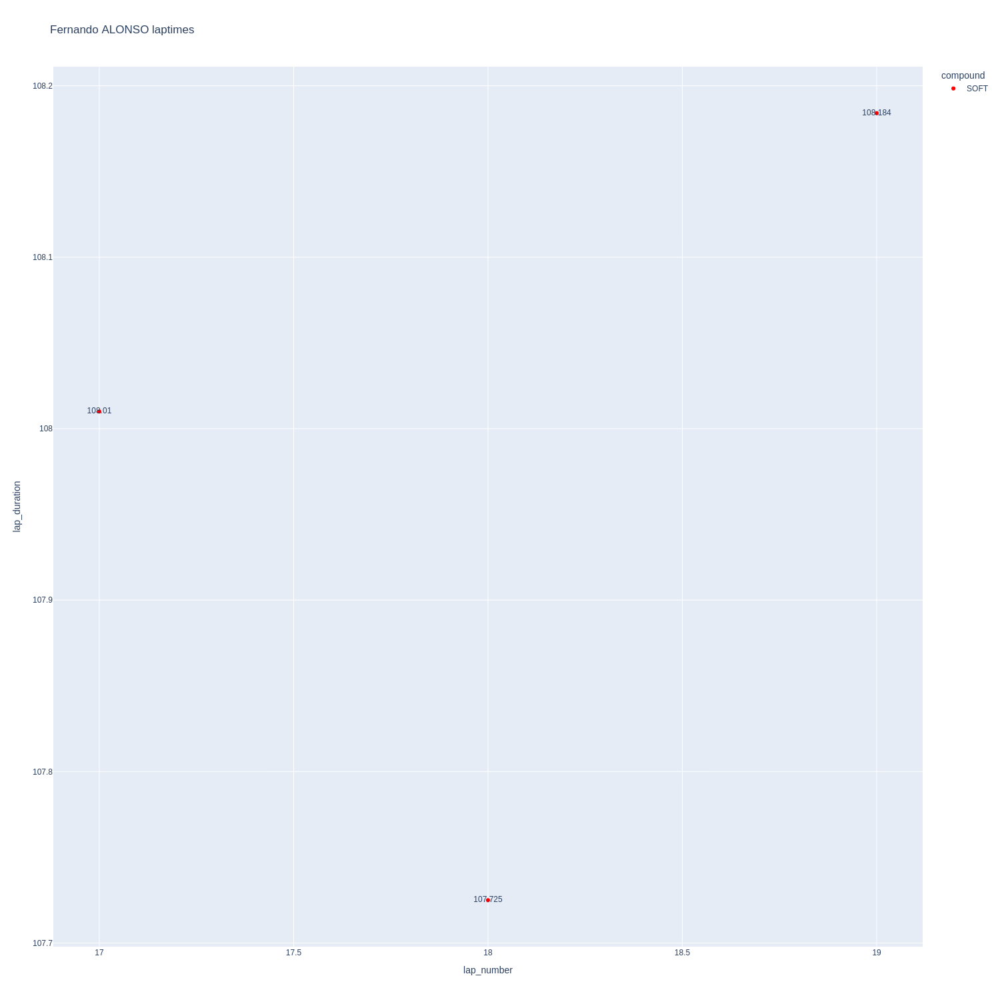

In [138]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

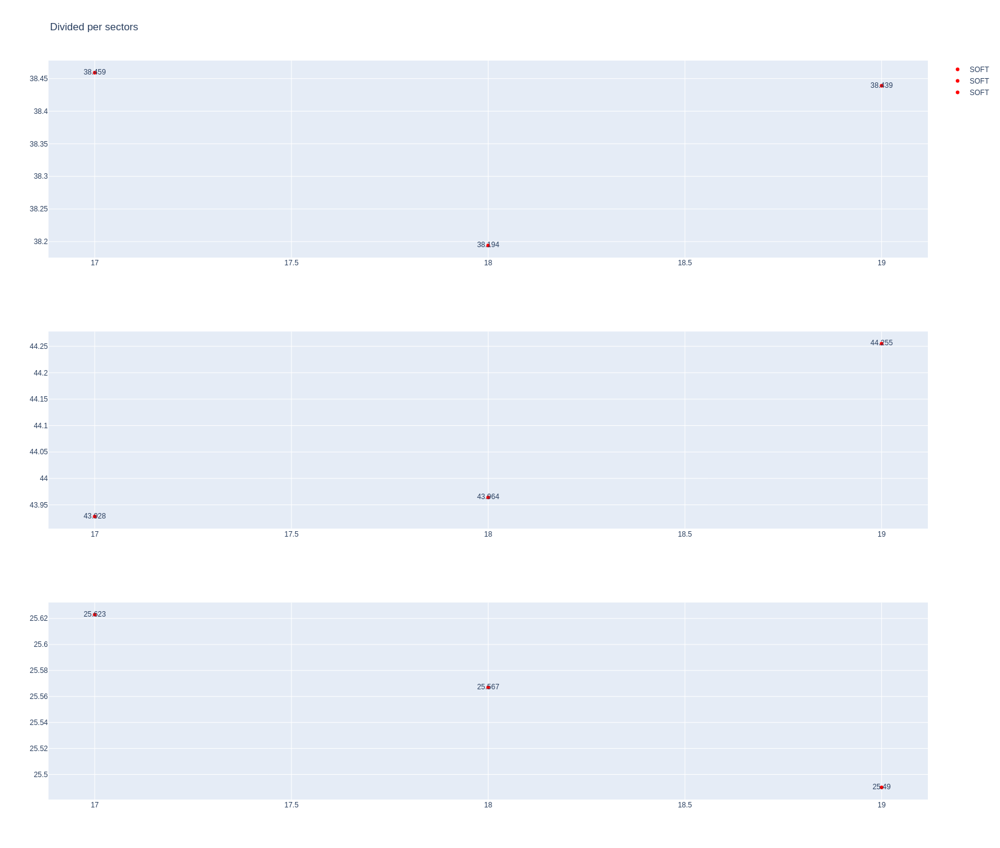

In [139]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [140]:
data = libraryDataF1.getinfolongruns(jointables2,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
284,Lance STROLL,SOFT,2025-09-19T12:48:36.121000+00:00,16,38.405,44.418,25.581,108.404
299,Lance STROLL,SOFT,2025-09-19T12:50:24.475000+00:00,17,38.472,44.086,25.537,108.095
315,Lance STROLL,SOFT,2025-09-19T12:52:13.173000+00:00,18,38.405,44.004,25.494,107.903
333,Lance STROLL,SOFT,2025-09-19T12:54:00.550000+00:00,19,38.348,44.064,25.518,107.930
352,Lance STROLL,SOFT,2025-09-19T12:55:48.347000+00:00,20,38.480,44.251,25.874,108.605
371,Lance STROLL,SOFT,2025-09-19T12:57:36.985000+00:00,21,38.633,44.553,25.473,108.659
390,Lance STROLL,SOFT,2025-09-19T12:59:25.639000+00:00,22,38.388,44.368,25.633,108.389


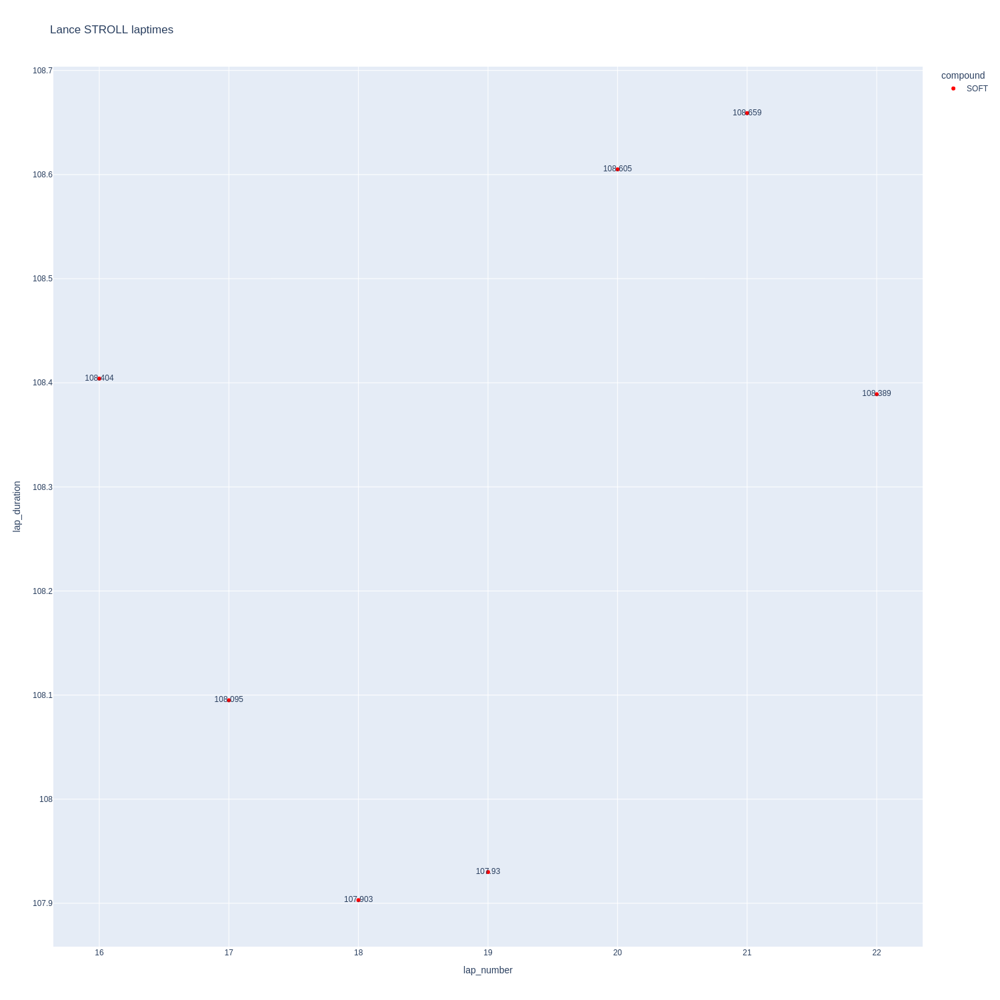

In [141]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

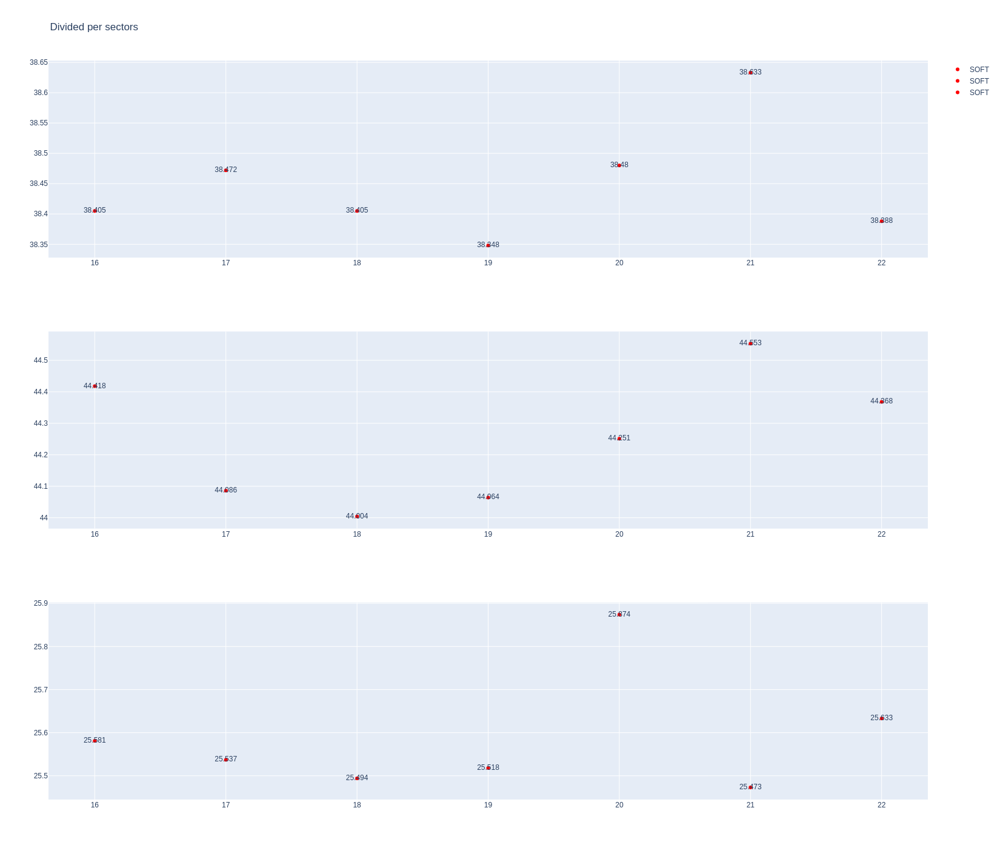

In [142]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [143]:
stintInformation.query('driver_number == 30 or driver_number == 6')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1269,9898,1,30,1,3,SOFT,0
8,1269,9898,2,30,4,6,SOFT,3
10,1269,9898,1,6,1,7,MEDIUM,0
34,1269,9898,3,30,7,11,MEDIUM,0
38,1269,9898,2,6,8,13,SOFT,0
59,1269,9898,3,6,14,23,SOFT,0
61,1269,9898,4,30,12,22,MEDIUM,5


In [144]:
data = libraryDataF1.getinfolongruns(jointables2,30,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
268,Liam LAWSON,MEDIUM,2025-09-19T12:46:33.595000+00:00,13,38.406,43.665,25.425,107.496
282,Liam LAWSON,MEDIUM,2025-09-19T12:48:21.121000+00:00,14,38.100,43.563,25.331,106.994
297,Liam LAWSON,MEDIUM,2025-09-19T12:50:08.115000+00:00,15,38.120,43.789,25.306,107.215
313,Liam LAWSON,MEDIUM,2025-09-19T12:51:55.346000+00:00,16,37.947,43.702,25.279,106.928
331,Liam LAWSON,MEDIUM,2025-09-19T12:53:42.285000+00:00,17,38.011,44.230,25.056,107.297
369,Liam LAWSON,MEDIUM,2025-09-19T12:57:21.184000+00:00,19,37.983,44.077,25.231,107.291
387,Liam LAWSON,MEDIUM,2025-09-19T12:59:08.572000+00:00,20,37.967,44.065,25.107,107.139


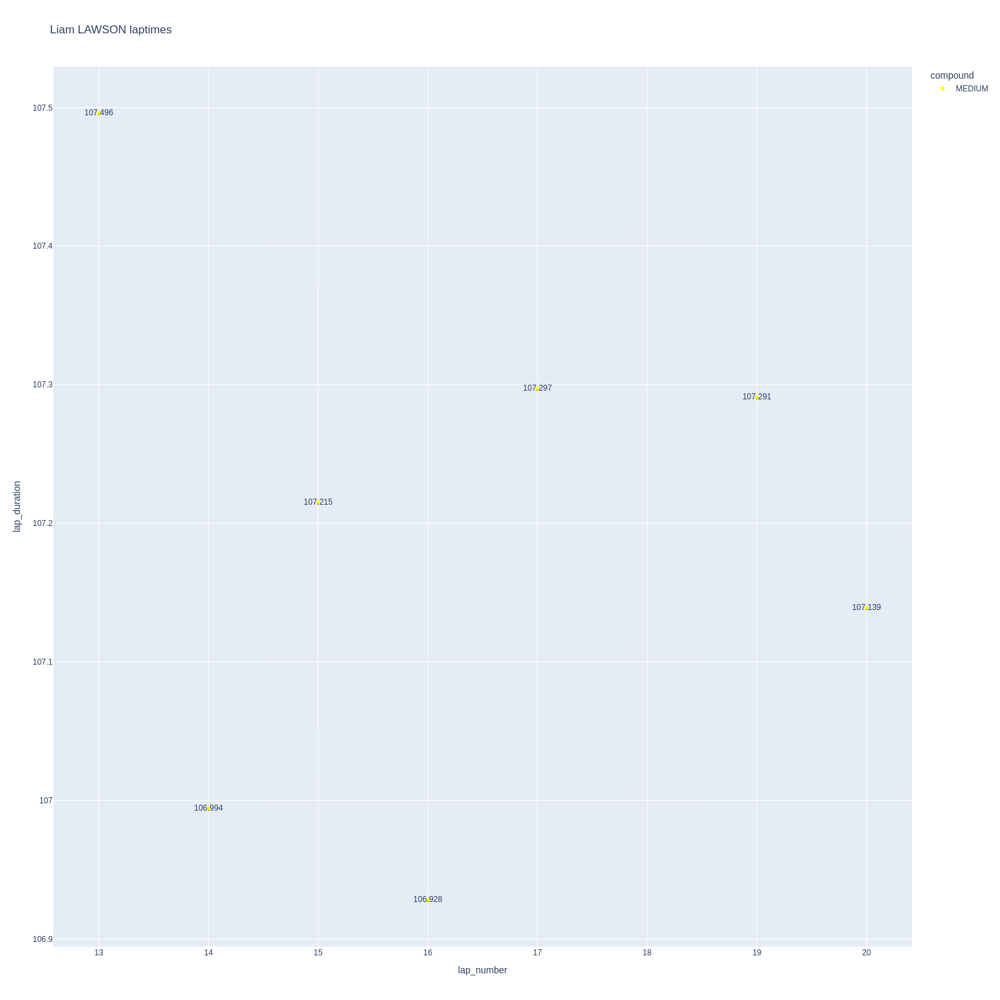

In [145]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

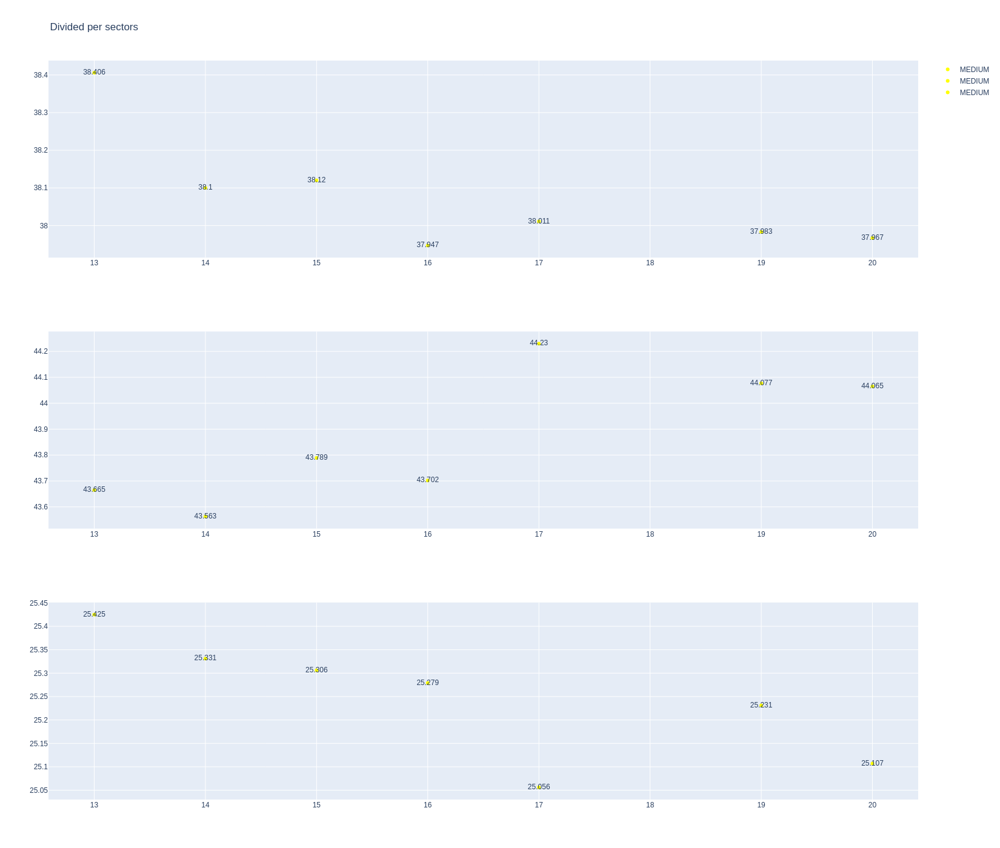

In [146]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [147]:
data = libraryDataF1.getinfolongruns(jointables2,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
280,Isack HADJAR,SOFT,2025-09-19T12:48:10.793000+00:00,15,38.794,44.083,25.584,108.461
311,Isack HADJAR,SOFT,2025-09-19T12:51:48.476000+00:00,17,38.483,43.977,25.412,107.872
329,Isack HADJAR,SOFT,2025-09-19T12:53:36.394000+00:00,18,38.345,44.105,25.344,107.794
347,Isack HADJAR,SOFT,2025-09-19T12:55:24.129000+00:00,19,38.199,44.043,25.399,107.641
366,Isack HADJAR,SOFT,2025-09-19T12:57:11.785000+00:00,20,38.411,43.946,25.476,107.833
384,Isack HADJAR,SOFT,2025-09-19T12:58:59.539000+00:00,21,38.472,44.055,25.557,108.084


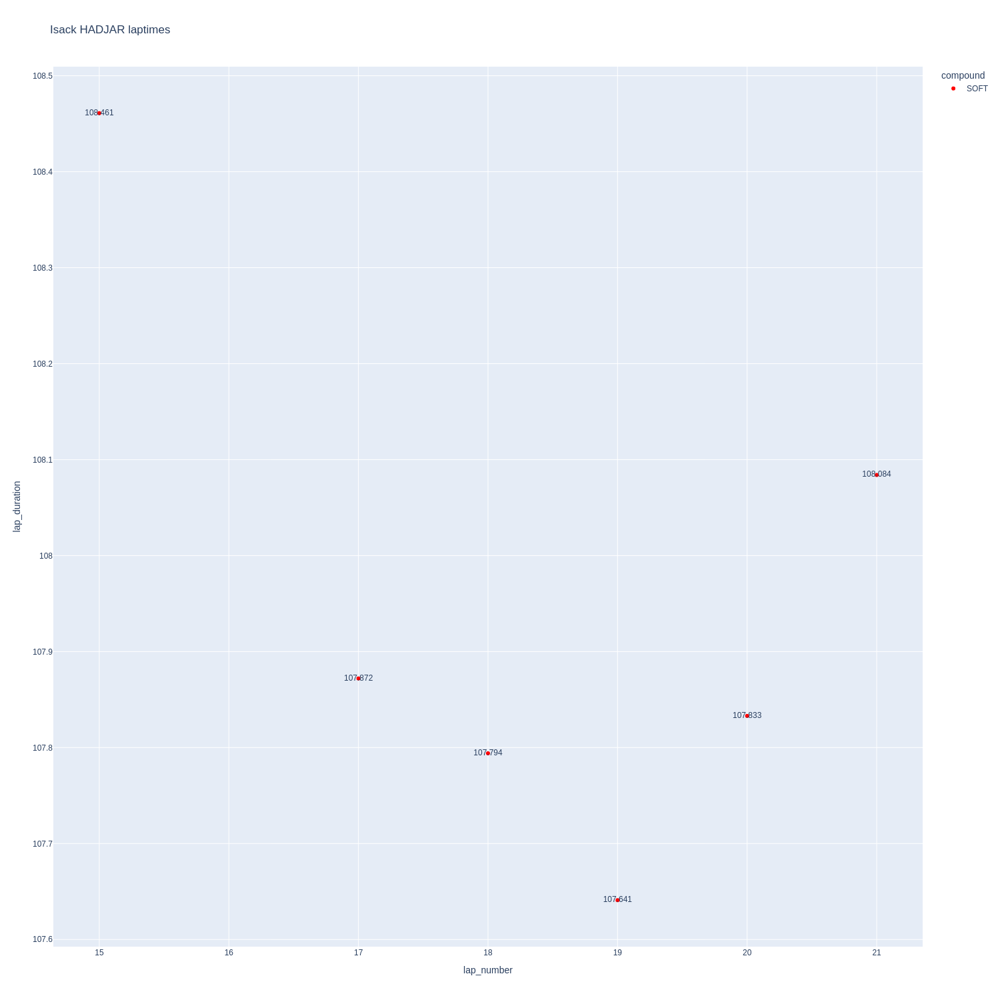

In [148]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

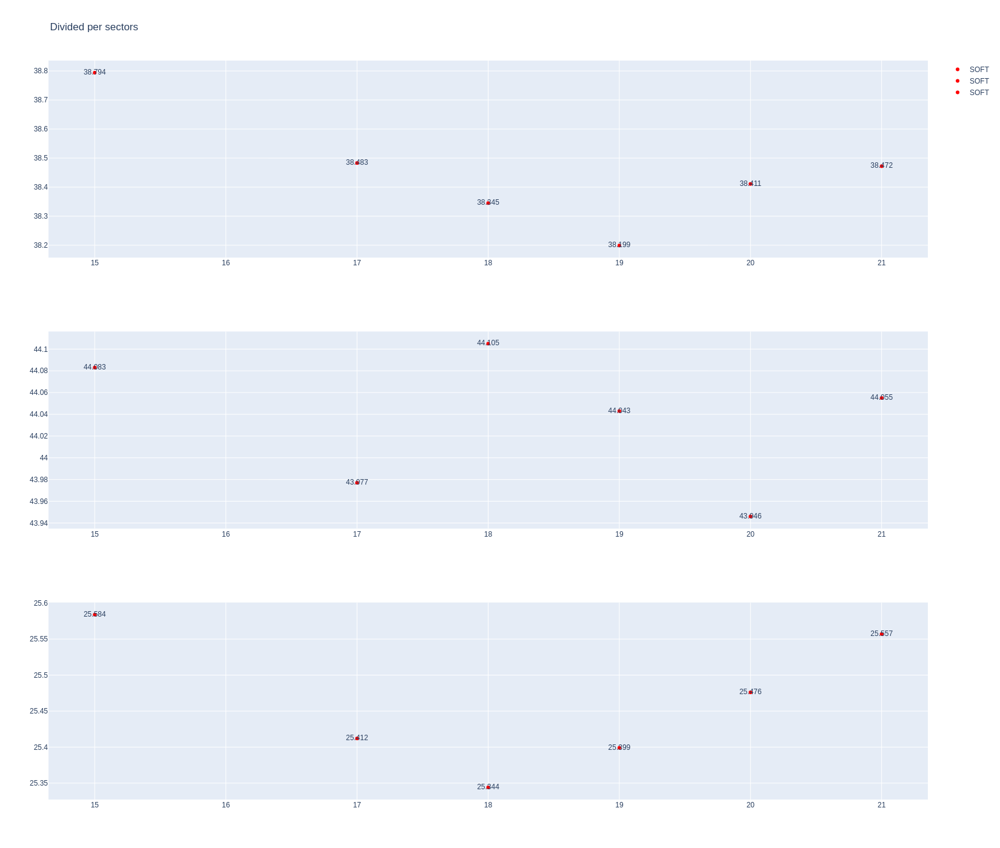

In [149]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [150]:
stintInformation.query('driver_number == 31 or driver_number == 87')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
11,1269,9898,1,87,1,7,SOFT,0
12,1269,9898,1,31,1,7,MEDIUM,0
36,1269,9898,2,31,8,13,SOFT,0
37,1269,9898,2,87,8,13,MEDIUM,0
51,1269,9898,3,31,14,23,MEDIUM,0
54,1269,9898,3,87,14,23,MEDIUM,6


In [151]:
data = libraryDataF1.getinfolongruns(jointables2,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
20,Esteban OCON,MEDIUM,2025-09-19T12:04:18.949000+00:00,2,37.225,43.319,25.587,106.131
275,Esteban OCON,MEDIUM,2025-09-19T12:47:34.422000+00:00,15,38.268,42.998,25.312,106.578
288,Esteban OCON,MEDIUM,2025-09-19T12:49:20.974000+00:00,16,38.245,43.154,25.814,107.213
305,Esteban OCON,MEDIUM,2025-09-19T12:51:08.159000+00:00,17,38.258,43.295,25.643,107.196
321,Esteban OCON,MEDIUM,2025-09-19T12:52:55.684000+00:00,18,38.225,43.435,25.694,107.354
340,Esteban OCON,MEDIUM,2025-09-19T12:54:42.832000+00:00,19,38.375,43.384,25.682,107.441
359,Esteban OCON,MEDIUM,2025-09-19T12:56:30.238000+00:00,20,38.477,44.480,25.649,108.606
378,Esteban OCON,MEDIUM,2025-09-19T12:58:18.840000+00:00,21,37.976,43.253,25.426,106.655


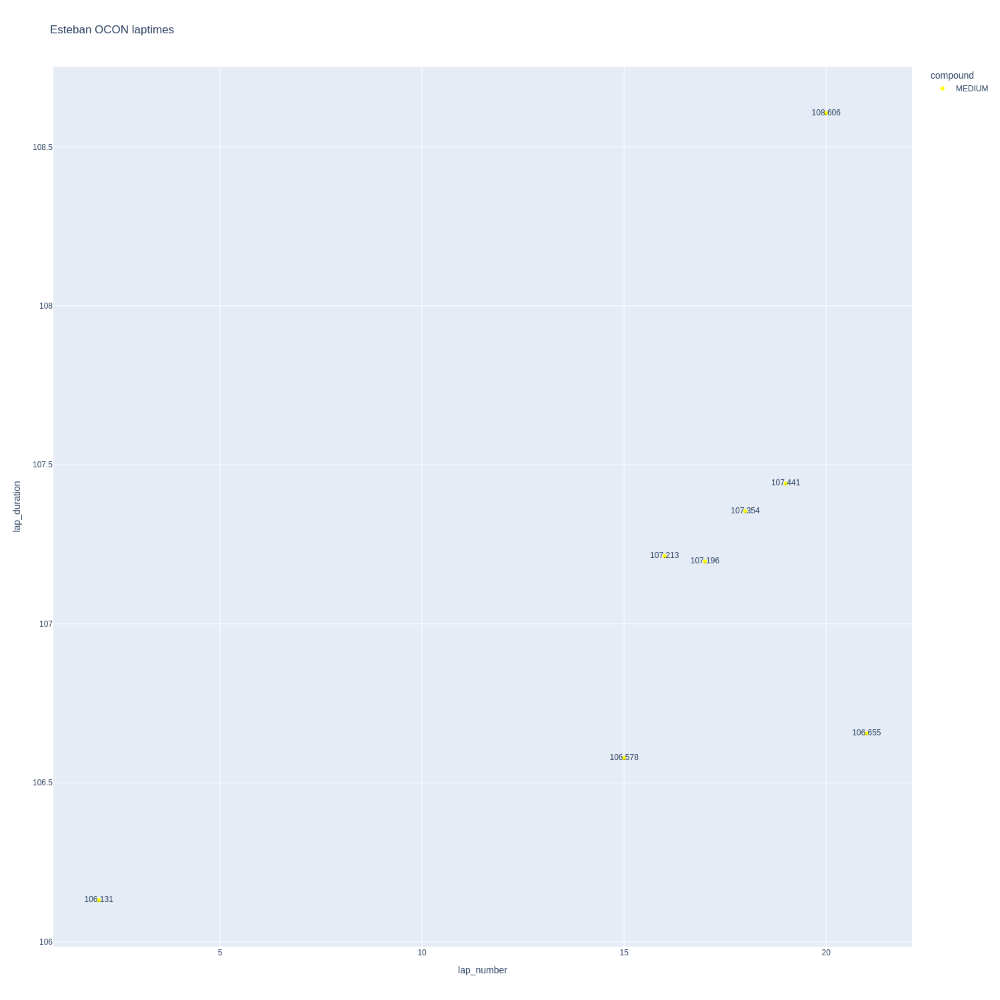

In [152]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

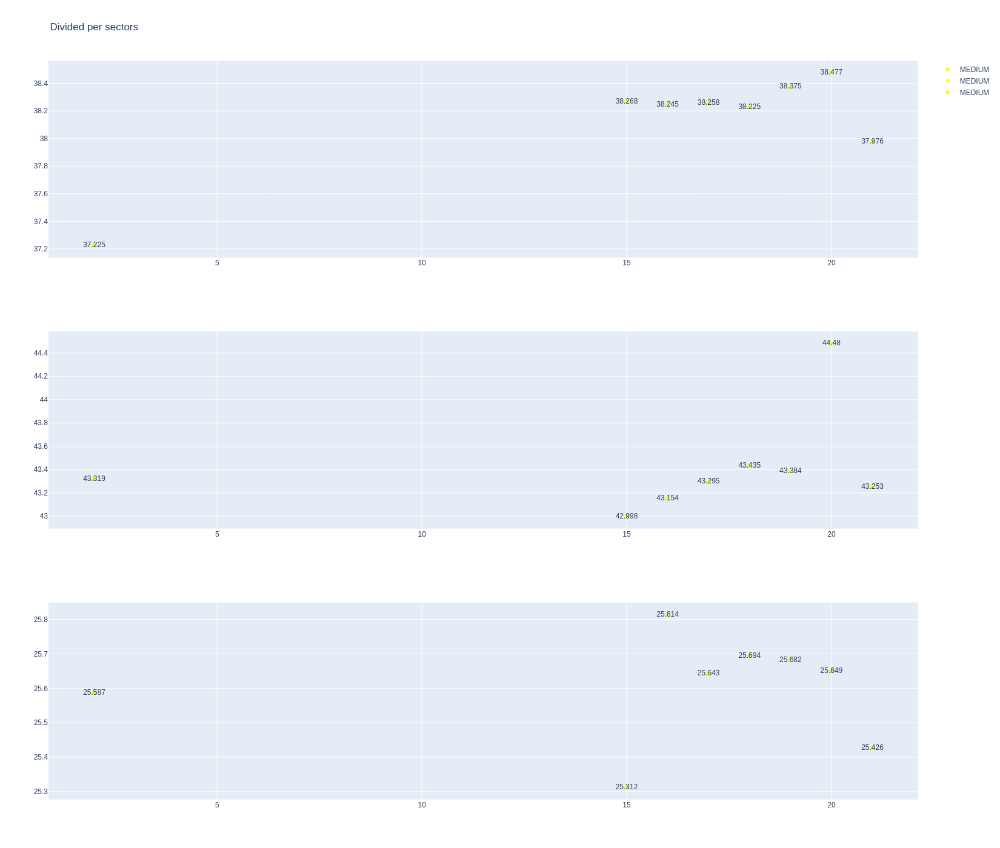

In [153]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [154]:
data = libraryDataF1.getinfolongruns(jointables2,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
278,Oliver BEARMAN,MEDIUM,2025-09-19T12:47:42.381000+00:00,15,37.670,43.010,25.552,106.232
309,Oliver BEARMAN,MEDIUM,2025-09-19T12:51:46.209000+00:00,17,37.910,43.160,25.464,106.534
326,Oliver BEARMAN,MEDIUM,2025-09-19T12:53:32.613000+00:00,18,38.885,43.972,25.331,108.188
346,Oliver BEARMAN,MEDIUM,2025-09-19T12:55:20.894000+00:00,19,38.055,43.639,25.437,107.131
365,Oliver BEARMAN,MEDIUM,2025-09-19T12:57:07.988000+00:00,20,38.126,43.874,25.312,107.312
383,Oliver BEARMAN,MEDIUM,2025-09-19T12:58:55.391000+00:00,21,37.915,44.691,25.338,107.944


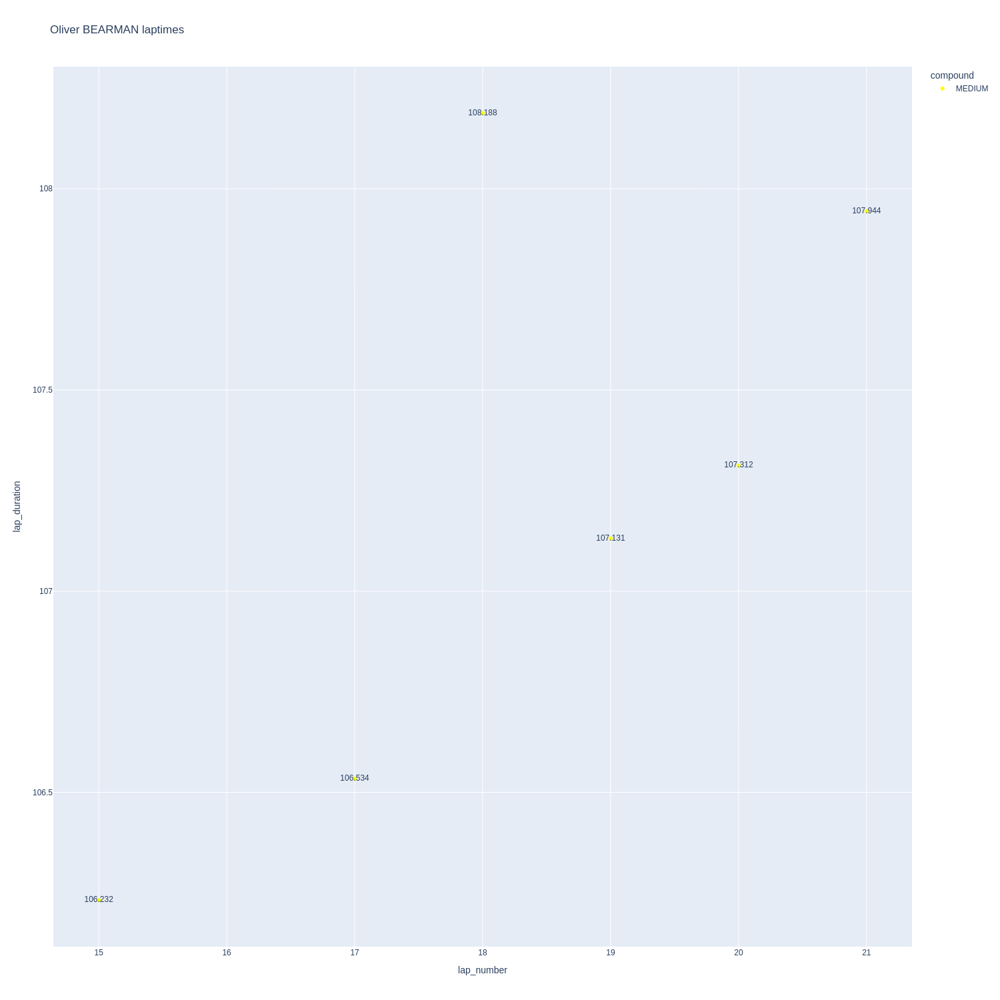

In [155]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

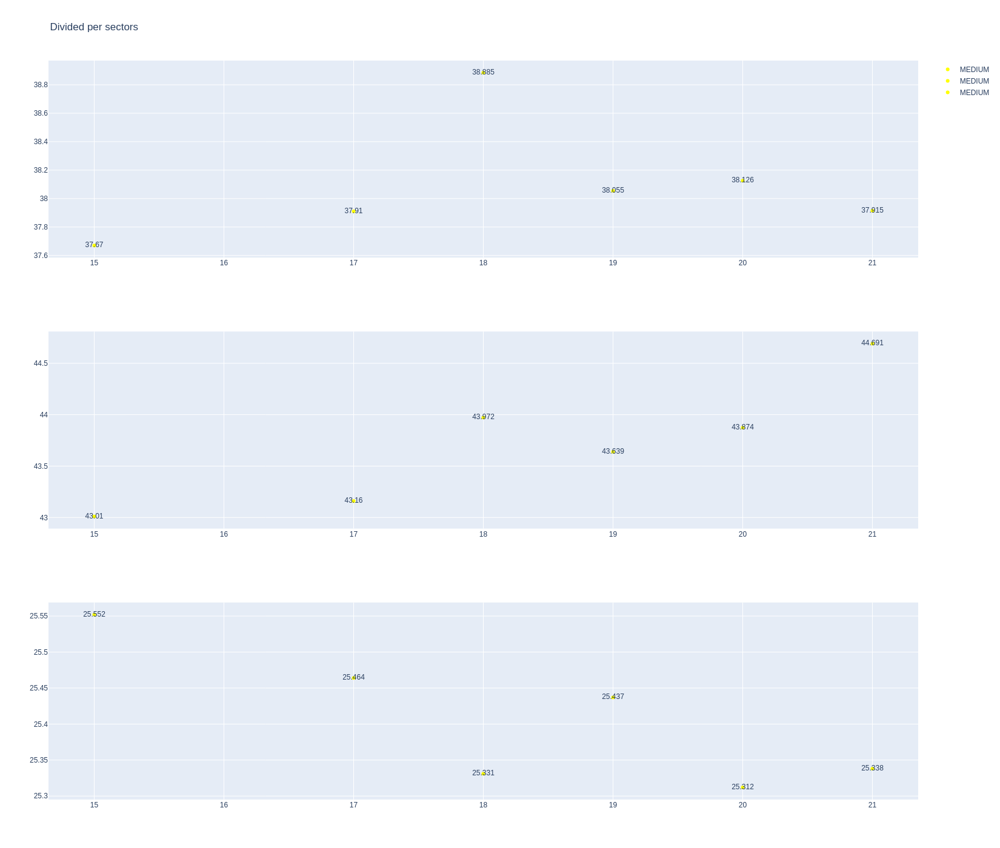

In [156]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [157]:
stintInformation.query('driver_number == 10 or driver_number == 43')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1269,9898,1,43,1,6,SOFT,0
17,1269,9898,1,10,1,7,SOFT,0
33,1269,9898,2,43,7,11,MEDIUM,0
48,1269,9898,2,10,8,16,MEDIUM,0
53,1269,9898,3,10,17,22,MEDIUM,0
60,1269,9898,3,43,12,22,MEDIUM,5


In [158]:
data =libraryDataF1.getinfolongruns(jointables2,43,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
267,Franco COLAPINTO,MEDIUM,2025-09-19T12:46:28.892000+00:00,13,38.725,44.143,25.363,108.231
281,Franco COLAPINTO,MEDIUM,2025-09-19T12:48:17.153000+00:00,14,38.363,43.893,25.389,107.645
296,Franco COLAPINTO,MEDIUM,2025-09-19T12:50:04.803000+00:00,15,38.182,43.853,25.312,107.347
312,Franco COLAPINTO,MEDIUM,2025-09-19T12:51:52.097000+00:00,16,38.627,44.539,25.494,108.660
330,Franco COLAPINTO,MEDIUM,2025-09-19T12:53:40.988000+00:00,17,38.585,44.423,25.293,108.301
349,Franco COLAPINTO,MEDIUM,2025-09-19T12:55:29.066000+00:00,18,38.682,44.396,25.467,108.545
368,Franco COLAPINTO,MEDIUM,2025-09-19T12:57:17.698000+00:00,19,38.955,44.405,25.532,108.892
386,Franco COLAPINTO,MEDIUM,2025-09-19T12:59:06.559000+00:00,20,38.394,44.372,25.404,108.170


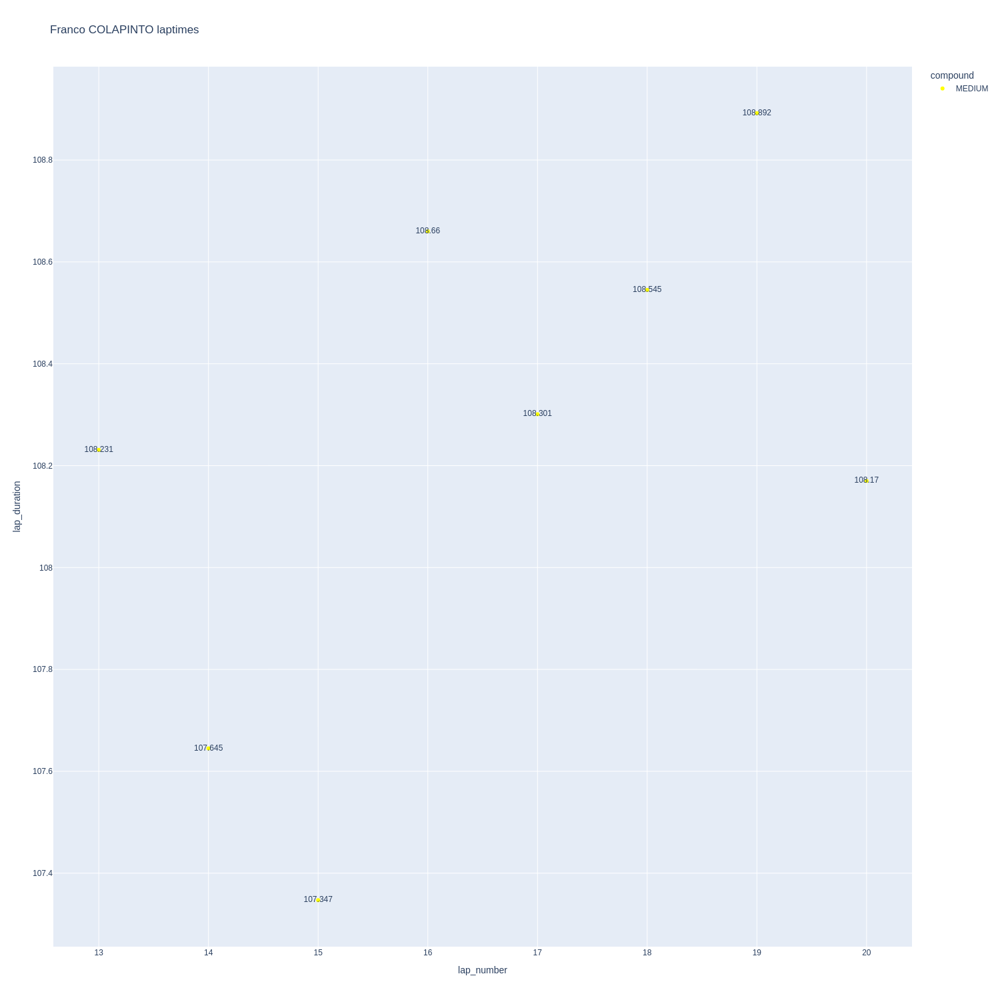

In [159]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

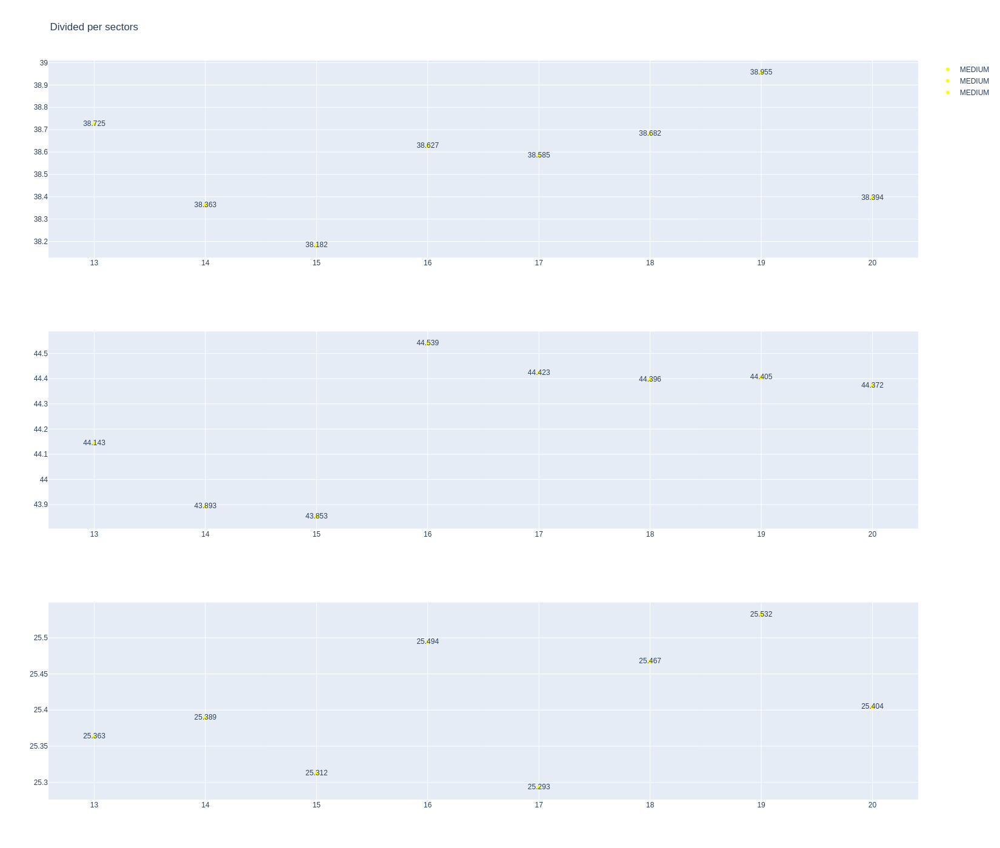

In [160]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [161]:
data = libraryDataF1.getinfolongruns(jointables2,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
348,Pierre GASLY,MEDIUM,2025-09-19T12:55:27.332000+00:00,18,38.009,43.667,25.381,107.057
367,Pierre GASLY,MEDIUM,2025-09-19T12:57:14.288000+00:00,19,38.427,43.532,25.201,107.160
385,Pierre GASLY,MEDIUM,2025-09-19T12:59:01.499000+00:00,20,38.119,43.636,25.050,106.805


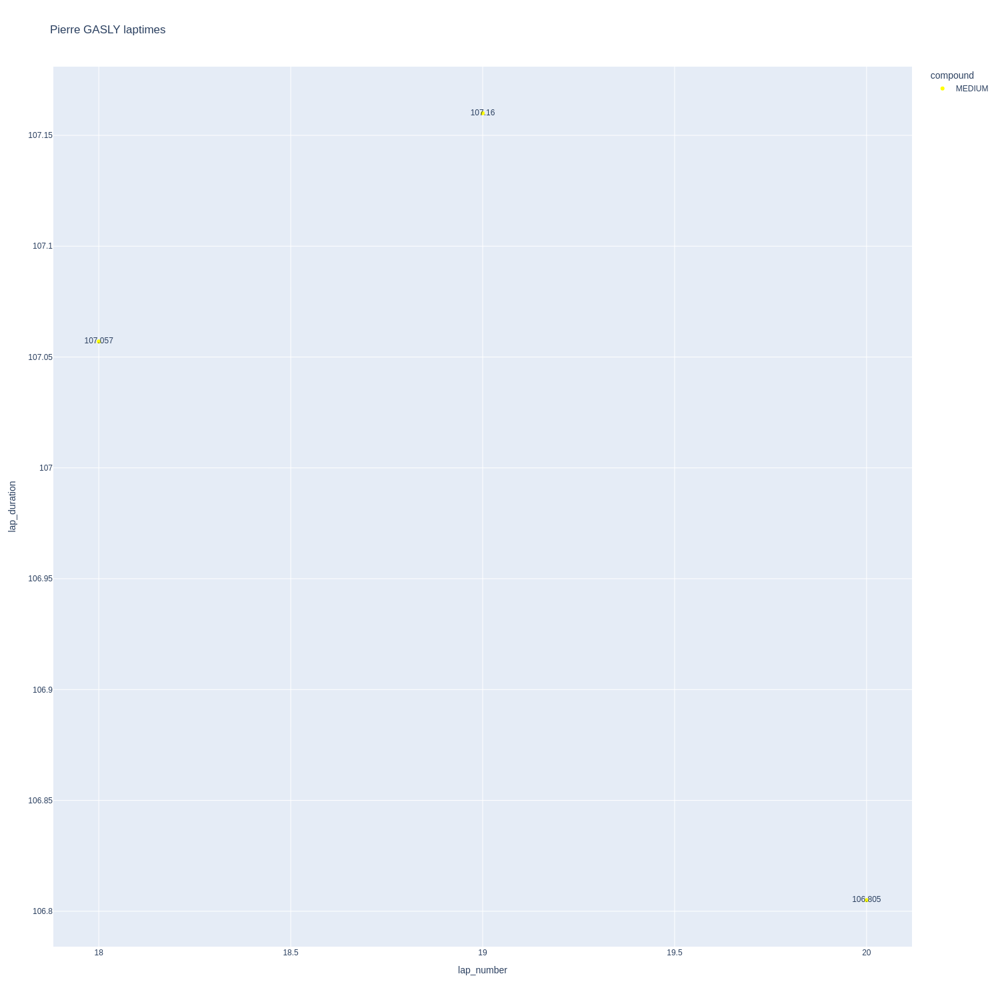

In [162]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

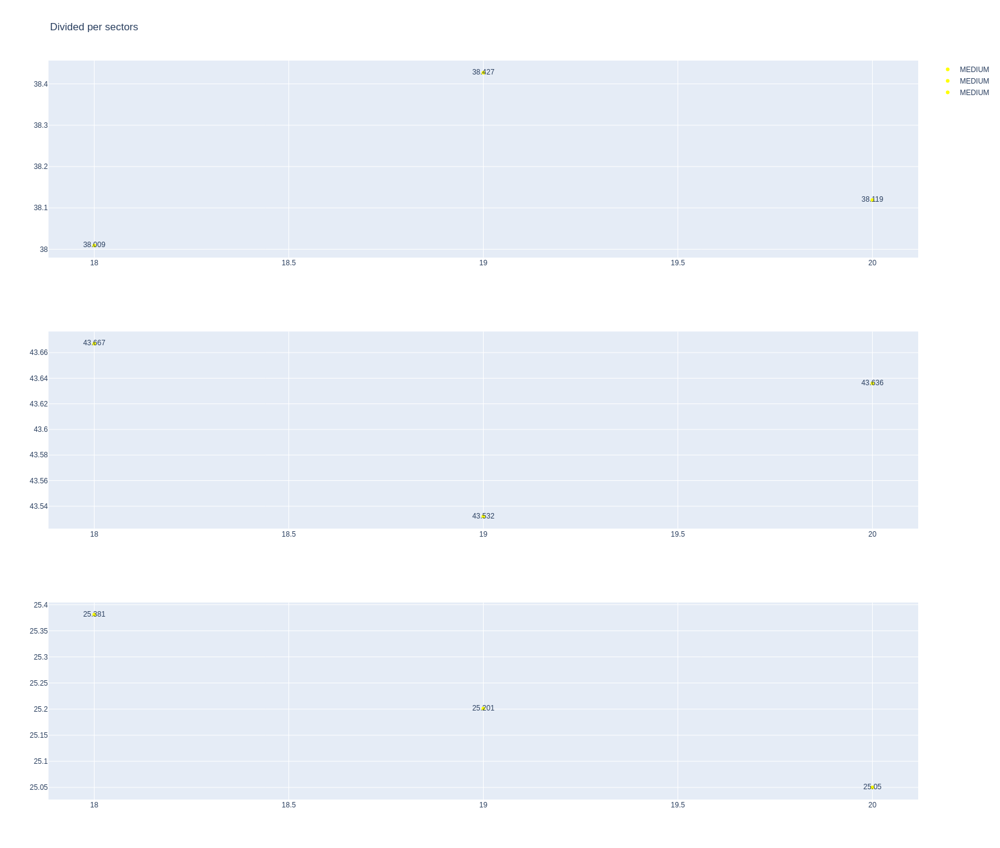

In [163]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [164]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1269,9898,1,23,1,8,HARD,0
9,1269,9898,1,55,1,7,MEDIUM,0
31,1269,9898,2,55,8,12,SOFT,0
32,1269,9898,2,23,9,13,SOFT,0
52,1269,9898,3,23,14,24,HARD,8
66,1269,9898,3,55,13,24,MEDIUM,0


In [165]:
data = libraryDataF1.getinfolongruns(jointables2,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
276,Alexander ALBON,HARD,2025-09-19T12:47:36.608000+00:00,16,37.530,43.259,25.275,106.064
289,Alexander ALBON,HARD,2025-09-19T12:49:22.754000+00:00,17,37.790,43.311,25.259,106.360
322,Alexander ALBON,HARD,2025-09-19T12:53:01.485000+00:00,19,37.986,43.315,25.445,106.746
341,Alexander ALBON,HARD,2025-09-19T12:54:48.832000+00:00,20,37.814,43.279,25.527,106.620
360,Alexander ALBON,HARD,2025-09-19T12:56:34.941000+00:00,21,37.995,44.137,25.460,107.592


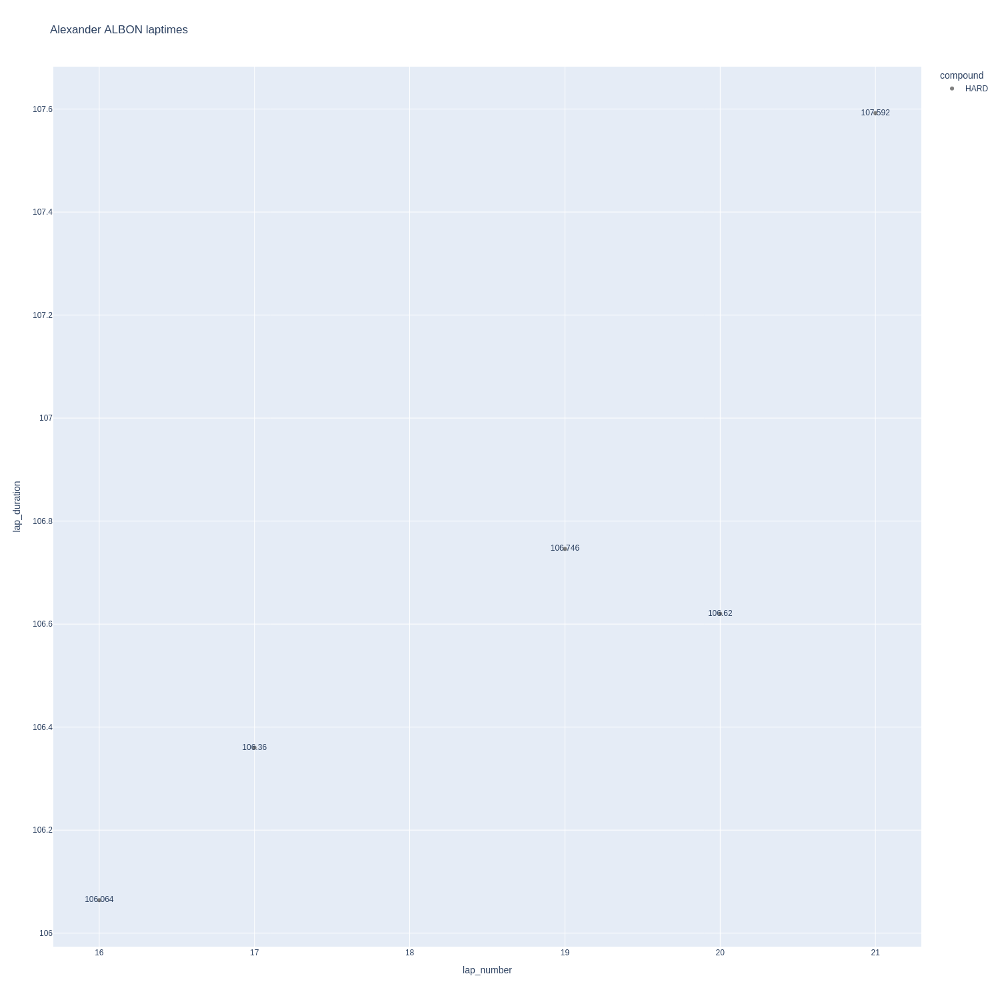

In [166]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

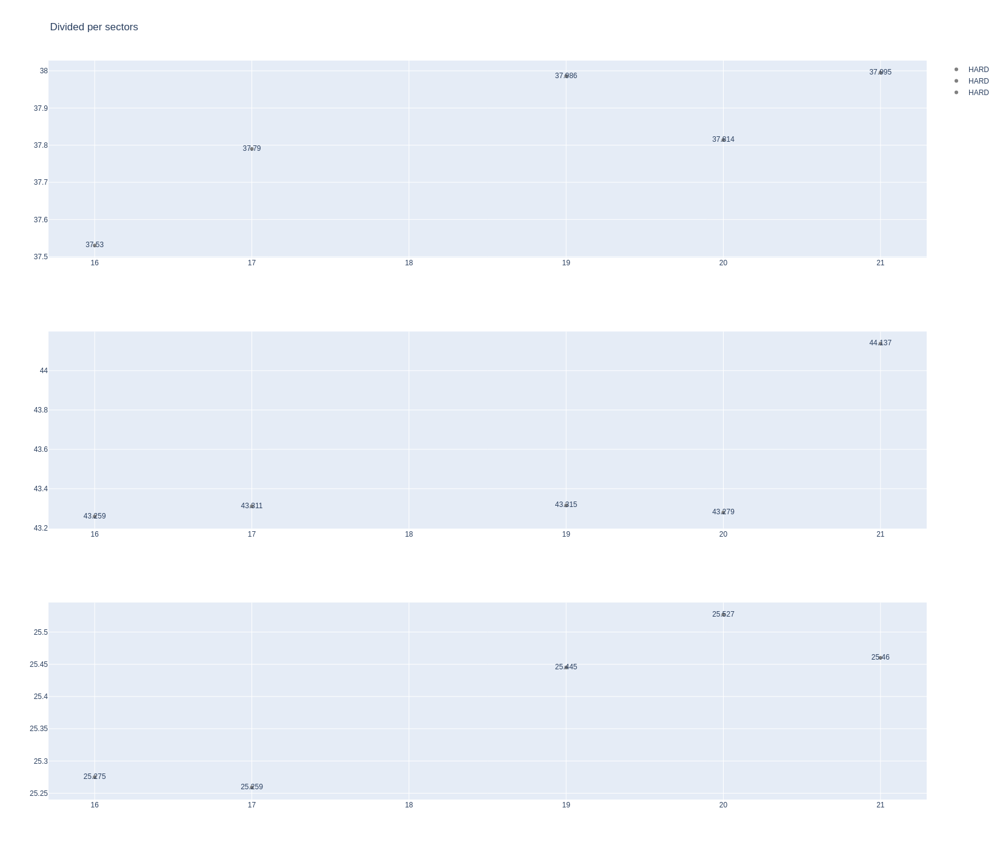

In [167]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [168]:
data= libraryDataF1.getinfolongruns(jointables2,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
224,Carlos SAINZ,SOFT,2025-09-19T12:37:08.021000+00:00,12,36.112,41.721,30.815,108.648
264,Carlos SAINZ,MEDIUM,2025-09-19T12:45:43.298000+00:00,14,37.821,43.621,25.624,107.066
274,Carlos SAINZ,MEDIUM,2025-09-19T12:47:29.771000+00:00,15,37.631,43.405,25.516,106.552
287,Carlos SAINZ,MEDIUM,2025-09-19T12:49:16.373000+00:00,16,37.666,43.211,25.461,106.338
304,Carlos SAINZ,MEDIUM,2025-09-19T12:51:02.659000+00:00,17,37.628,43.295,25.896,106.819
320,Carlos SAINZ,MEDIUM,2025-09-19T12:52:49.432000+00:00,18,37.614,43.484,25.421,106.519
339,Carlos SAINZ,MEDIUM,2025-09-19T12:54:35.972000+00:00,19,37.836,43.345,25.433,106.614
358,Carlos SAINZ,MEDIUM,2025-09-19T12:56:22.660000+00:00,20,37.706,44.630,25.622,107.958
376,Carlos SAINZ,MEDIUM,2025-09-19T12:58:10.633000+00:00,21,37.847,43.341,25.396,106.584
395,Carlos SAINZ,MEDIUM,2025-09-19T12:59:57.082000+00:00,22,37.744,43.318,25.618,106.680


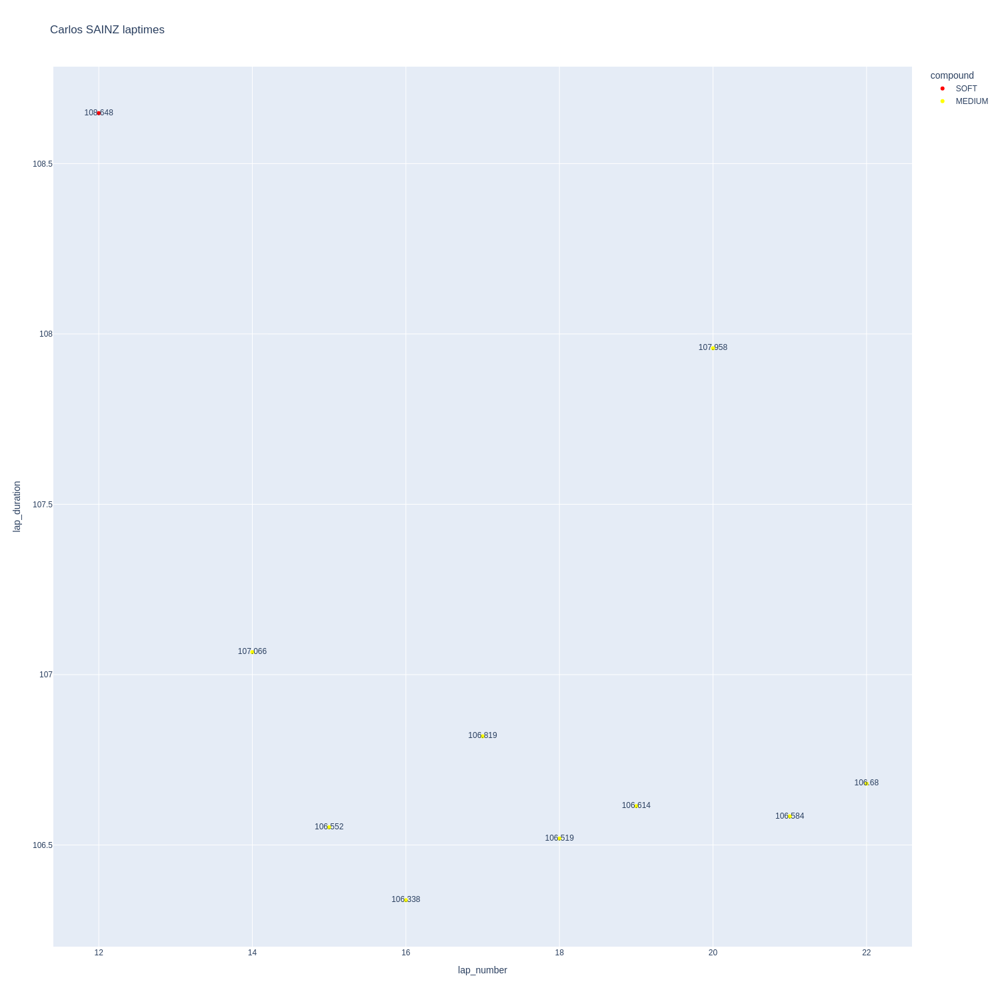

In [169]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

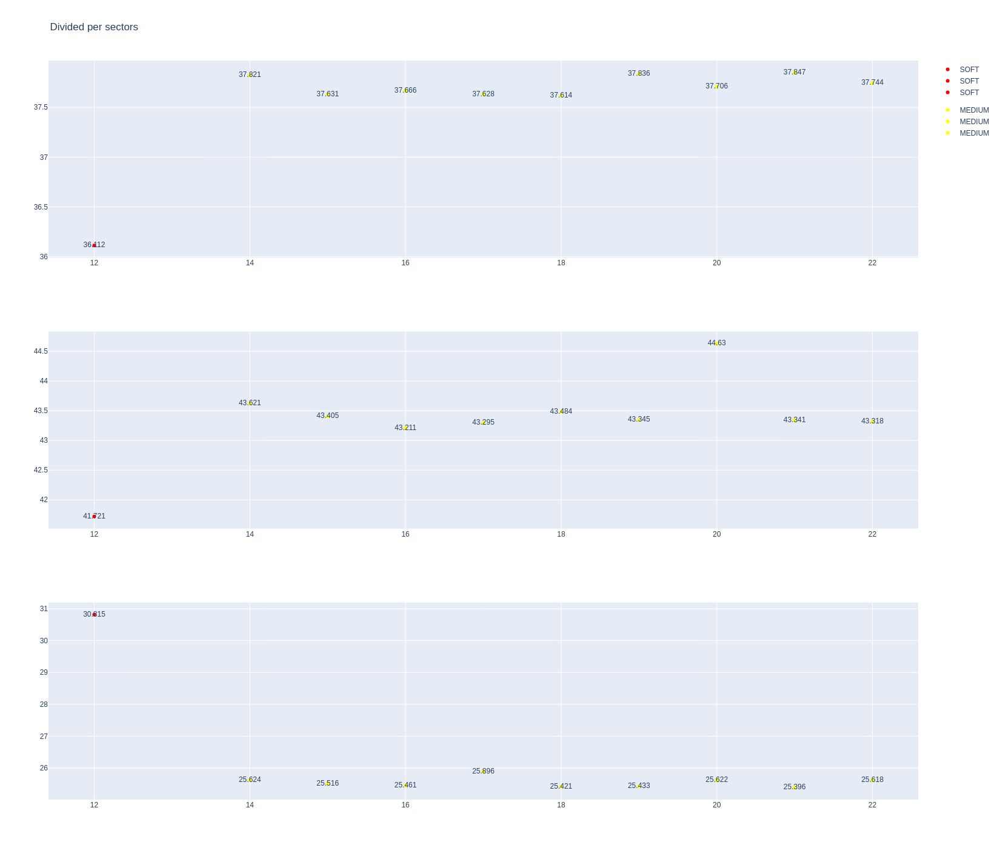

In [170]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [171]:
stintInformation.query('driver_number == 27 or driver_number == 5')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
15,1269,9898,1,27,1,7,MEDIUM,0
22,1269,9898,1,5,1,8,MEDIUM,0
35,1269,9898,2,27,8,11,SOFT,0
40,1269,9898,2,5,9,13,SOFT,0
50,1269,9898,3,5,14,22,UNKNOWN,0
58,1269,9898,3,27,12,22,MEDIUM,7


In [172]:
data = libraryDataF1.getinfolongruns(jointables2,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
269,Nico HULKENBERG,MEDIUM,2025-09-19T12:46:40.267000+00:00,13,38.138,43.392,25.437,106.967
283,Nico HULKENBERG,MEDIUM,2025-09-19T12:48:27.199000+00:00,14,38.313,43.609,25.467,107.389
298,Nico HULKENBERG,MEDIUM,2025-09-19T12:50:14.584000+00:00,15,38.120,43.368,25.504,106.992
314,Nico HULKENBERG,MEDIUM,2025-09-19T12:52:01.521000+00:00,16,38.281,43.779,25.431,107.491
332,Nico HULKENBERG,MEDIUM,2025-09-19T12:53:49.081000+00:00,17,38.374,43.803,25.434,107.611
351,Nico HULKENBERG,MEDIUM,2025-09-19T12:55:36.754000+00:00,18,38.296,43.684,25.466,107.446
370,Nico HULKENBERG,MEDIUM,2025-09-19T12:57:24.124000+00:00,19,38.077,43.474,25.208,106.759
388,Nico HULKENBERG,MEDIUM,2025-09-19T12:59:10.856000+00:00,20,38.337,43.853,25.459,107.649


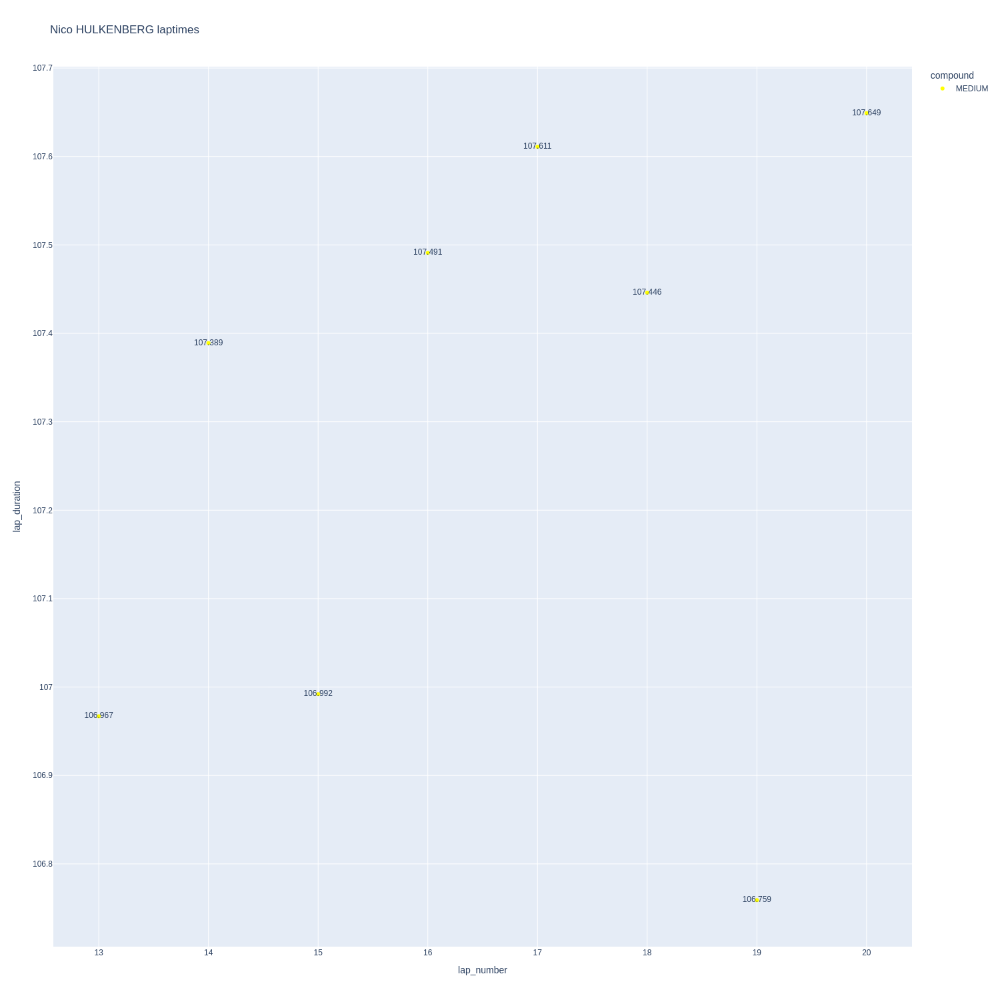

In [173]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

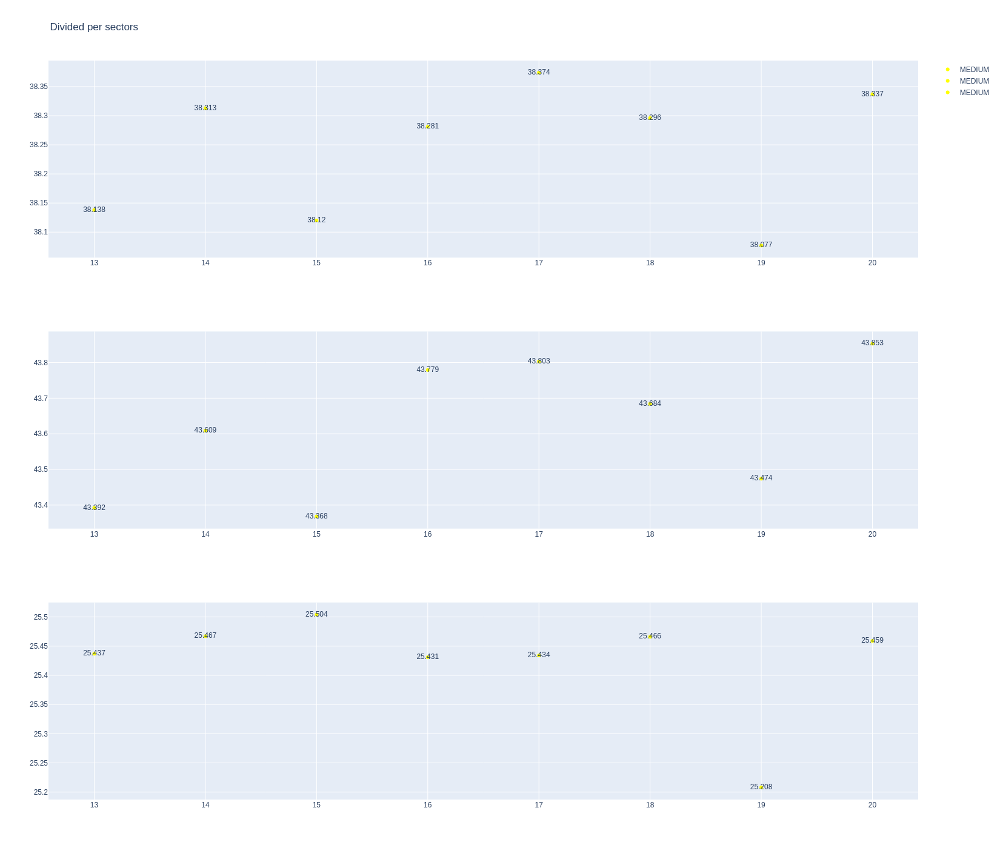

In [174]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [175]:
data = libraryDataF1.getinfolongruns(jointables2,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
92,Gabriel BORTOLETO,MEDIUM,2025-09-19T12:12:36.379000+00:00,6,36.831,44.401,26.519,107.751
129,Gabriel BORTOLETO,MEDIUM,2025-09-19T12:16:48.652000+00:00,8,36.649,41.987,28.647,107.283
286,Gabriel BORTOLETO,UNKNOWN,2025-09-19T12:49:05.137000+00:00,15,38.326,43.441,25.510,107.277
302,Gabriel BORTOLETO,UNKNOWN,2025-09-19T12:50:52.525000+00:00,16,38.172,43.309,25.437,106.918
318,Gabriel BORTOLETO,UNKNOWN,2025-09-19T12:52:39.284000+00:00,17,38.071,43.351,25.414,106.836
337,Gabriel BORTOLETO,UNKNOWN,2025-09-19T12:54:26.332000+00:00,18,38.134,43.381,25.457,106.972
377,Gabriel BORTOLETO,UNKNOWN,2025-09-19T12:58:12.986000+00:00,20,38.558,44.212,25.352,108.122


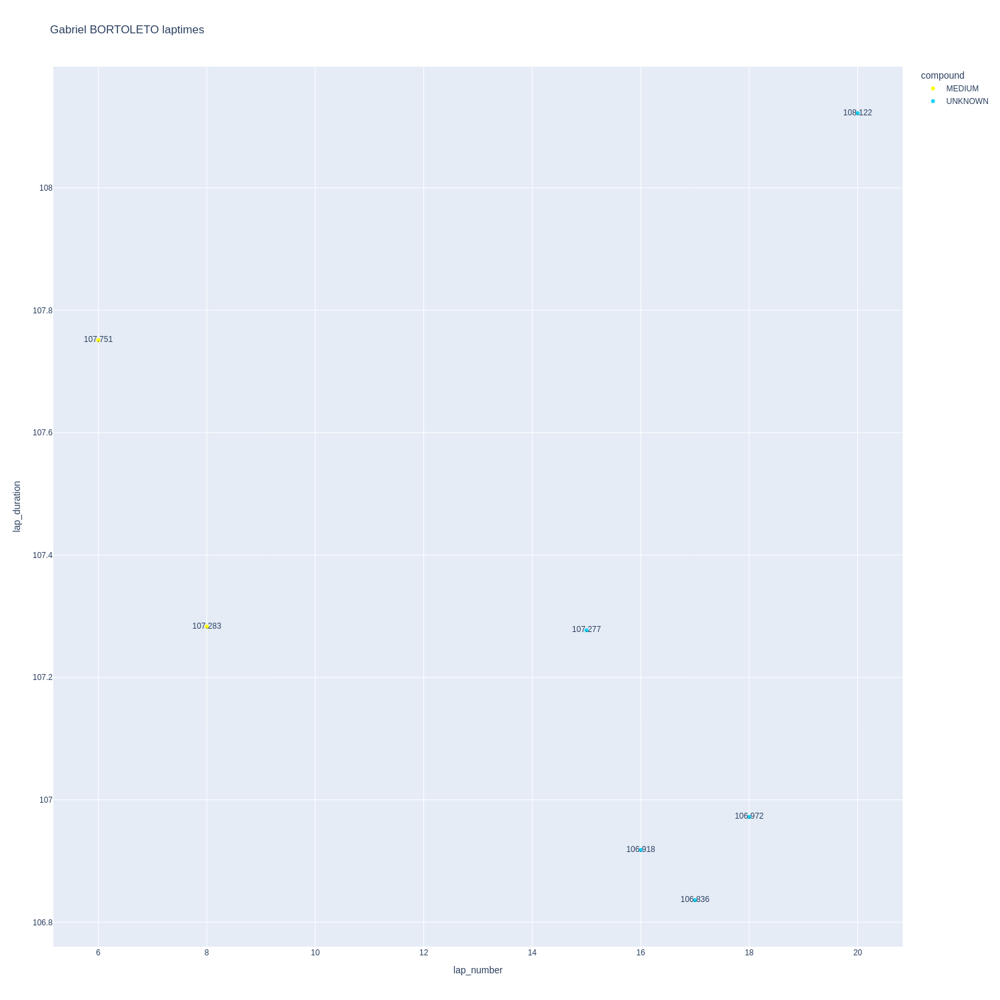

In [176]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

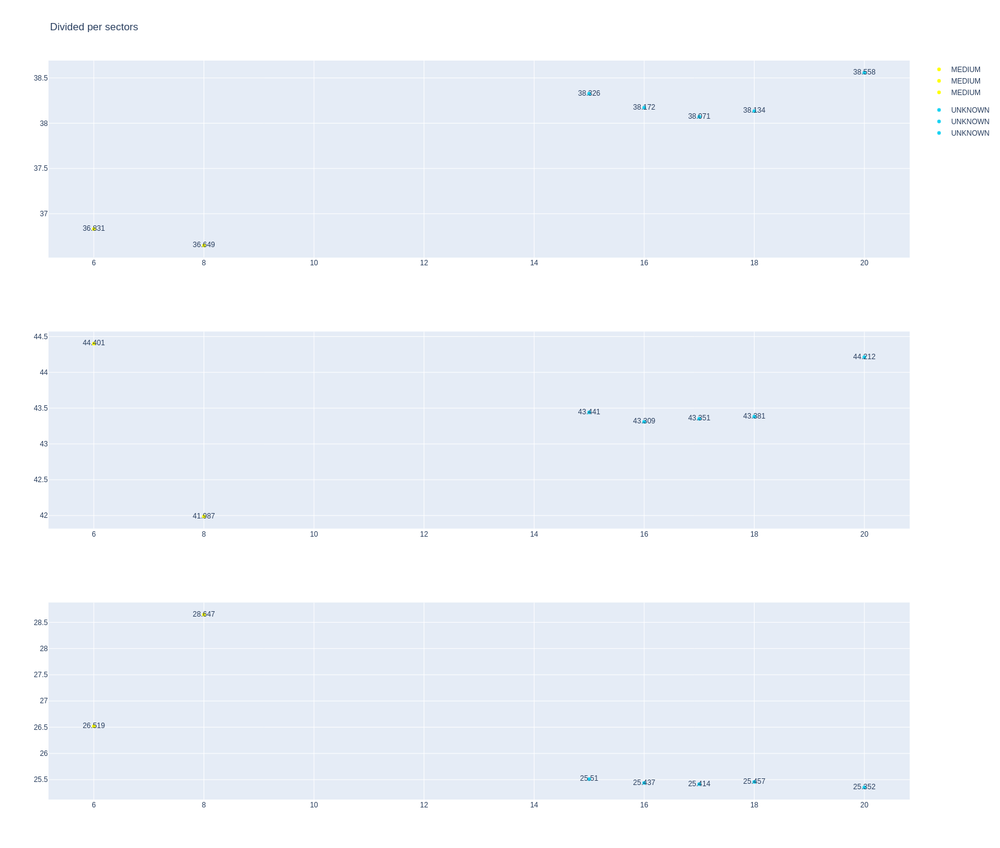

In [177]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Long runs mean for each driver

In [178]:
longrun_data = libraryDataF1.obtainLongRunData(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Sorted by lap duration
It seems that teams powered by HOnda suffers in S1 while Alpine had a good pace. It seems that Aston is the fourth team in race pace witrh softs and mediums.
Aston in S2 is competitive. Colapinto's pace in S3 is interesting and Stroll suffers here.

In [179]:
sorted_laps = pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3'])

In [180]:
sorted_laps.sort_values(by='lap_duration',ascending=True)

,driver,compound,lap_duration,sector1,sector2,sector3
7,Charles LECLERC,SOFT,106.212333,37.677000,43.210667,25.324667
15,Lewis HAMILTON,MEDIUM,106.297000,37.673000,43.190000,25.434000
0,Max VERSTAPPEN,SOFT,106.565500,37.796750,43.381000,25.387750
10,Alexander ALBON,HARD,106.676400,37.823000,43.460200,25.393200
16,Carlos SAINZ,MEDIUM,106.977800,37.560500,43.337100,26.080200
4,Pierre GASLY,MEDIUM,107.007333,38.185000,43.611667,25.210667
17,George RUSSELL,SOFT,107.067750,37.935750,43.624000,25.508000
13,Esteban OCON,MEDIUM,107.146750,38.131125,43.414750,25.600875
5,Kimi ANTONELLI,SOFT,107.174200,37.824400,43.888200,25.461600
12,Liam LAWSON,MEDIUM,107.194286,38.076286,43.870143,25.247857


##### Sorted by sector 1

In [181]:
sorted_laps.sort_values(by='sector1',ascending=True)[['driver','compound','sector1']]

,driver,compound,sector1
1,Lando NORRIS,SOFT,35.837000
16,Carlos SAINZ,MEDIUM,37.560500
15,Lewis HAMILTON,MEDIUM,37.673000
7,Charles LECLERC,SOFT,37.677000
9,Yuki TSUNODA,MEDIUM,37.708167
0,Max VERSTAPPEN,SOFT,37.796750
2,Gabriel BORTOLETO,UNKNOWN,37.820143
10,Alexander ALBON,HARD,37.823000
5,Kimi ANTONELLI,SOFT,37.824400
17,George RUSSELL,SOFT,37.935750


##### Sorted by sector 2

In [182]:
sorted_laps.sort_values(by='sector2',ascending=True)[['driver','compound','sector2']]

,driver,compound,sector2
1,Lando NORRIS,SOFT,41.000000
15,Lewis HAMILTON,MEDIUM,43.190000
7,Charles LECLERC,SOFT,43.210667
9,Yuki TSUNODA,MEDIUM,43.258333
16,Carlos SAINZ,MEDIUM,43.337100
0,Max VERSTAPPEN,SOFT,43.381000
13,Esteban OCON,MEDIUM,43.414750
2,Gabriel BORTOLETO,UNKNOWN,43.440286
10,Alexander ALBON,HARD,43.460200
4,Pierre GASLY,MEDIUM,43.611667


##### Sorted by sector 3

In [183]:
sorted_laps.sort_values(by='sector3',ascending=True)[['driver','compound','sector3']]

,driver,compound,sector3
4,Pierre GASLY,MEDIUM,25.210667
12,Liam LAWSON,MEDIUM,25.247857
7,Charles LECLERC,SOFT,25.324667
0,Max VERSTAPPEN,SOFT,25.387750
10,Alexander ALBON,HARD,25.393200
19,Oliver BEARMAN,MEDIUM,25.405667
14,Franco COLAPINTO,MEDIUM,25.406750
11,Nico HULKENBERG,MEDIUM,25.425750
18,Oscar PIASTRI,SOFT,25.431250
15,Lewis HAMILTON,MEDIUM,25.434000


#### Long runs mean

In [184]:
longruns_summary = libraryDataF1.obtainMeanLongRuns(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Mean pace per compound

In [185]:
libraryDataF1.showDataLongRuns(longruns_summary,"MEDIUM","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
15,L HAMILTON,106.297
16,C SAINZ,106.792
9,Y TSUNODA,106.913
4,P GASLY,107.007
13,E OCON,107.147
12,L LAWSON,107.194
19,O BEARMAN,107.224
11,N HULKENBERG,107.288
14,F COLAPINTO,108.224


In [186]:
libraryDataF1.showDataLongRuns(longruns_summary,"SOFT","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
7,C LECLERC,106.212
0,M VERSTAPPEN,106.566
17,G RUSSELL,107.068
5,K ANTONELLI,107.174
18,O PIASTRI,107.198
3,I HADJAR,107.947
6,F ALONSO,107.973
8,L STROLL,108.284
1,L NORRIS,108.625


In [187]:
libraryDataF1.showDataLongRuns(longruns_summary,"HARD","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
10,A ALBON,106.676


## Free Practice 3
### Obtain setup

In [188]:
practice = libraryDataF1.obtain_information('laps',session_key=9899)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9899)
drivers = libraryDataF1.obtain_information('drivers',session_key=9899)

In [189]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

In [190]:
session = ff1.get_session(2025, 17, 'FP3')
session.load();

req         WARNING 	DEFAULT CACHE ENABLED! (4.88 GB) /home/frank/.cache/fastf1
core           INFO 	Loading data for Azerbaijan Grand Prix - Practice 3 [v3.3.0]
req            INFO 	No cached data found for session_info. Loading data...
_api           INFO 	Fetching session info data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for driver_info. Loading data...
_api           INFO 	Fetching driver list...
req            INFO 	Data has been written to cache!
logger      WARNING 	Failed to load result data from Ergast!
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	No cached data found for session_status_data. Loading data...
_api           INFO 	Fetching session status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for track_status_data. Loading data...
_api           INFO 	Fetching track statu

### Speed trap

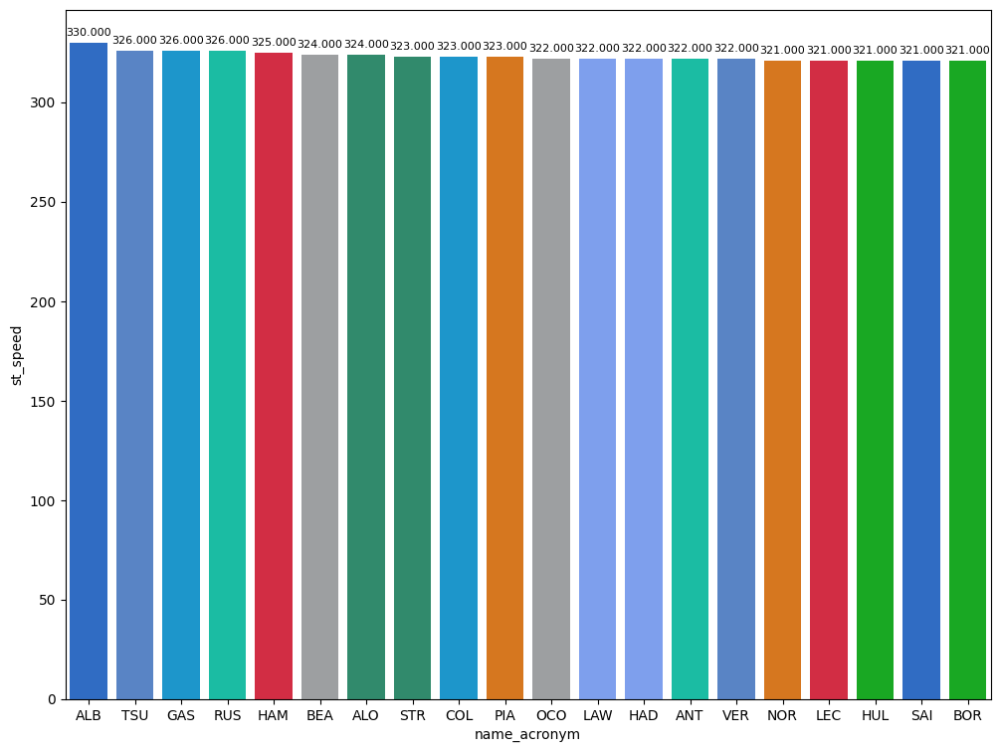

In [191]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax().dropna()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

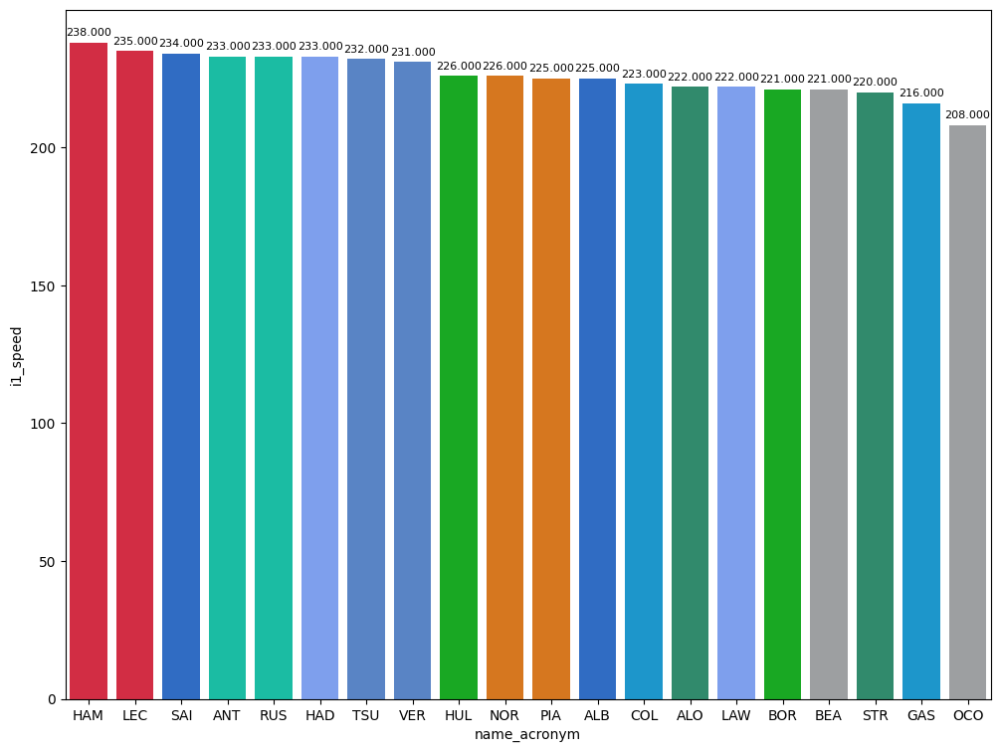

In [192]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

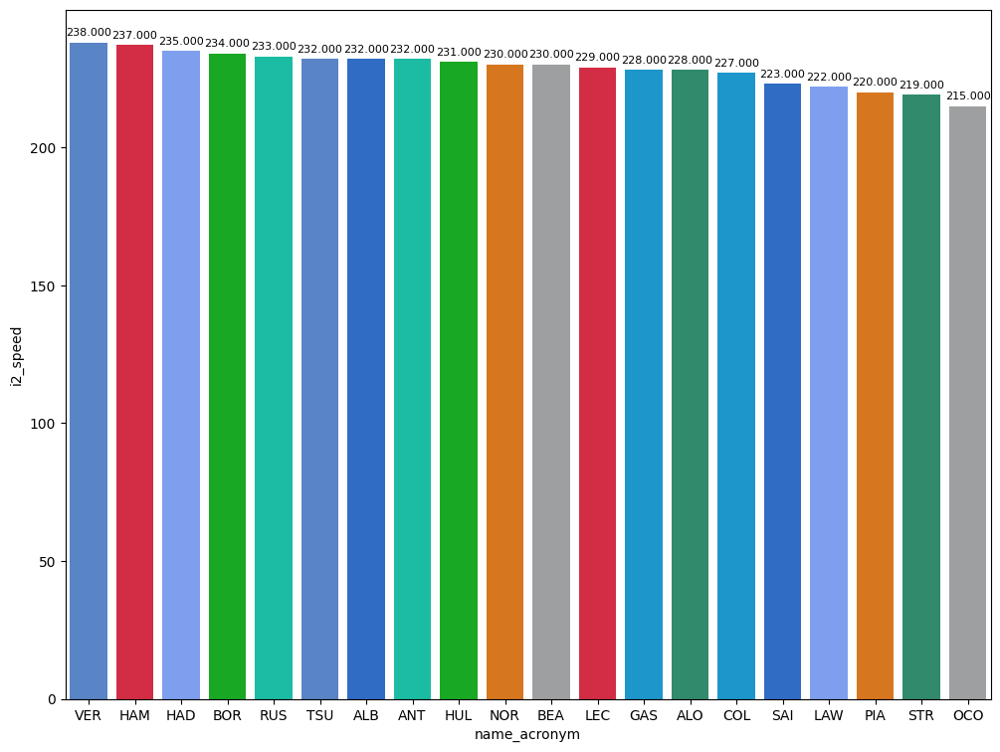

In [193]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [194]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
168,Oliver BEARMAN,HARD,36.257,41.581,25.026,102.864
268,Lance STROLL,MEDIUM,36.579,42.018,24.753,103.350
222,Lando NORRIS,SOFT,35.596,40.759,24.868,101.223


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [195]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


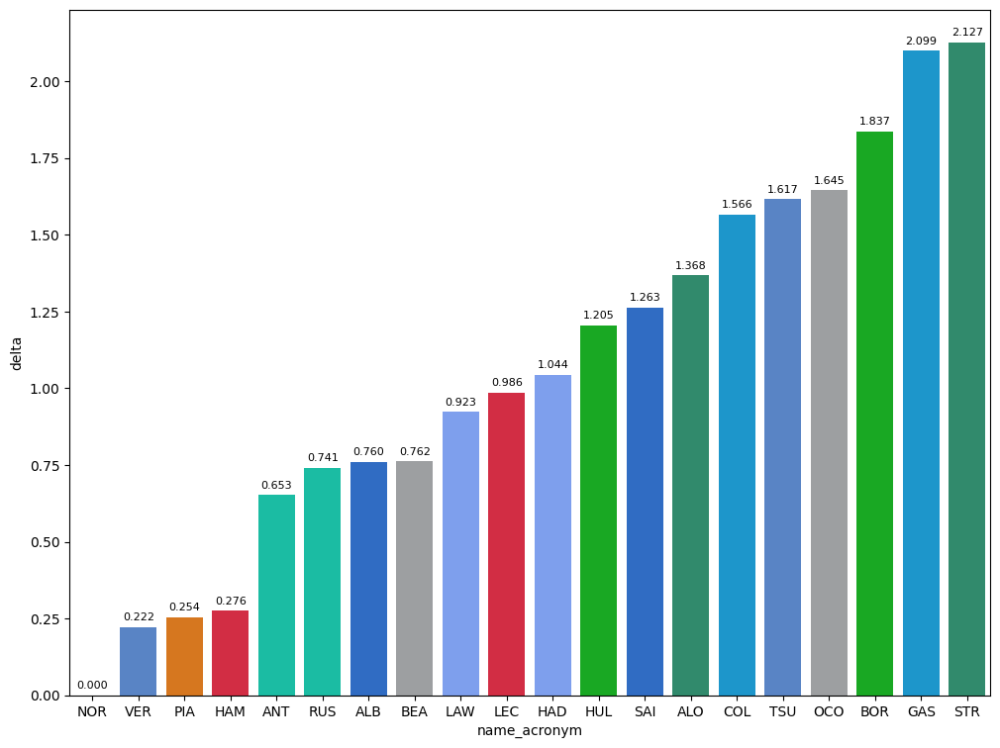

In [196]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

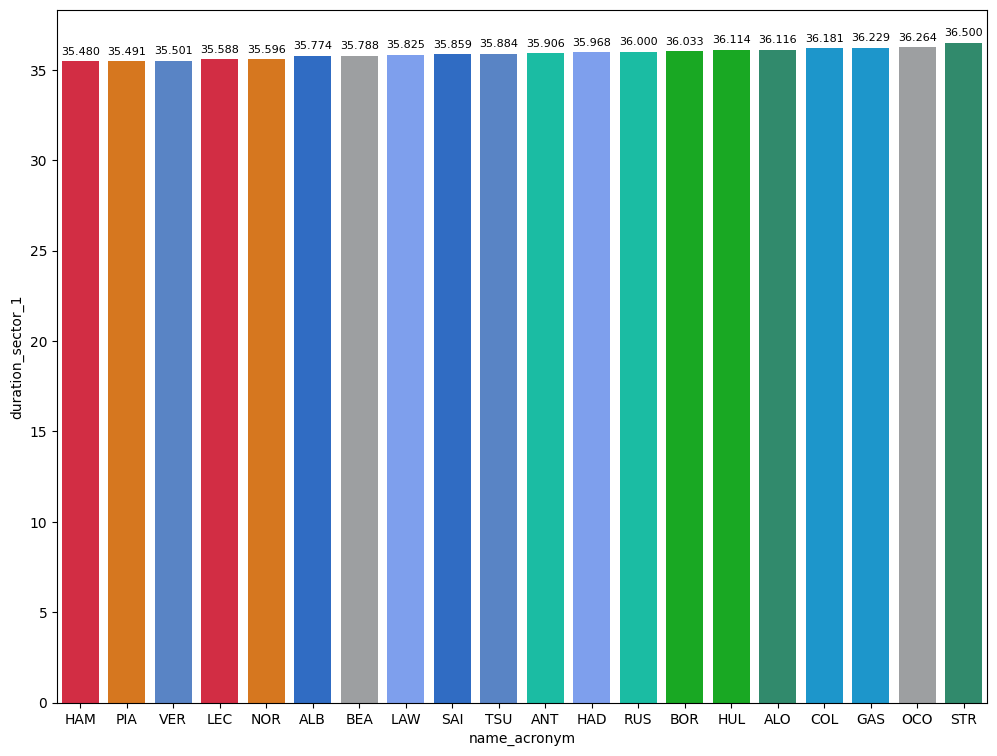

In [197]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin().dropna()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

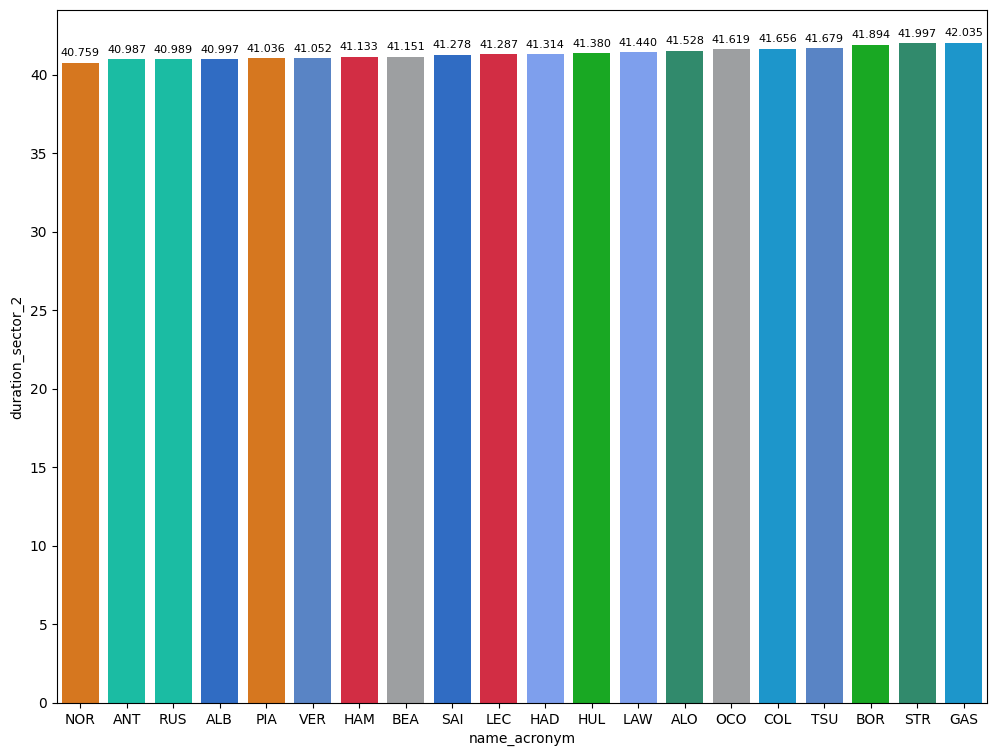

In [198]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin().dropna()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

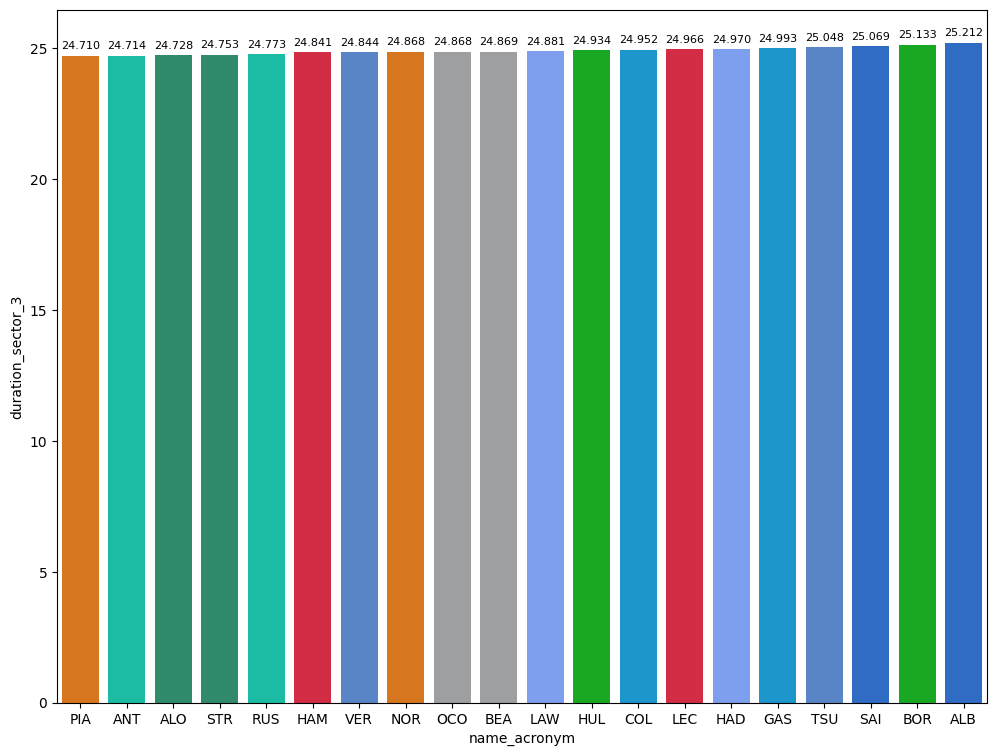

In [199]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin().dropna()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [200]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False and lap_duration <105 and lap_duration > 103").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
MEDIUM,103.426000
SOFT,103.970441
HARD,104.056571


## Predictions

In [ ]:
# Free Practice 1
practice = libraryDataF1.obtain_information('laps',session_key=9591)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9591)
drivers = libraryDataF1.obtain_information('drivers',session_key=9591)

stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointablesfreepractice1 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])

# Free Practice 2
practice = libraryDataF1.obtain_information('laps',session_key=9592)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9592)
drivers = libraryDataF1.obtain_information('drivers',session_key=9592)


stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointablesfreepractice2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])

# Free Practice 3
practice = libraryDataF1.obtain_information('laps',session_key=9591)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9591)
drivers = libraryDataF1.obtain_information('drivers',session_key=9591)

stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointablesfreepractice1 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])


### Qualyfing prediction

In [ ]:
qualy_simulation = libraryDataF1.qualyfing_prediction([jointablesfreepractice1,jointablesfreepractice2],drivers,0.02,0.02,0.08)
qualy_simulation.sort_values(by='qualy_lap_time')

### Race prediction

In [ ]:
race_simulation = libraryDataF1.race_prediction(jointablesfreepractice2,drivers,108,113)
race_simulation.groupby('team').mean().sort_values(by='mean_lap_duration')

## Qualyfing
### Set up
First of all, it is neccesary to obtain the data about the qualyfing
#### Race control
This section has been added in order to know which laps has been deleted and knowing what happened on track during this session. As every laptime that has been deleted were slow laps, none of them were removed.

In [240]:
race_control = libraryDataF1.obtain_information('race_control',session_key=9900)

In [241]:
race_control.query('message.str.contains("DELETED")')

,meeting_key,session_key,date,driver_number,lap_number,category,flag,scope,sector,message
9,1269,9900,2025-09-20T12:08:20+00:00,None,None,Other,None,None,NaN,CAR 12 (ANT) LAP DELETED - DOUBLE YELLOW AT TU...
10,1269,9900,2025-09-20T12:08:21+00:00,None,None,Other,None,None,NaN,CAR 55 (SAI) LAP DELETED - DOUBLE YELLOW AT TU...
11,1269,9900,2025-09-20T12:08:22+00:00,None,None,Other,None,None,NaN,CAR 6 (HAD) LAP DELETED - DOUBLE YELLOW AT TURN 1
33,1269,9900,2025-09-20T12:21:42+00:00,None,None,Other,None,None,NaN,CAR 12 (ANT) TIME 1:43.040 DELETED - TRACK LIM...
34,1269,9900,2025-09-20T12:23:01+00:00,None,None,Other,None,None,NaN,CAR 27 (HUL) LAP DELETED - TRACK LIMITS AT TUR...
98,1269,9900,2025-09-20T12:51:16+00:00,None,None,Other,None,None,NaN,CAR 16 (LEC) TIME 17:46.948 DELETED - DOUBLE Y...
99,1269,9900,2025-09-20T12:51:17+00:00,None,None,Other,None,None,NaN,CAR 44 (HAM) TIME 16:44.359 DELETED - DOUBLE Y...
100,1269,9900,2025-09-20T12:51:18+00:00,None,None,Other,None,None,NaN,CAR 6 (HAD) TIME 16:38.384 DELETED - TRACK LIM...
115,1269,9900,2025-09-20T13:02:27+00:00,None,None,Other,None,None,NaN,CAR 16 (LEC) TIME 2:20.087 DELETED - TRACK LIM...
120,1269,9900,2025-09-20T13:04:29+00:00,None,None,Other,None,None,NaN,CAR 16 (LEC) LAP DELETED - TRACK LIMITS AT TUR...


In [242]:
race_control.query('message.str.contains("GREEN")')

,meeting_key,session_key,date,driver_number,lap_number,category,flag,scope,sector,message
2,1269,9900,2025-09-20T12:00:00+00:00,None,None,Flag,GREEN,Track,NaN,GREEN LIGHT - PIT EXIT OPEN
25,1269,9900,2025-09-20T12:15:00+00:00,None,None,Flag,GREEN,Track,NaN,GREEN LIGHT - PIT EXIT OPEN
53,1269,9900,2025-09-20T12:28:00+00:00,None,None,Flag,GREEN,Track,NaN,GREEN LIGHT - PIT EXIT OPEN
85,1269,9900,2025-09-20T12:48:00+00:00,None,None,Flag,GREEN,Track,NaN,GREEN LIGHT - PIT EXIT OPEN
111,1269,9900,2025-09-20T12:58:00+00:00,None,None,Flag,GREEN,Track,NaN,GREEN LIGHT - PIT EXIT OPEN
132,1269,9900,2025-09-20T13:18:00+00:00,None,None,Flag,GREEN,Track,NaN,GREEN LIGHT - PIT EXIT OPEN
166,1269,9900,2025-09-20T13:37:00+00:00,None,None,Flag,GREEN,Track,NaN,GREEN LIGHT - PIT EXIT OPEN
191,1269,9900,2025-09-20T13:54:00+00:00,None,None,Flag,GREEN,Track,NaN,GREEN LIGHT - PIT EXIT OPEN


In [243]:
race_control.query('message.str.contains("CHEQUERED")')

,meeting_key,session_key,date,driver_number,lap_number,category,flag,scope,sector,message
58,1269,9900,2025-09-20T12:34:36+00:00,None,None,Flag,CHEQUERED,Track,NaN,CHEQUERED FLAG
123,1269,9900,2025-09-20T13:09:54+00:00,None,None,Flag,CHEQUERED,Track,NaN,CHEQUERED FLAG
193,1269,9900,2025-09-20T13:57:41+00:00,None,None,Flag,CHEQUERED,Track,NaN,CHEQUERED FLAG


### Obtain setup

In [244]:
qualyfing = libraryDataF1.obtain_information('laps',session_key=9900)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9900)
drivers = libraryDataF1.obtain_information('drivers',session_key=9900)

In [245]:
session = ff1.get_session(2025, 17, 'Q')
session.load();
session.laps["LapTimeSeconds"] = session.laps["LapTime"].dt.total_seconds()

core           INFO 	Loading data for Azerbaijan Grand Prix - Qualifying [v3.3.0]
req            INFO 	No cached data found for session_info. Loading data...
_api           INFO 	Fetching session info data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for driver_info. Loading data...
_api           INFO 	Fetching driver list...
req            INFO 	Data has been written to cache!
logger      WARNING 	Failed to load result data from Ergast!
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	No cached data found for session_status_data. Loading data...
_api           INFO 	Fetching session status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for track_status_data. Loading data...
_api           INFO 	Fetching track status data...
req            INFO 	Data has been written to cache!
req            IN

In [246]:
laptimes_deleted = [103.040]
driver_number_lap_deleted = [12]

for ltime_deleted, dn_time_deleted in zip(laptimes_deleted,driver_number_lap_deleted):
    try:
        id_deleted = qualyfing.query("driver_number == @dn_time_deleted and lap_duration == @ltime_deleted").index[0]
        qualyfing = qualyfing.drop(id_deleted)
    except:
        print("Laptime deleted associated with the selected driver does not exist. Please, check again the order of the arrays")

In [247]:
bestlap = qualyfing.loc[qualyfing.groupby(['driver_number'])['lap_duration'].idxmin()].sort_values(by=['lap_duration'],ascending=True)

In this case, the fastest lap is 101.365 seconds (1.41.365= so that to obtain the competitve laps the fastest lap will be multiplied by 1.07 108.45 seconds) due to, according to the rules all the drivers have to do unless one lap within this gap.

In [248]:
competitiveLaps = qualyfing.query("is_pit_out_lap == False and lap_duration <= 108.45")

In [249]:
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()

#### Best lap per driver compared with the best lap of the session
In this chart we can see the deltas with compared with the fastest lap of the session that it could be different than the pole.

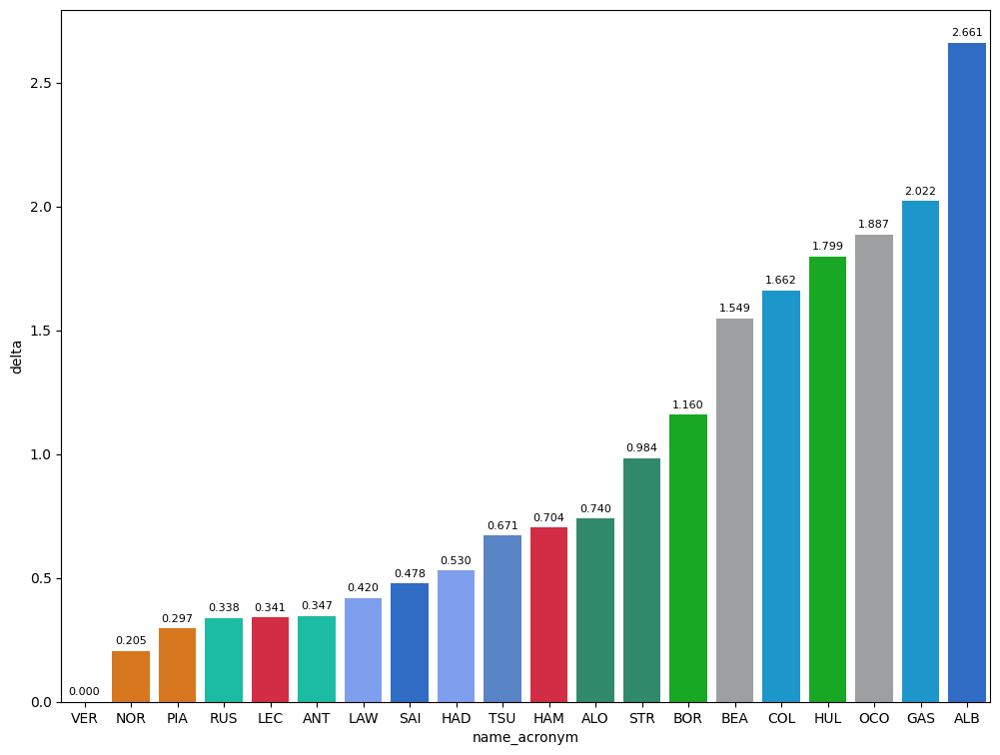

In [250]:
dt = jointables.sort_values(by=['fastest_lap'],ascending=True)
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Speed trap

#### Maximum speed per drivers

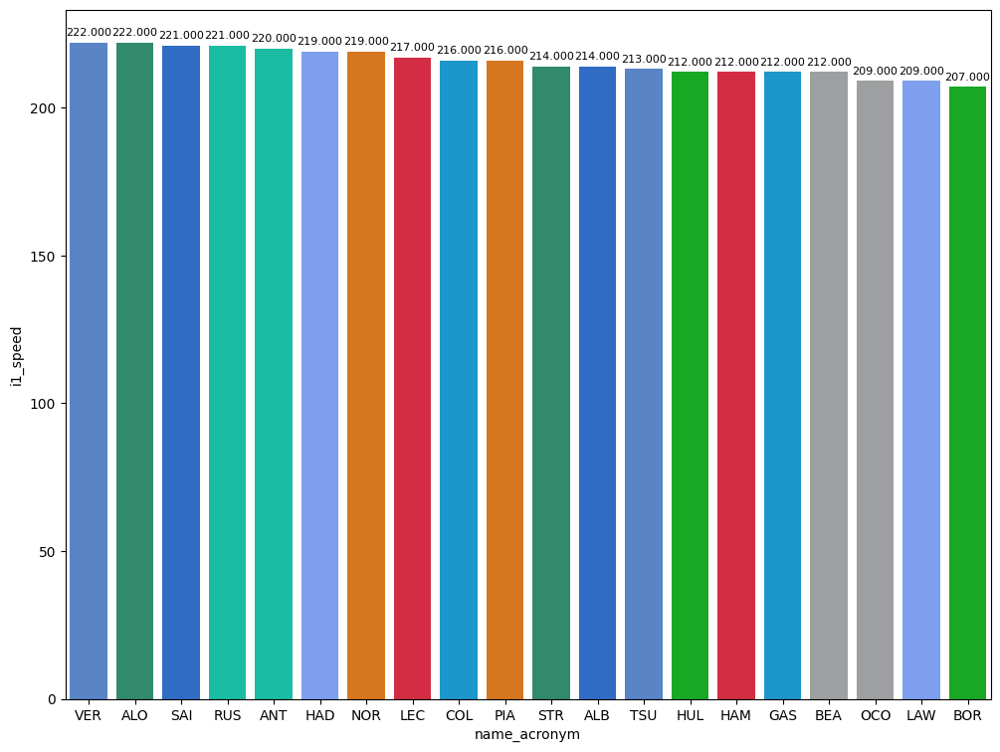

In [251]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

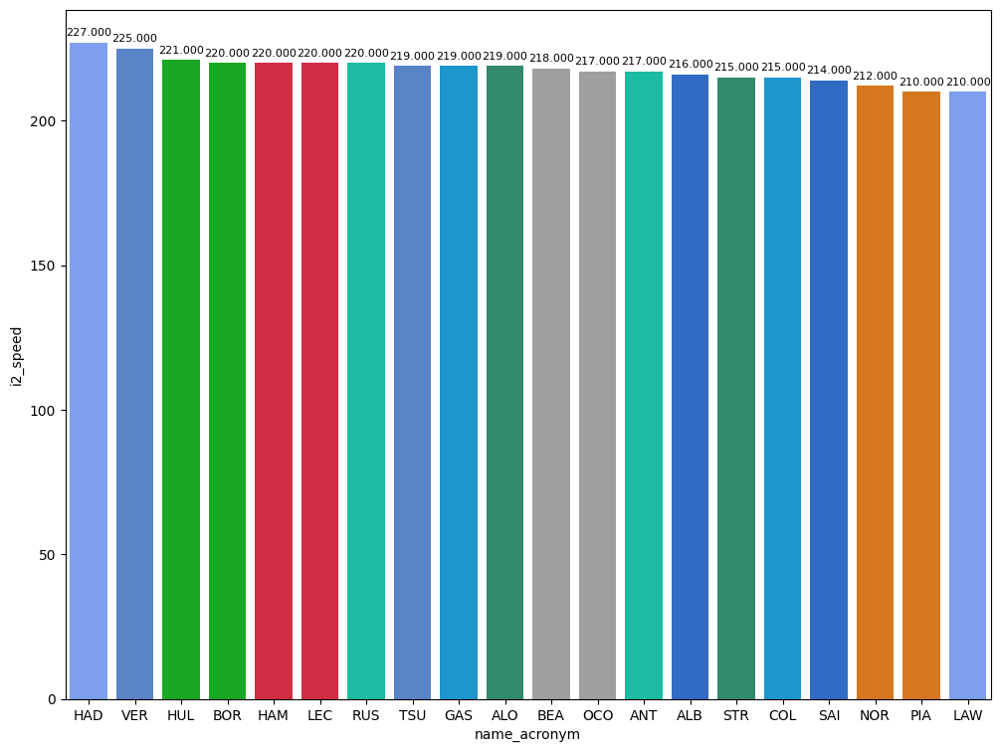

In [252]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

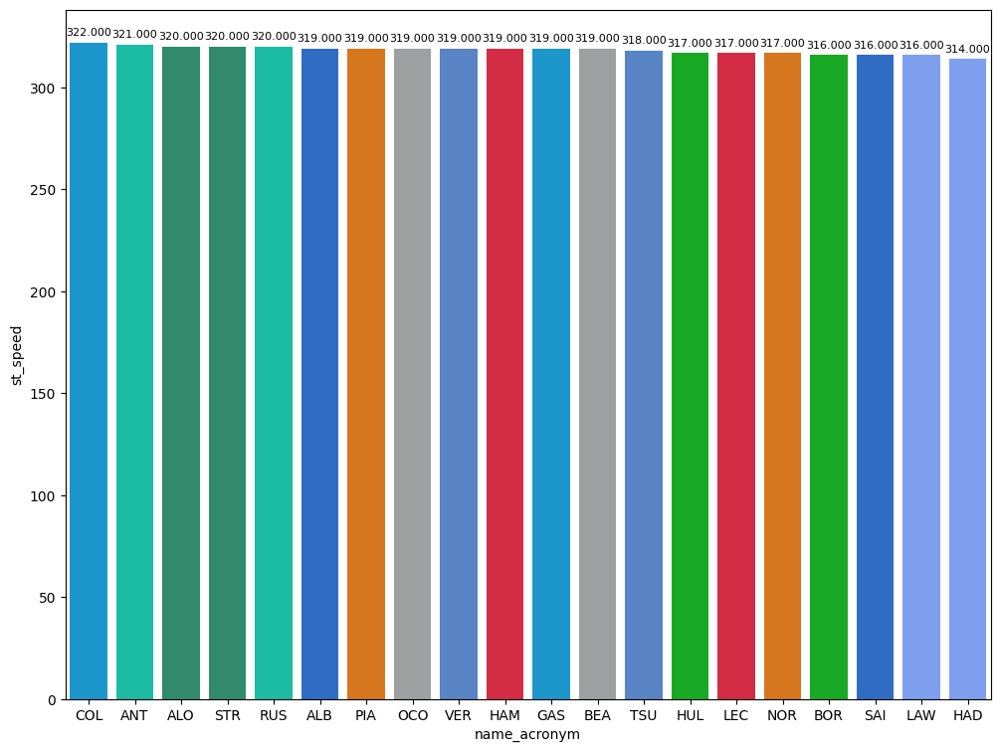

In [253]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

### Maximum speed per teams

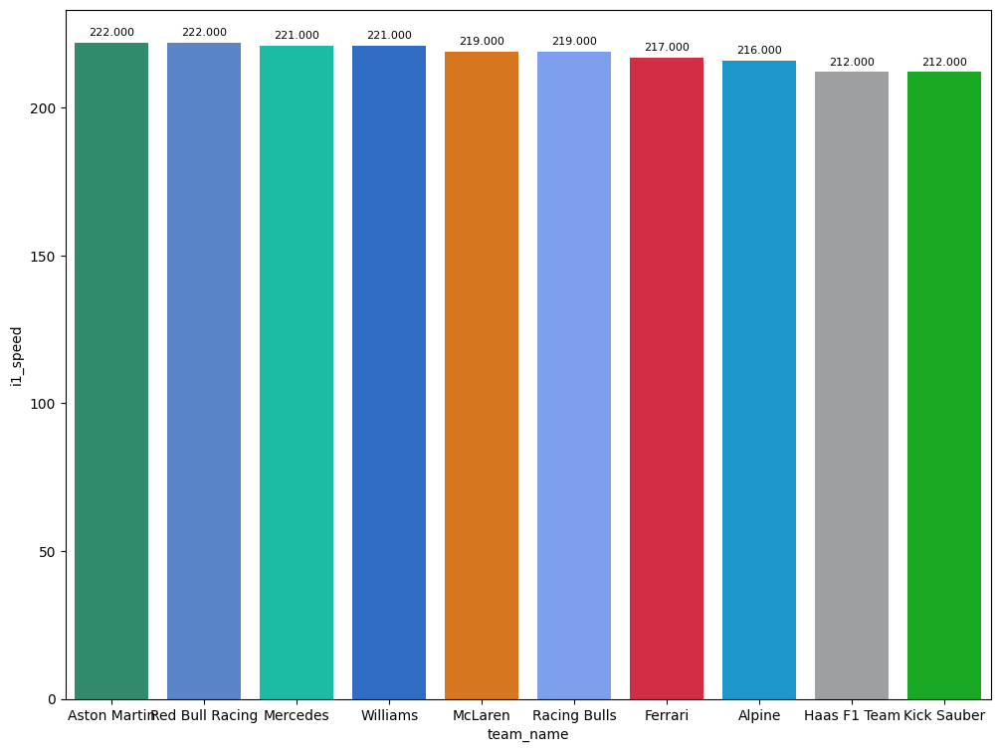

In [254]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i1_speed",top_speed)

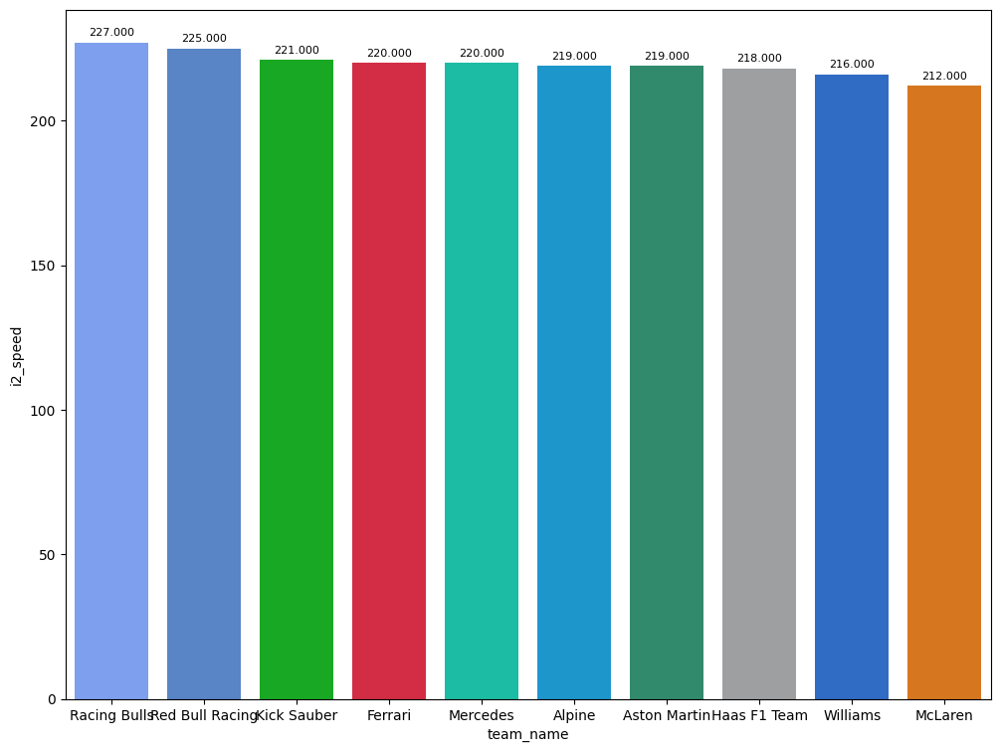

In [255]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i2_speed",top_speed)

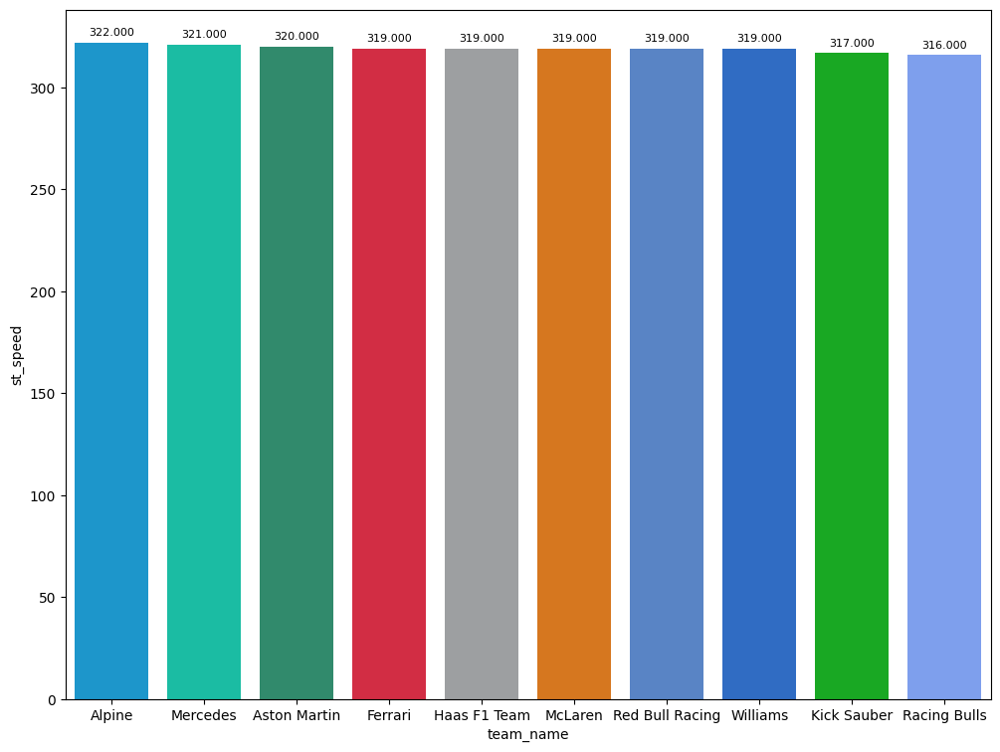

In [256]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","st_speed",top_speed)

In [257]:
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])

In order to know when each session finished, race control dataset will be consulted.

In [258]:
maximumDateQ1 = "date_start <'2025-09-20T12:48:00+00:00'"
maximumDateQ2 = "date_start <'2025-09-20T13:18:00+00:00' and date_start >'2025-09-20T12:48:00+00:00'"
maximumDateQ3 = "date_start >'2025-09-20T13:18:00+00:00'"

### Qualyfing 1

In [259]:
q1Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver,I will do a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap. 

Due to track evolution, most of the drivers had to use two sets of tyres.Using F1 tempo to watch the telemetry alongside the section where I comment the gap difference among the drivers eliminated compared to the driver that finished in a risk position to be eliminated. Compairing their laptimes, we can see that he have seen in Free Practices with Aston Martin, they are fast on the straights. After the exit of the sector 1, Alonso and Bottas were fighting for the best sector among them. In sector 2, Alonso struggled a lot and Ricciardo that he should have an high downforce because Norris and Ricciardo were faster than him. In the third sector, thanks to the low-downforce, Alonso was able to cut the gap and finishing P15.



In [260]:
#Reference
P15 = q1Data[14:15]

In [261]:
print(
"Driver:",P15.full_name.to_string(index=False),
"Sector 1: ",P15.duration_sector_1.to_string(index=False),
"Sector 2: ",P15.duration_sector_2.to_string(index=False),
"Sector 3: ",P15.duration_sector_3.to_string(index=False)
)

Driver: Oliver BEARMAN Sector 1:  36.506 Sector 2:  41.225 Sector 3:  24.935


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.


In [263]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[15::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,43,0.113,-0.599,0.534,0.178,COL
1,27,0.250,-0.158,0.367,0.041,HUL
2,31,0.338,-0.195,0.456,0.077,OCO
3,10,0.473,-0.380,0.550,0.303,GAS
4,23,1.112,0.198,0.496,0.418,ALB


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: Futur

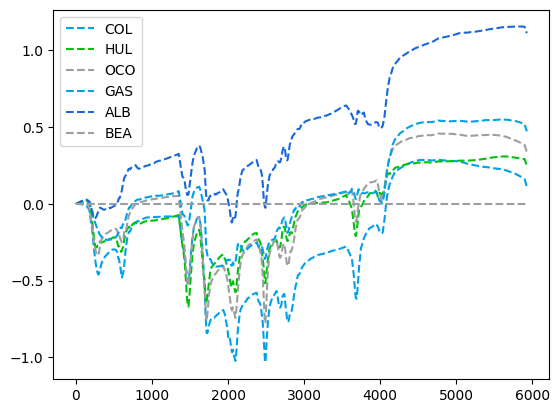

In [264]:
libraryDataF1.draw_gap(P15,15,20,q1Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.

In [265]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[0:14].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,4,-1.344,-1.028,-0.243,-0.073,NOR
1,1,-1.335,-1.090,-0.247,0.002,VER
2,16,-1.208,-1.006,-0.383,0.181,LEC
3,63,-1.020,-0.657,-0.174,-0.189,RUS
4,6,-1.010,-0.776,-0.241,0.007,HAD
5,44,-0.845,-0.934,0.040,0.049,HAM
6,81,-0.827,-0.817,-0.209,0.199,PIA
7,18,-0.565,-0.562,-0.119,0.116,STR
8,14,-0.455,-0.604,0.236,-0.087,ALO
9,12,-0.419,-0.500,0.056,0.025,ANT


#### Best sector per driver
In this section we can see the best sector of the session

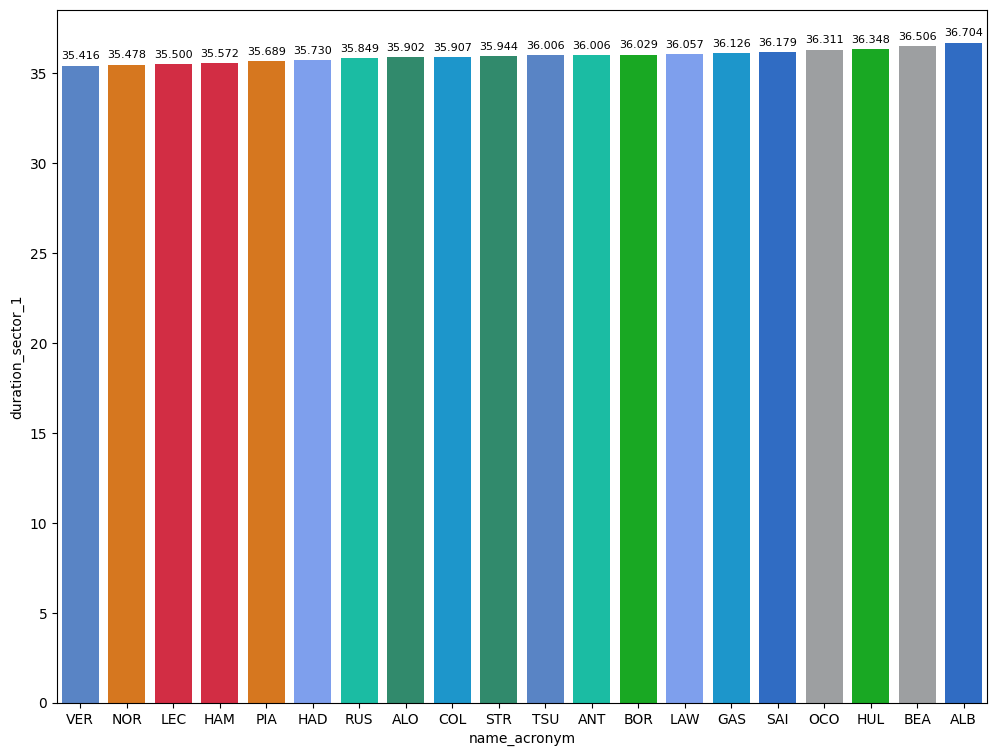

In [266]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

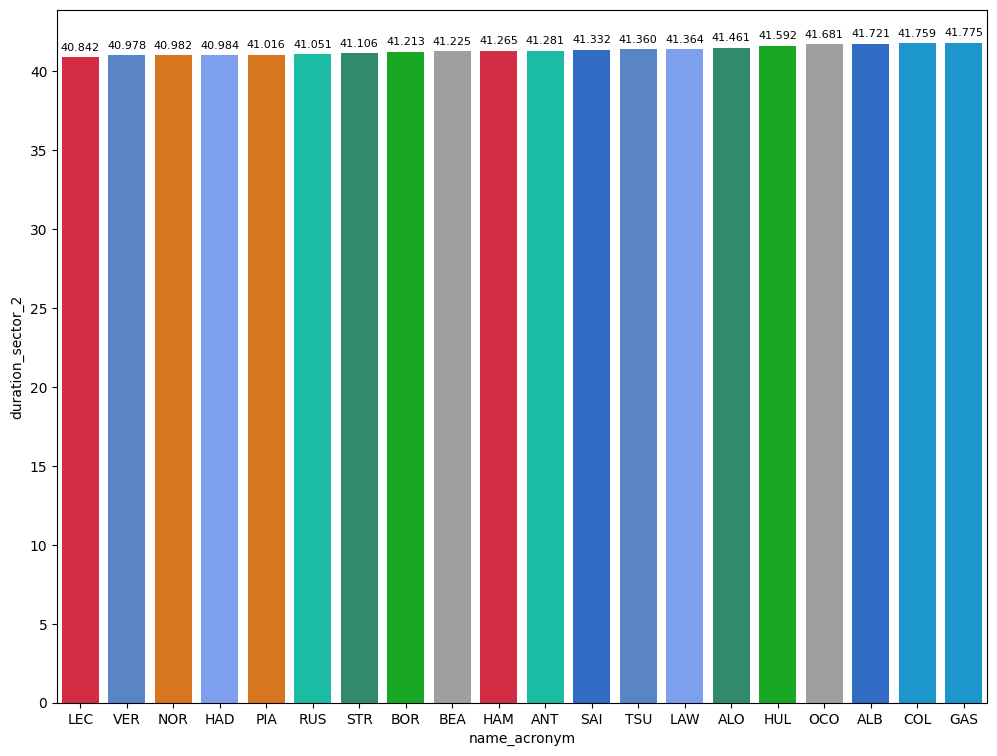

In [267]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

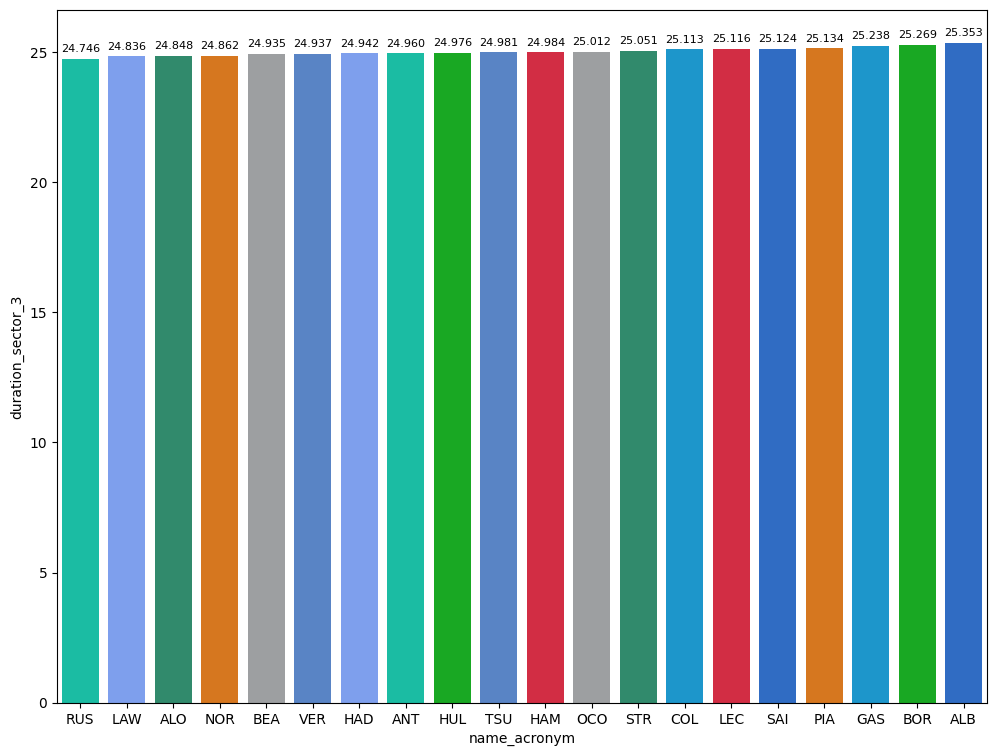

In [268]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 2

In [269]:
q2Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.
As I mentioned in the Q1 section, track evolution was the point to take into account but it was not the unique thing to watch. Downforce was very importamt and finding a balance between low and high was important for this circuit due to the sector 2 requires a high downforce but the straights located on the first and third sector requires on low downforce.
In the Q2 case, Haas opted for a low downforce because they were better than Albon in the first and third sector but in the second Albon was the best.

In [270]:
#Reference
P10 = q2Data[9:10]
print(
"Driver:",P10.full_name.to_string(index=False),
"Sector 1: ",P10.duration_sector_1.to_string(index=False),
"Sector 2: ",P10.duration_sector_2.to_string(index=False),
"Sector 3: ",P10.duration_sector_3.to_string(index=False)
)

Driver: Yuki TSUNODA Sector 1:  35.775 Sector 2:  40.837 Sector 3:  25.176


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.


In [271]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[10::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,14,0.069,0.050,0.271,-0.252,ALO
1,44,0.395,-0.064,0.524,-0.065,HAM
2,5,0.489,0.079,0.233,0.177,BOR
3,18,1.273,0.253,1.184,-0.164,STR


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.

/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning:

`utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.



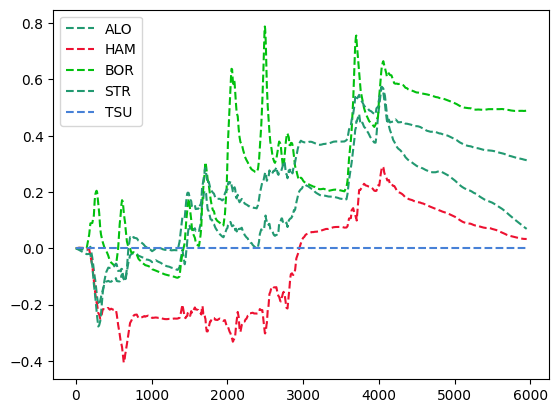

In [272]:
libraryDataF1.draw_gap(P10,10,15,q2Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk

In [273]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[0:9].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,1,-0.533,-0.390,-0.094,-0.049,VER
1,4,-0.392,-0.190,-0.001,-0.201,NOR
2,81,-0.374,-0.325,-0.012,-0.037,PIA
3,63,-0.333,-0.193,0.153,-0.293,RUS
4,12,-0.324,-0.036,-0.010,-0.278,ANT
5,16,-0.269,0.022,-0.052,-0.239,LEC
6,30,-0.251,-0.074,0.106,-0.283,LAW
7,6,-0.141,-0.107,0.119,-0.153,HAD
8,55,-0.113,-0.123,-0.004,0.014,SAI


#### Best sector per driver
In this section we can see the best sector of the session

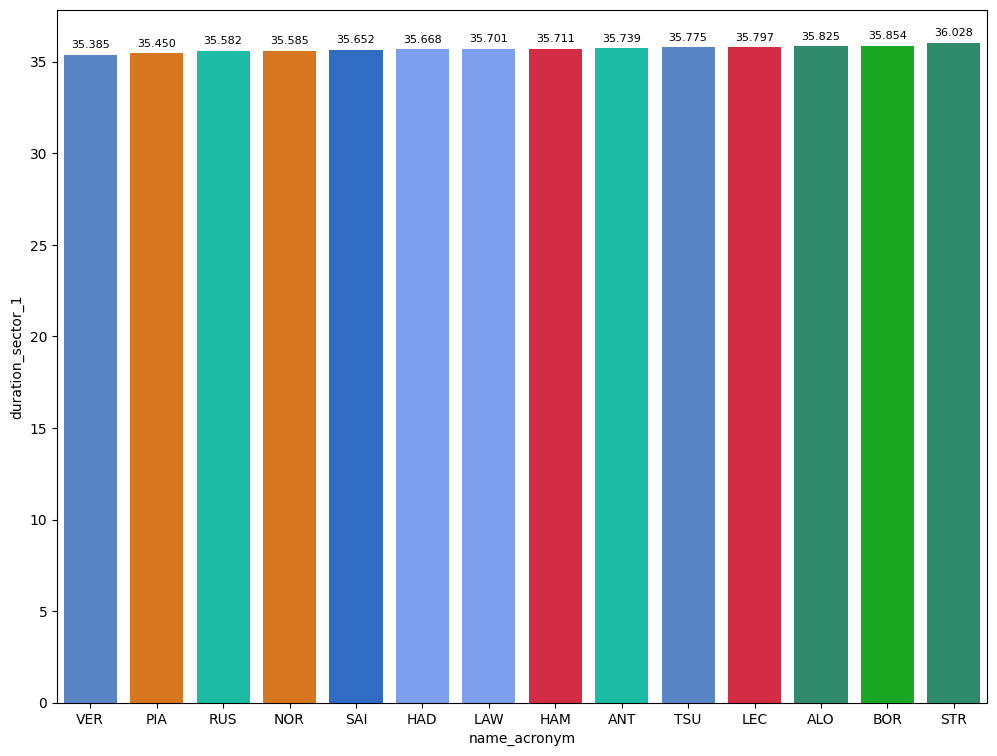

In [274]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q2Data.sort_values(by=['duration_sector_1'],ascending=True))

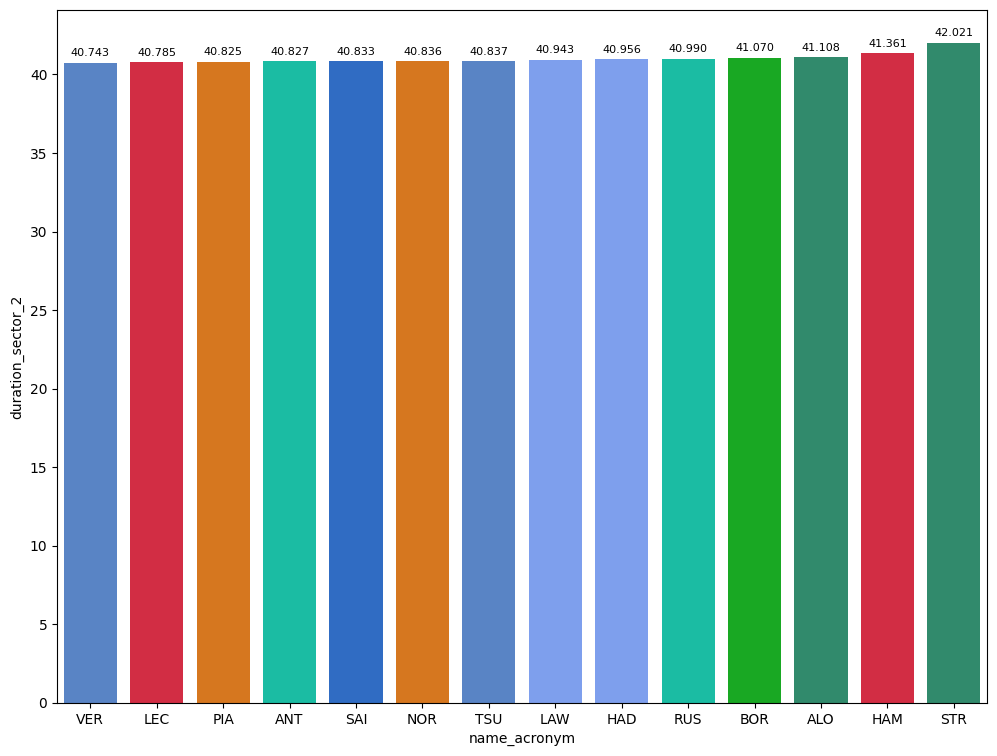

In [275]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q2Data.sort_values(by=['duration_sector_2'],ascending=True))

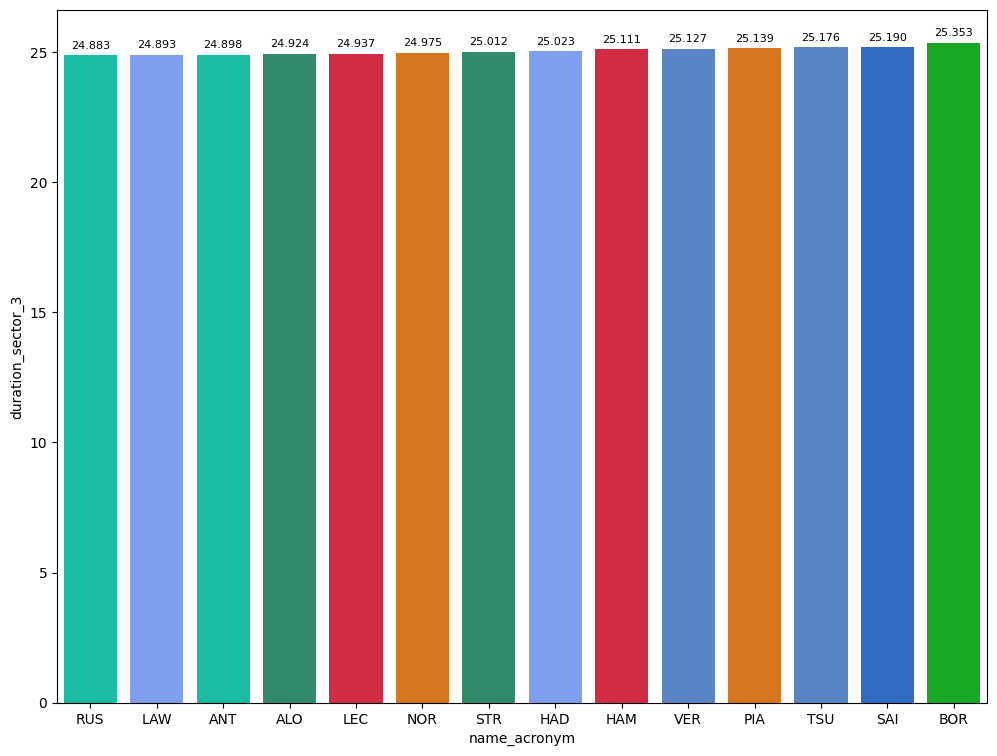

In [276]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q2Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 3

In [277]:
q3Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with poleman
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [278]:
#Reference
P1 = q3Data[:1]
print(
"Driver:",P1.full_name.to_string(index=False),
"Sector 1: ",P1.duration_sector_1.to_string(index=False),
"Sector 2: ",P1.duration_sector_2.to_string(index=False),
"Sector 3: ",P1.duration_sector_3.to_string(index=False)
)

Driver: Max VERSTAPPEN Sector 1:  35.331 Sector 2:  40.577 Sector 3:  25.209


##### Analysis of each sector of the poleman compared to the drivers eliminated.
In Qualy, we saw that the pole was going to be a close battle among Ferrari, Red Bull, McLaren and Mercedes. With Norris out of Q1, the battle was going to be among seven drivers. In the first sector, Perez was the fastest, followed by Leclerc and Sainz.But, it seemed that Red Bull was focused on low downforce due to they were not able to compete versus Leclerc.


In [279]:
newdataset2 = pd.DataFrame()
for index,row in q3Data[1::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P1,newdataset2)
newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,55,0.478,0.507,-0.003,-0.026,SAI
1,30,0.590,0.101,0.739,-0.250,LAW
2,12,0.600,0.387,0.263,-0.050,ANT
3,63,0.953,0.421,0.754,-0.222,RUS
4,22,1.026,0.707,0.402,-0.083,TSU
5,4,1.122,0.181,0.840,0.101,NOR
6,6,1.255,0.225,0.489,0.541,HAD


#### Best sector per driver
In this section we can see the best sector of the session

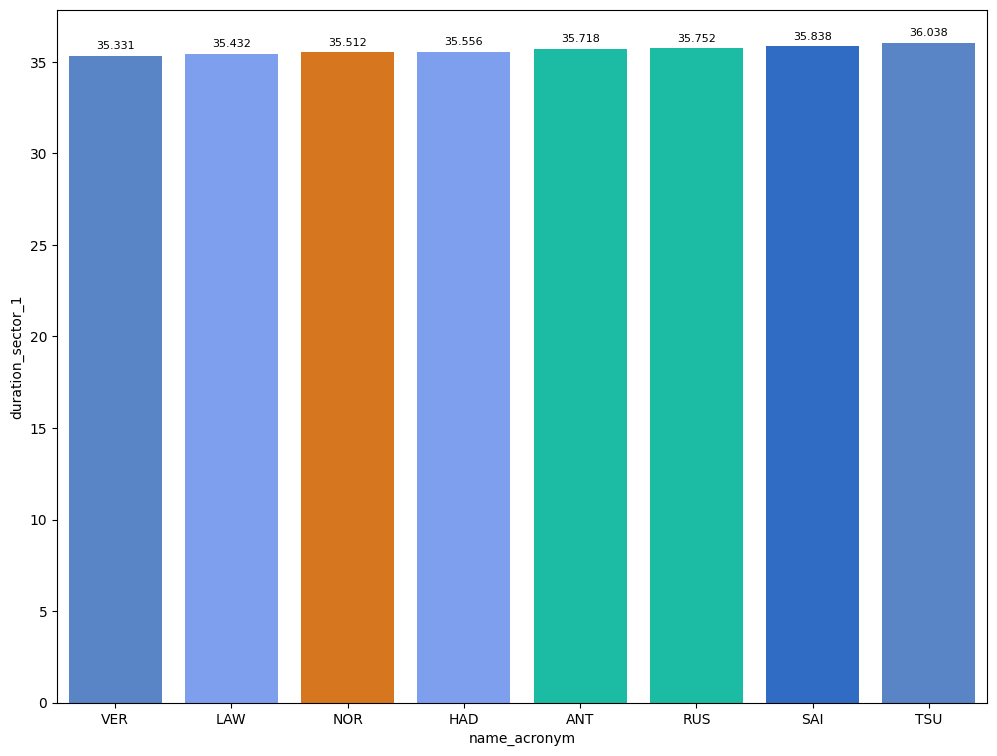

In [280]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q3Data.sort_values(by=['duration_sector_1'],ascending=True))

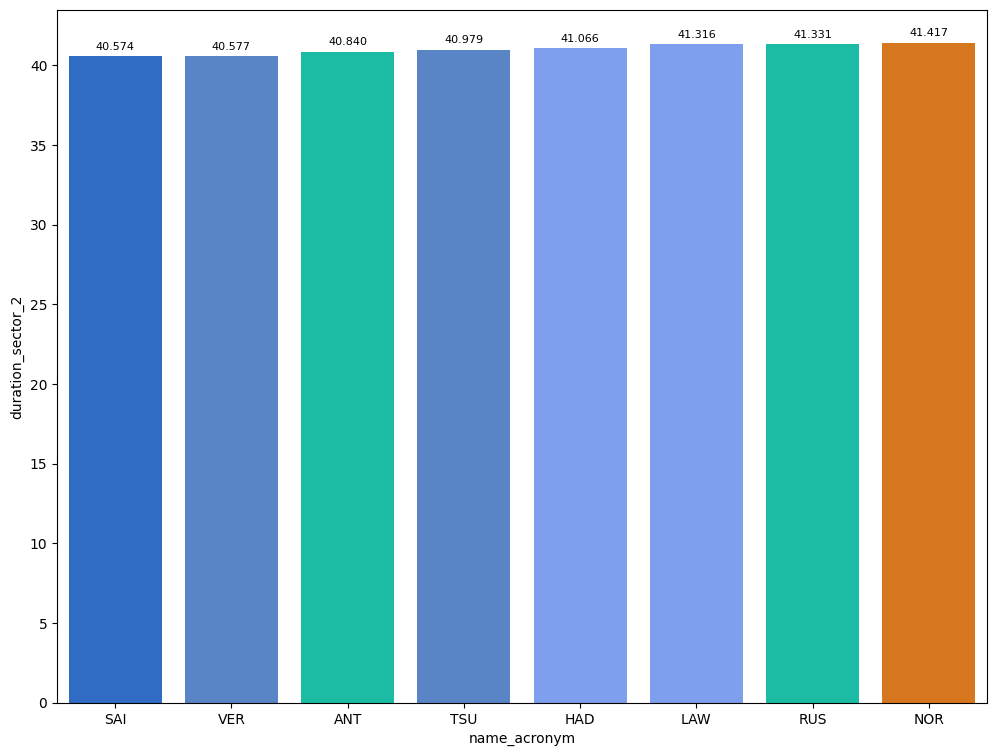

In [281]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q3Data.sort_values(by=['duration_sector_2'],ascending=True))

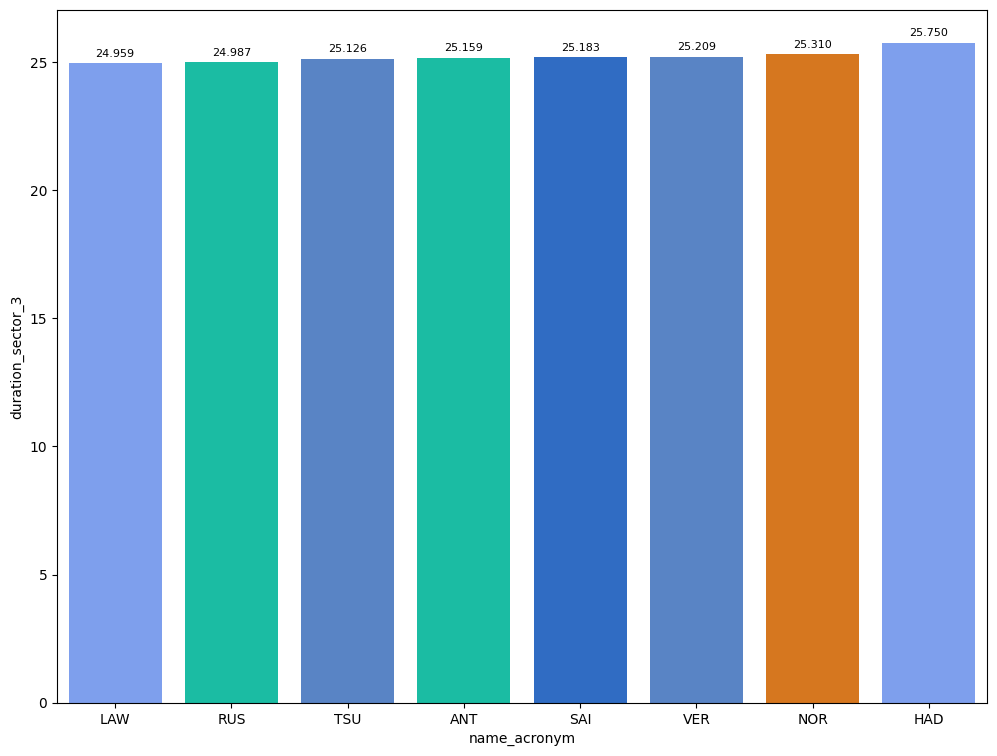

In [282]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q3Data.sort_values(by=['duration_sector_3'],ascending=True))

#### Best sector per driver of the session (in general)

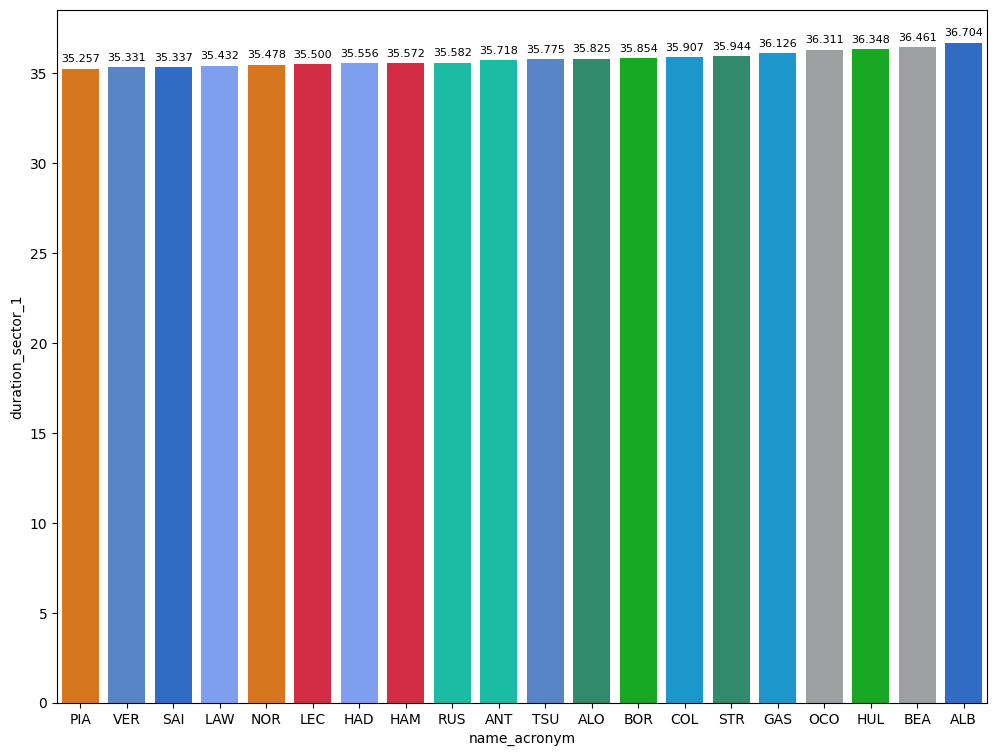

In [283]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_1'].min().sort_values(ascending=True)).reset_index())

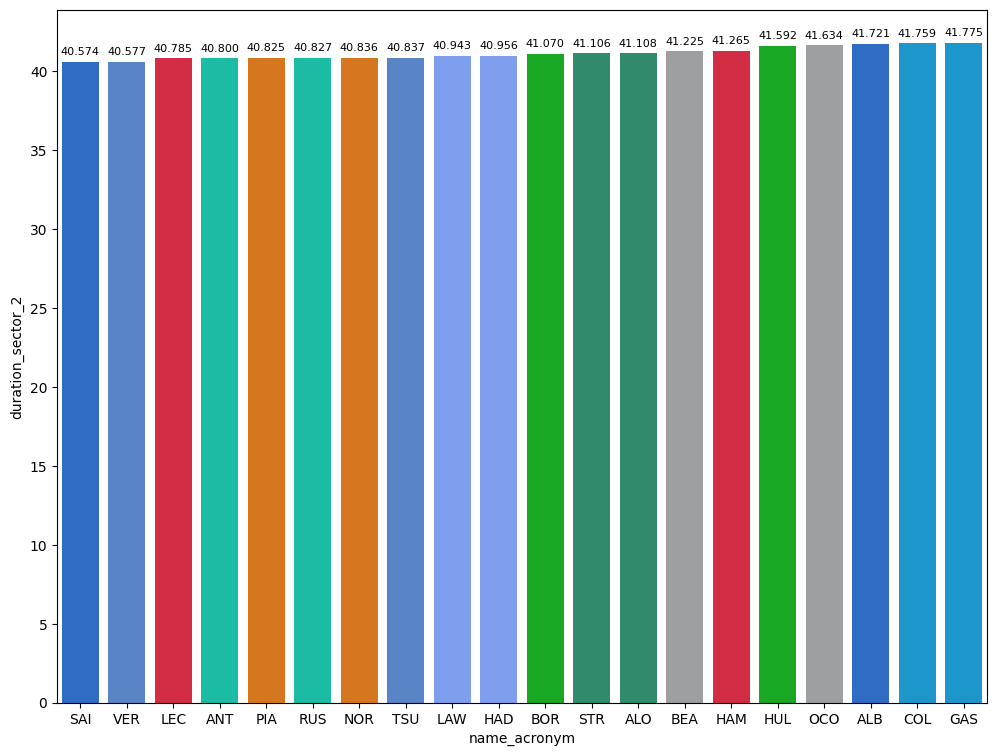

In [284]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_2'].min().sort_values(ascending=True)).reset_index())

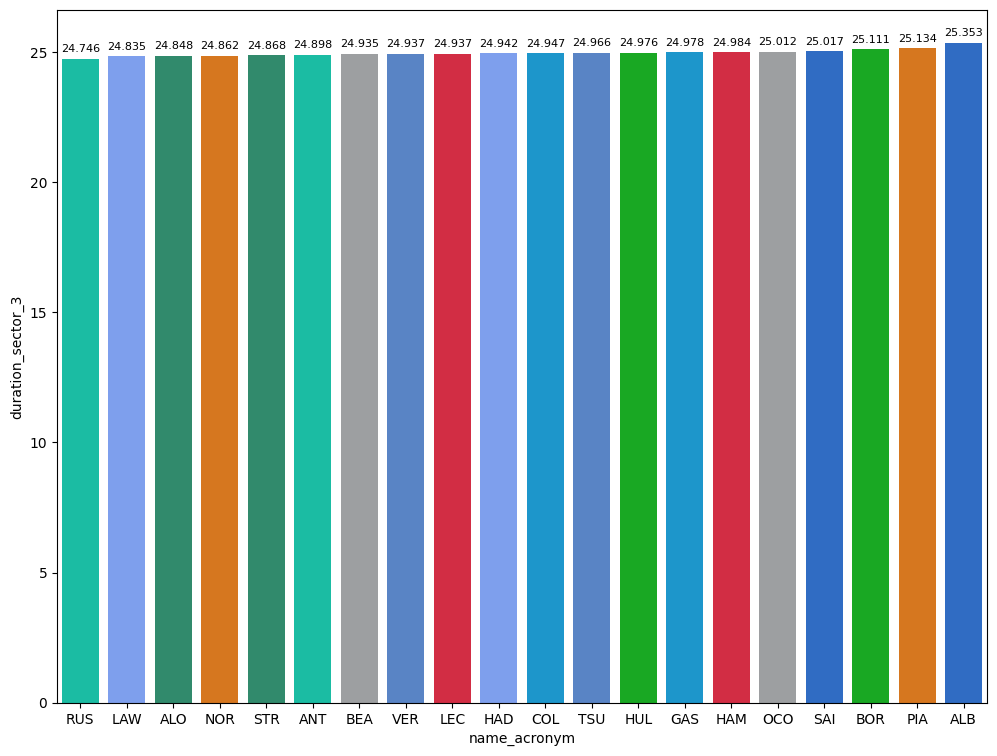

In [285]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_3'].min().sort_values(ascending=True)).reset_index())

### Comparaison between the poleman and the second

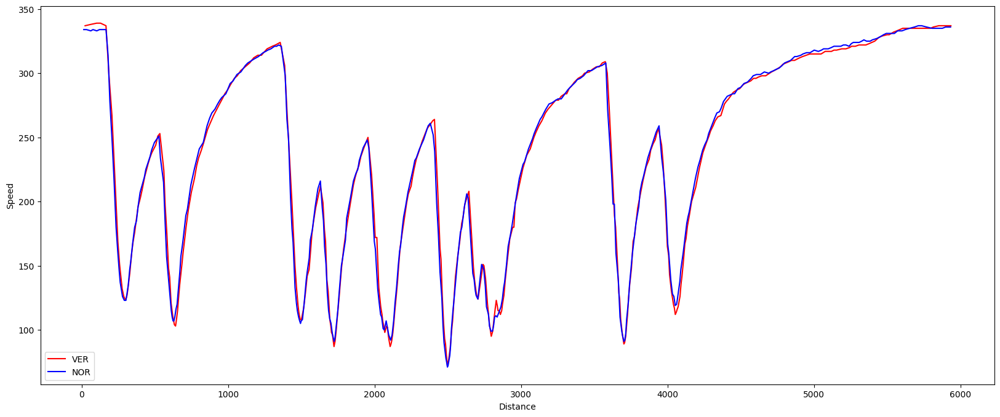

In [286]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

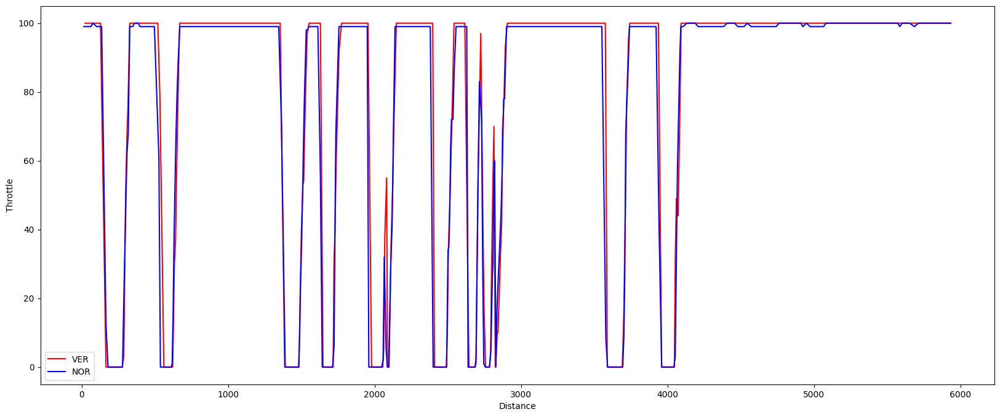

In [287]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

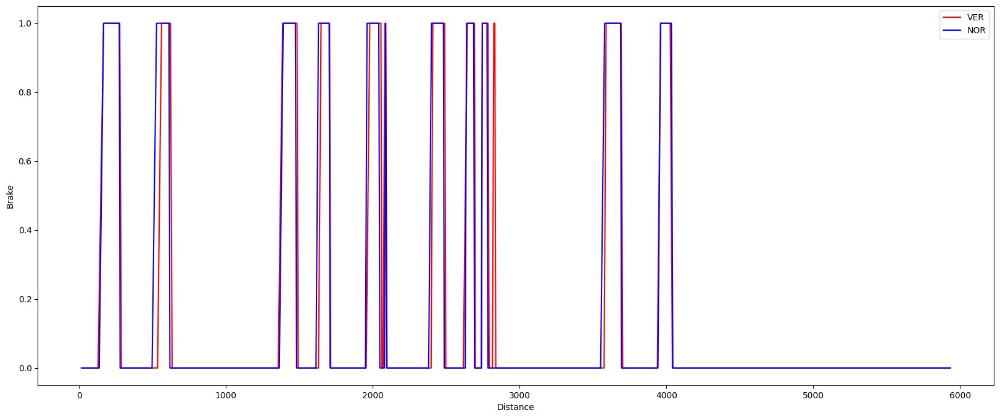

In [288]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

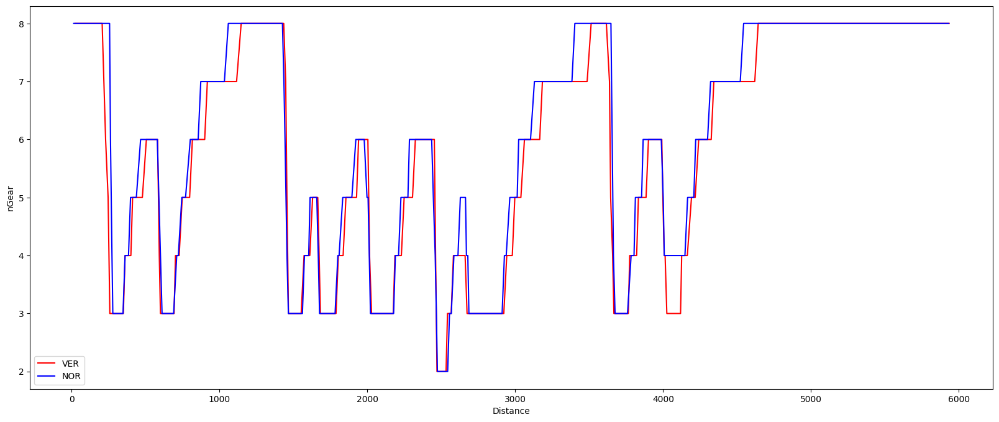

In [289]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Race
### Obtain setup

In [385]:
race = libraryDataF1.obtain_information('laps',session_key=9904)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9904)
drivers = libraryDataF1.obtain_information('drivers',session_key=9904)

In [386]:
libraryDataF1.obtain_drivers_colours(drivers)

In [387]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)

In [388]:
raceLaps = race.query("is_pit_out_lap == False")
jointables = pd.merge(raceLaps,stintsDataFrame,on=['lap_number','driver_number'])

### Tyre Strategies

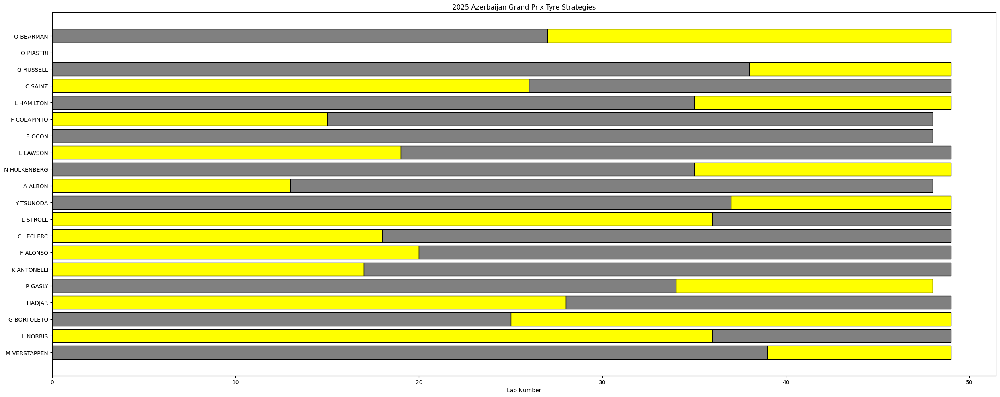

In [389]:
libraryDataF1.race_strategies("2025 Azerbaijan Grand Prix Tyre Strategies",drivers,stintInformation)

### Lap Time Distributions

/home/frank/Escritorio/F1_backup/F1_notebooks/F1_25/F1_library/libraryF1dataNotebook.py:576: UserWarning:

The palette list has more values (20) than needed (19), which may not be intended.



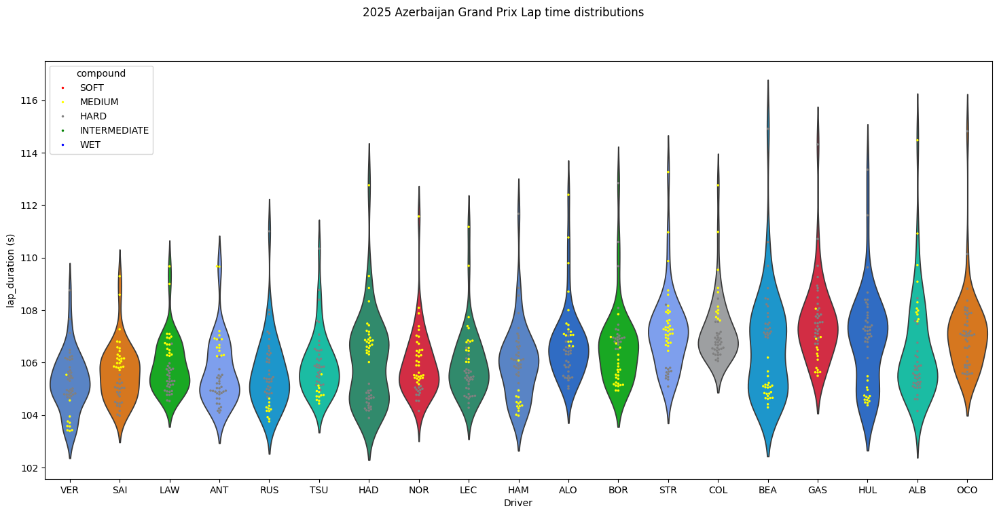

In [390]:
libraryDataF1.lap_time_distributions("2025 Azerbaijan Grand Prix Lap time distributions",drivers,jointables.query("lap_duration<122"))

### Speed trap

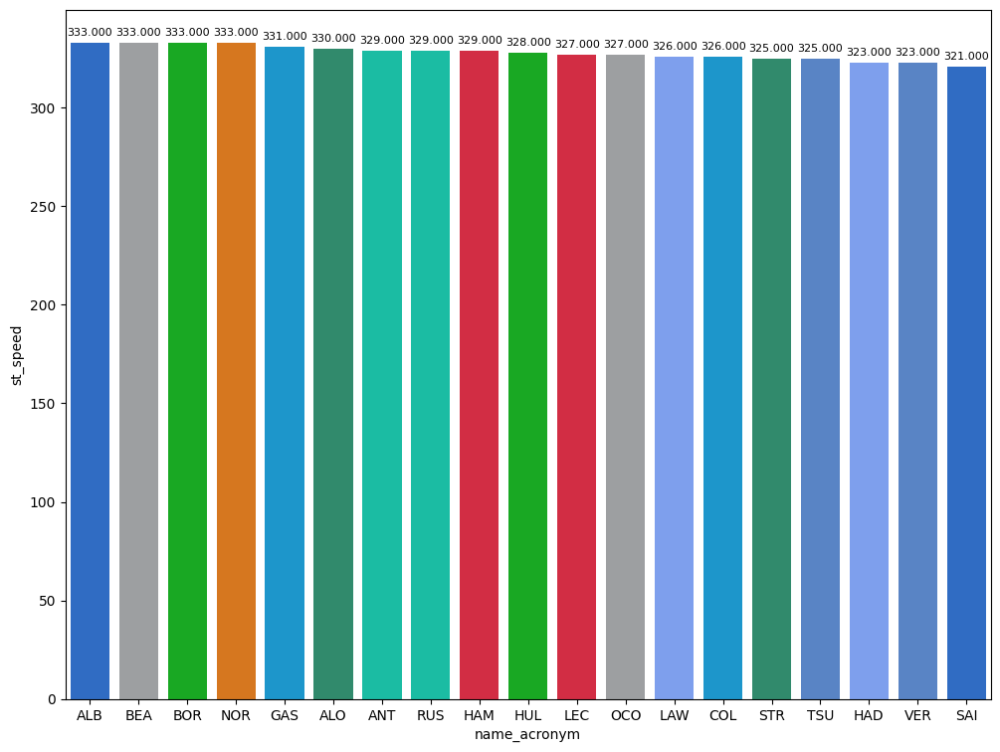

In [391]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax().dropna()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

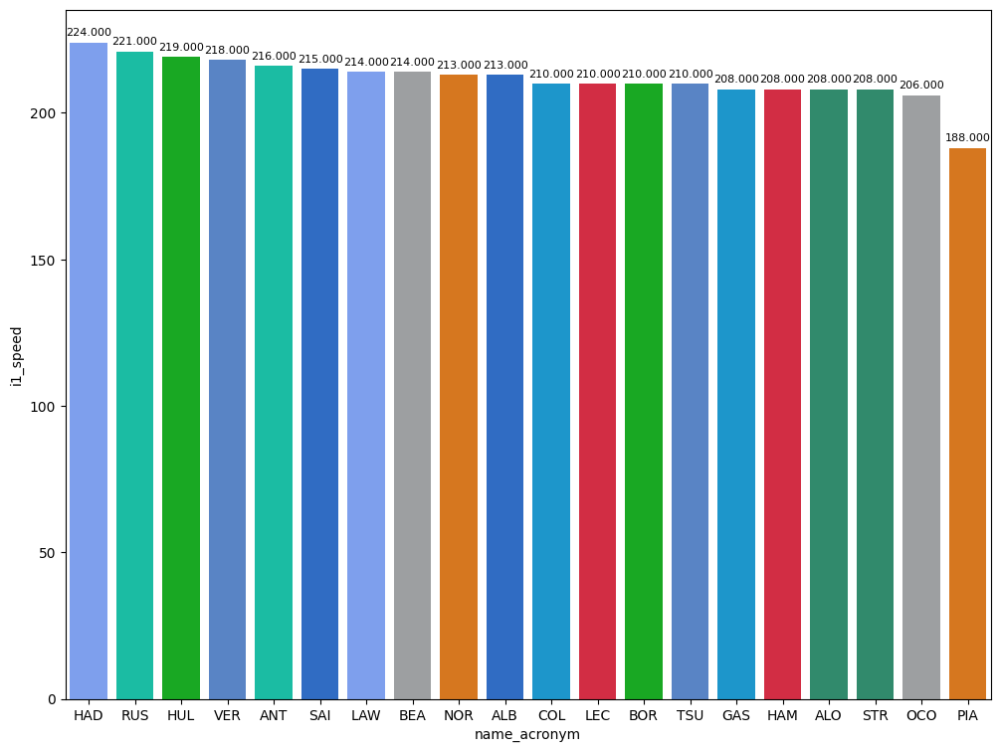

In [392]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax().dropna()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

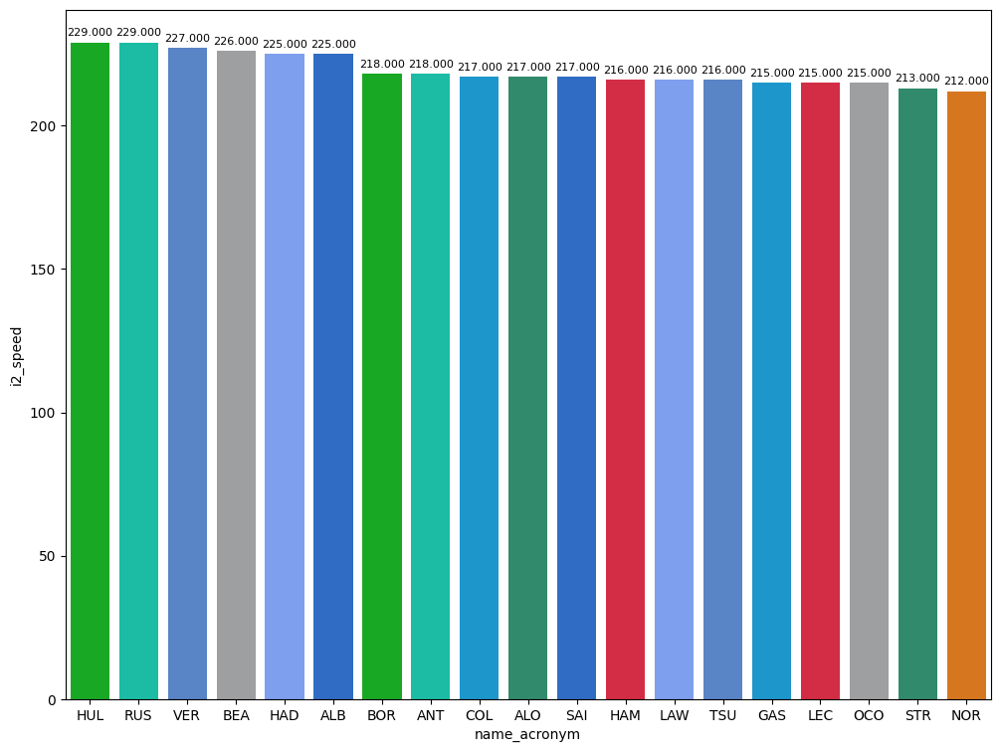

In [393]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax().dropna()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Mean pace with the different compound used on the session

In [394]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration >103 and lap_duration <=111").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
HARD,106.140332
MEDIUM,106.294907


### Race pace

In [395]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration >103 and lap_duration <=111").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
team_name,
Mercedes,105.485812
Red Bull Racing,105.648642
McLaren,105.677846
Ferrari,105.827354
Racing Bulls,105.879762
Williams,105.937400
Kick Sauber,106.575747
Haas F1 Team,106.790610
Aston Martin,106.869690


#### Mean race pace per sector
In this section, we can see the pace shown per each team in each sector sorted ascending.

#### Sector 1

In [396]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration >103 and lap_duration <=111").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

,duration_sector_1
team_name,
Mercedes,37.405600
Red Bull Racing,37.426679
Racing Bulls,37.507774
Williams,37.528800
Ferrari,37.547608
McLaren,37.588077
Kick Sauber,37.955759
Aston Martin,37.959357
Haas F1 Team,38.020598


#### Sector 2

In [397]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration >103 and lap_duration <=111").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

,duration_sector_2
team_name,
Red Bull Racing,42.639506
Mercedes,42.737671
Racing Bulls,42.766810
McLaren,42.888179
Williams,42.924437
Ferrari,42.962772
Kick Sauber,43.227205
Aston Martin,43.381524
Haas F1 Team,43.461780


#### Sector 3

In [398]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False and lap_duration >103 and lap_duration <=111").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

,duration_sector_3
team_name,
McLaren,25.201590
Haas F1 Team,25.308232
Ferrari,25.316975
Mercedes,25.342541
Kick Sauber,25.392783
Williams,25.484163
Alpine,25.489241
Aston Martin,25.528810
Red Bull Racing,25.582457


### Long runs

In [399]:
MINIMUN_SECONDS = 103
MAXIMUM_SECONDS = 111

#### Red Bull Racing

In [400]:
stintInformation.query('driver_number == 1 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
19,1269,9904,1,22,1,38,HARD,0
21,1269,9904,1,1,1,40,HARD,0
22,1269,9904,2,1,41,51,MEDIUM,4
29,1269,9904,2,22,39,51,MEDIUM,6


In [401]:
data = libraryDataF1.getinfolongruns(jointables,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
74,Max VERSTAPPEN,HARD,2025-09-21T11:14:38.398000+00:00,5,38.760,43.068,25.827,107.655
93,Max VERSTAPPEN,HARD,2025-09-21T11:16:26.194000+00:00,6,38.293,43.062,25.772,107.127
112,Max VERSTAPPEN,HARD,2025-09-21T11:18:13.071000+00:00,7,37.926,42.805,25.753,106.484
131,Max VERSTAPPEN,HARD,2025-09-21T11:19:59.632000+00:00,8,37.774,42.641,25.718,106.133
150,Max VERSTAPPEN,HARD,2025-09-21T11:21:45.958000+00:00,9,37.682,42.802,25.892,106.376
169,Max VERSTAPPEN,HARD,2025-09-21T11:23:32.144000+00:00,10,37.593,42.781,25.798,106.172
188,Max VERSTAPPEN,HARD,2025-09-21T11:25:18.330000+00:00,11,37.702,42.778,25.765,106.245
207,Max VERSTAPPEN,HARD,2025-09-21T11:27:04.585000+00:00,12,37.595,42.824,25.704,106.123
226,Max VERSTAPPEN,HARD,2025-09-21T11:28:50.685000+00:00,13,37.775,42.675,25.652,106.102
245,Max VERSTAPPEN,HARD,2025-09-21T11:30:36.799000+00:00,14,37.576,42.619,25.622,105.817


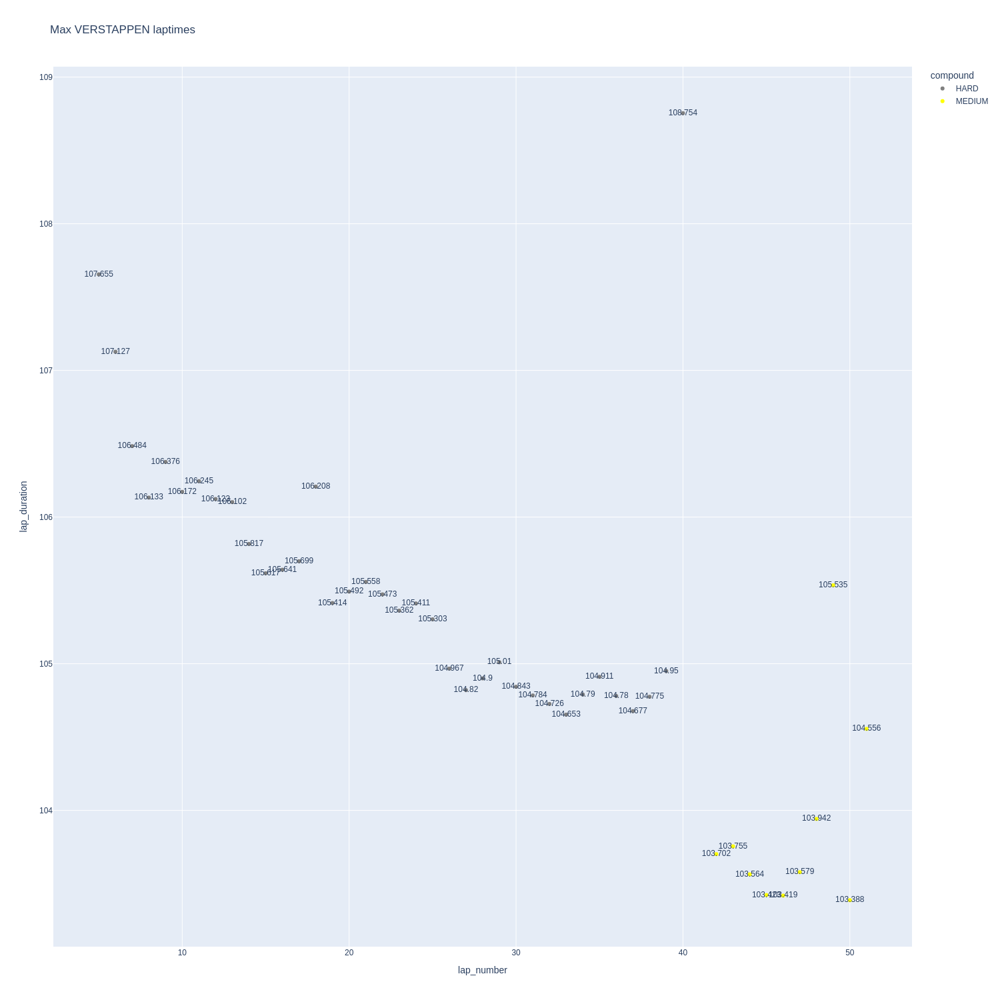

In [402]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

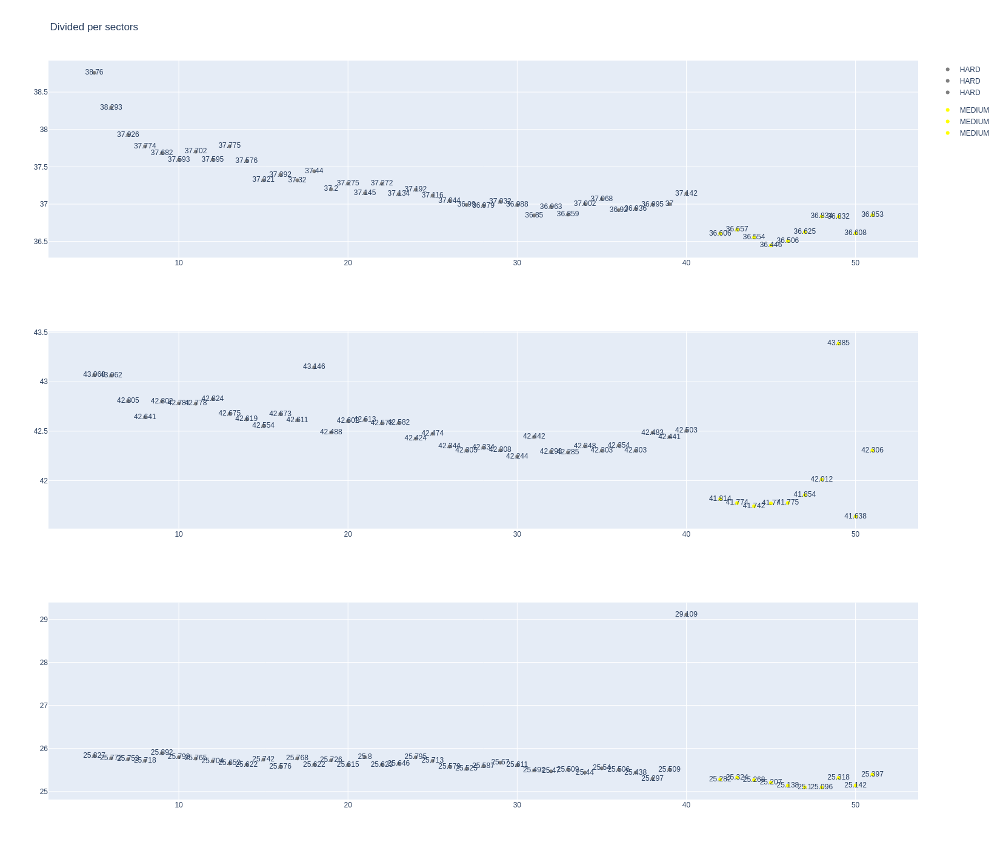

In [403]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [404]:
data = libraryDataF1.getinfolongruns(jointables,22,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
79,Yuki TSUNODA,HARD,2025-09-21T11:14:39.637000+00:00,5,40.851,43.939,25.553,110.343
97,Yuki TSUNODA,HARD,2025-09-21T11:16:29.806000+00:00,6,38.494,43.540,25.510,107.544
116,Yuki TSUNODA,HARD,2025-09-21T11:18:17.338000+00:00,7,38.965,43.130,25.493,107.588
135,Yuki TSUNODA,HARD,2025-09-21T11:20:04.910000+00:00,8,38.173,43.168,25.481,106.822
154,Yuki TSUNODA,HARD,2025-09-21T11:21:51.807000+00:00,9,38.337,43.305,25.424,107.066
173,Yuki TSUNODA,HARD,2025-09-21T11:23:38.824000+00:00,10,39.274,43.518,25.600,108.392
193,Yuki TSUNODA,HARD,2025-09-21T11:25:27.284000+00:00,11,38.006,43.142,25.520,106.668
212,Yuki TSUNODA,HARD,2025-09-21T11:27:13.885000+00:00,12,37.965,43.019,25.460,106.444
231,Yuki TSUNODA,HARD,2025-09-21T11:29:00.340000+00:00,13,37.729,43.305,25.483,106.517
250,Yuki TSUNODA,HARD,2025-09-21T11:30:46.899000+00:00,14,37.745,43.152,25.564,106.461


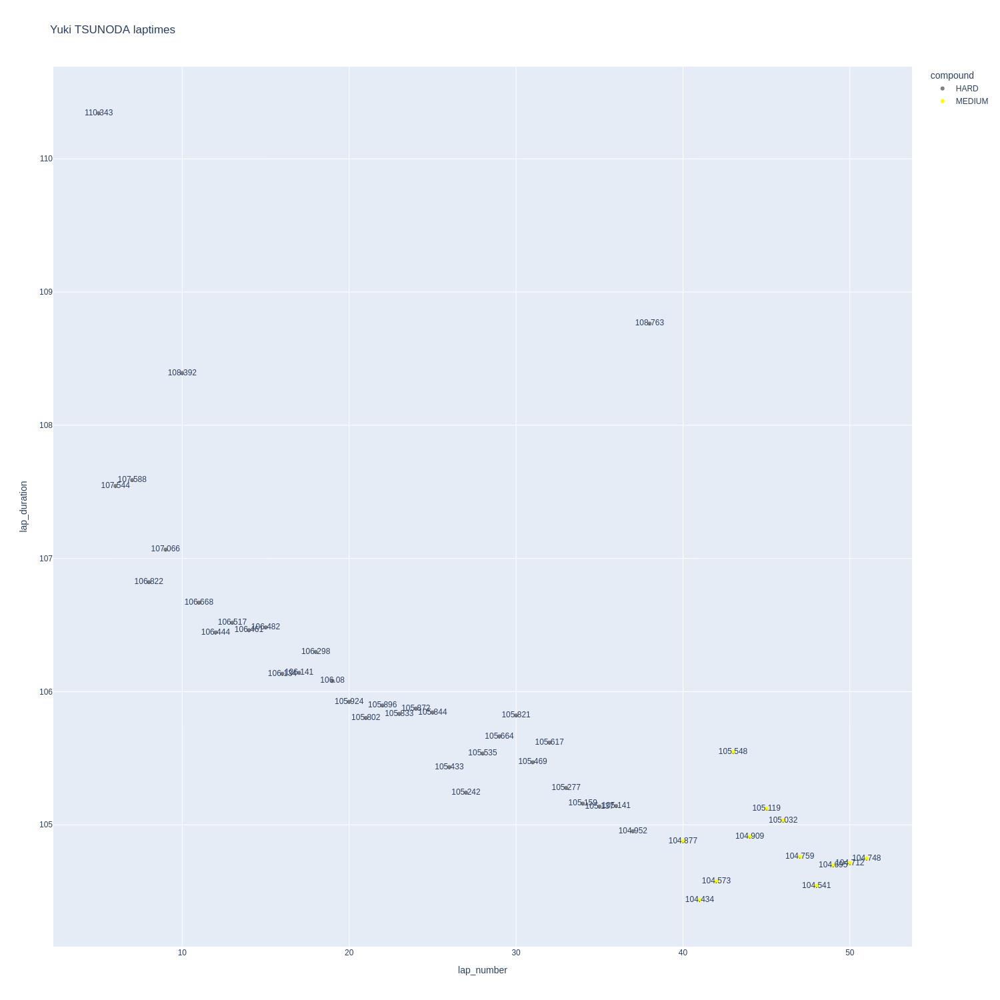

In [405]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

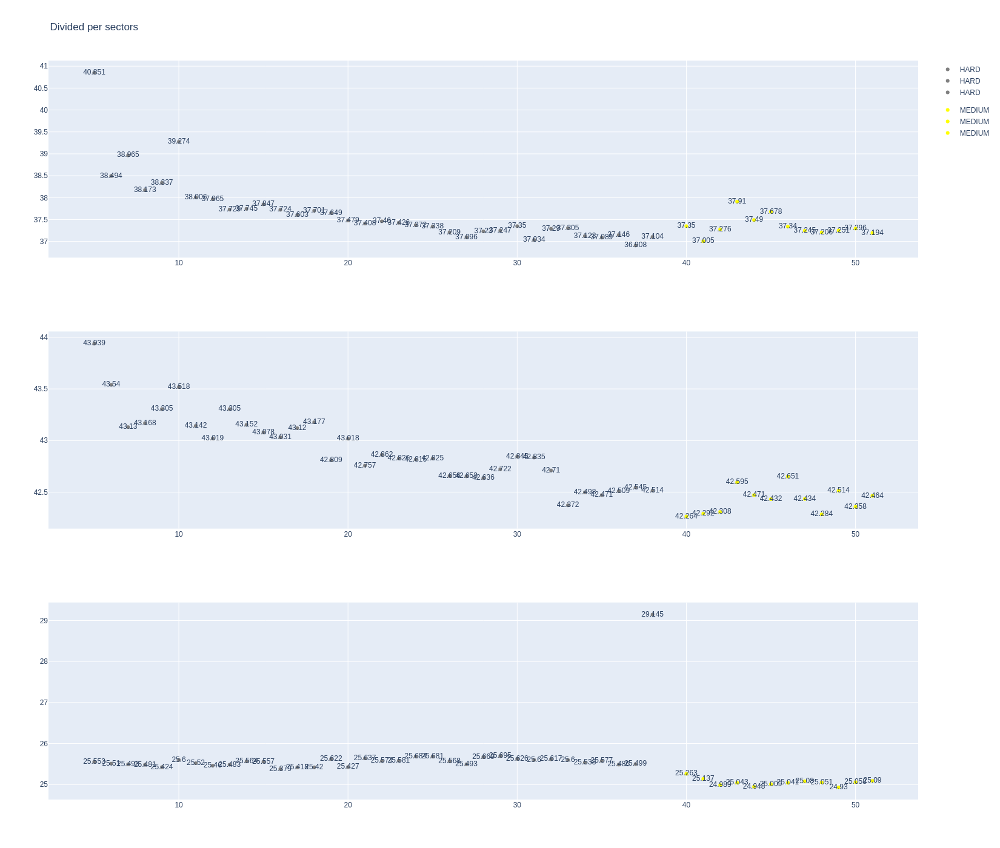

In [406]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [407]:
stintInformation.query('driver_number == 44 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
6,1269,9904,1,16,1,19,MEDIUM,3
15,1269,9904,1,44,1,36,HARD,0
31,1269,9904,2,44,37,51,MEDIUM,0
32,1269,9904,2,16,20,51,HARD,0


In [408]:
data = libraryDataF1.getinfolongruns(jointables,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
99,Charles LECLERC,MEDIUM,2025-09-21T11:16:31.879000+00:00,6,38.736,43.422,25.569,107.727
118,Charles LECLERC,MEDIUM,2025-09-21T11:18:19.677000+00:00,7,38.234,43.593,25.482,107.309
137,Charles LECLERC,MEDIUM,2025-09-21T11:20:06.904000+00:00,8,38.314,43.162,25.358,106.834
156,Charles LECLERC,MEDIUM,2025-09-21T11:21:53.825000+00:00,9,37.988,43.227,25.558,106.773
175,Charles LECLERC,MEDIUM,2025-09-21T11:23:40.525000+00:00,10,38.492,43.515,25.381,107.388
194,Charles LECLERC,MEDIUM,2025-09-21T11:25:27.892000+00:00,11,38.143,43.381,25.277,106.801
213,Charles LECLERC,MEDIUM,2025-09-21T11:27:14.753000+00:00,12,37.914,43.316,25.240,106.470
232,Charles LECLERC,MEDIUM,2025-09-21T11:29:01.157000+00:00,13,37.886,43.353,25.203,106.442
251,Charles LECLERC,MEDIUM,2025-09-21T11:30:47.710000+00:00,14,37.757,43.243,25.132,106.132
270,Charles LECLERC,MEDIUM,2025-09-21T11:32:33.800000+00:00,15,38.104,43.392,25.347,106.843


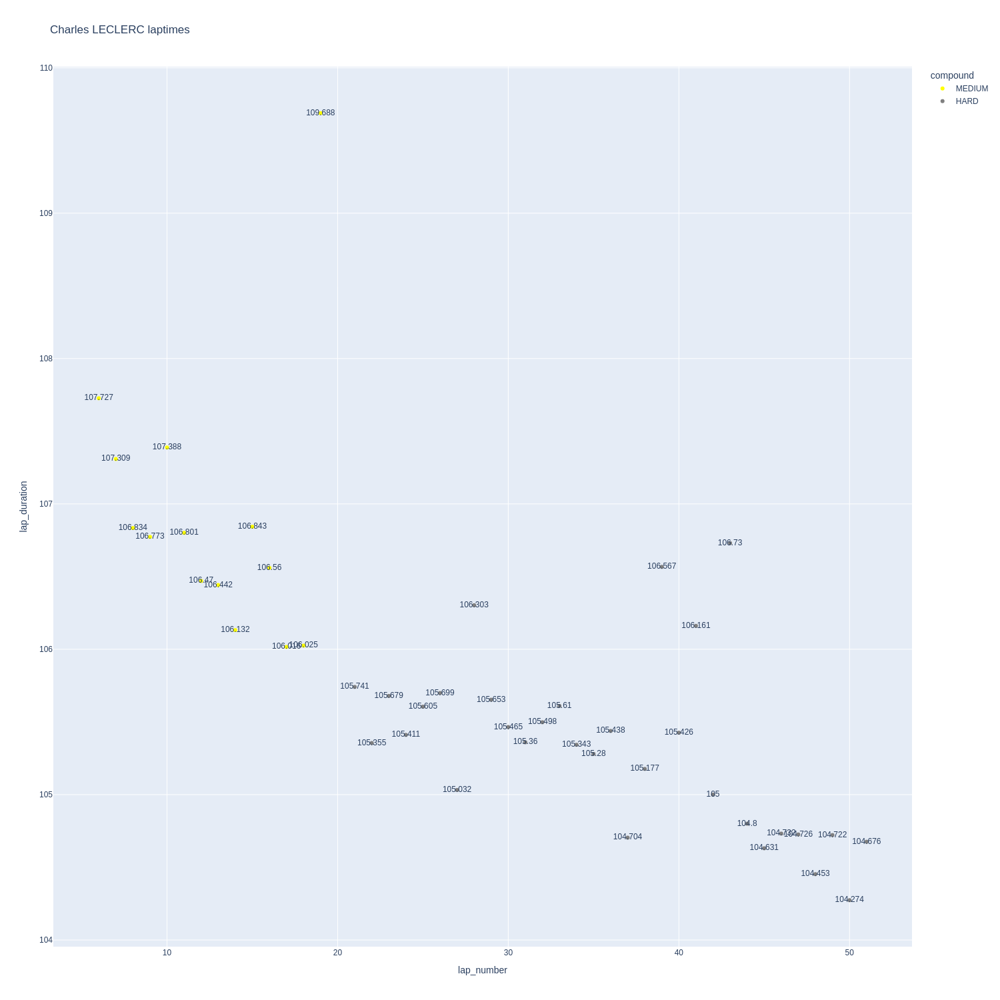

In [409]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

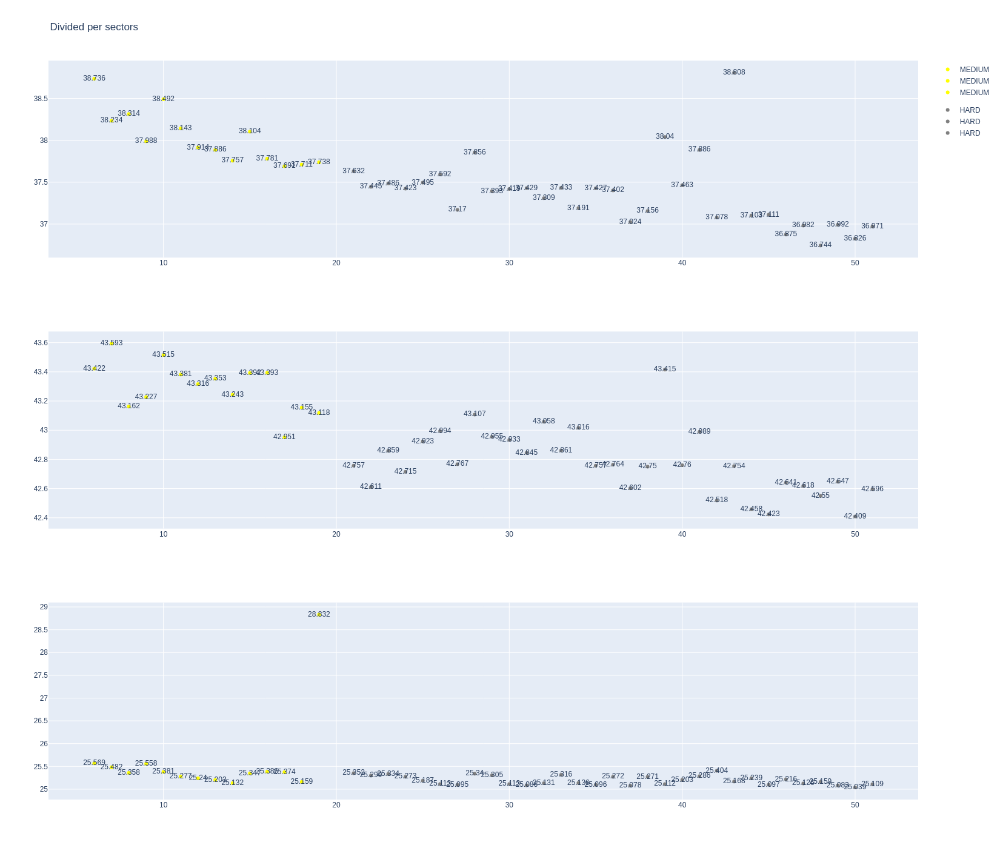

In [410]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [411]:
data = libraryDataF1.getinfolongruns(jointables,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
102,Lewis HAMILTON,HARD,2025-09-21T11:16:32.871000+00:00,6,39.902,43.909,25.032,108.843
121,Lewis HAMILTON,HARD,2025-09-21T11:18:21.293000+00:00,7,38.686,43.705,24.923,107.314
140,Lewis HAMILTON,HARD,2025-09-21T11:20:08.833000+00:00,8,38.242,43.416,25.265,106.923
158,Lewis HAMILTON,HARD,2025-09-21T11:21:55.575000+00:00,9,37.952,43.565,25.249,106.766
177,Lewis HAMILTON,HARD,2025-09-21T11:23:42.383000+00:00,10,37.904,43.568,25.343,106.815
196,Lewis HAMILTON,HARD,2025-09-21T11:25:29.098000+00:00,11,38.221,43.717,25.163,107.101
215,Lewis HAMILTON,HARD,2025-09-21T11:27:16.269000+00:00,12,38.068,43.428,25.132,106.628
234,Lewis HAMILTON,HARD,2025-09-21T11:29:02.859000+00:00,13,38.116,43.593,25.311,107.020
253,Lewis HAMILTON,HARD,2025-09-21T11:30:49.894000+00:00,14,37.700,43.436,25.466,106.602
272,Lewis HAMILTON,HARD,2025-09-21T11:32:36.499000+00:00,15,37.556,44.936,25.388,107.880


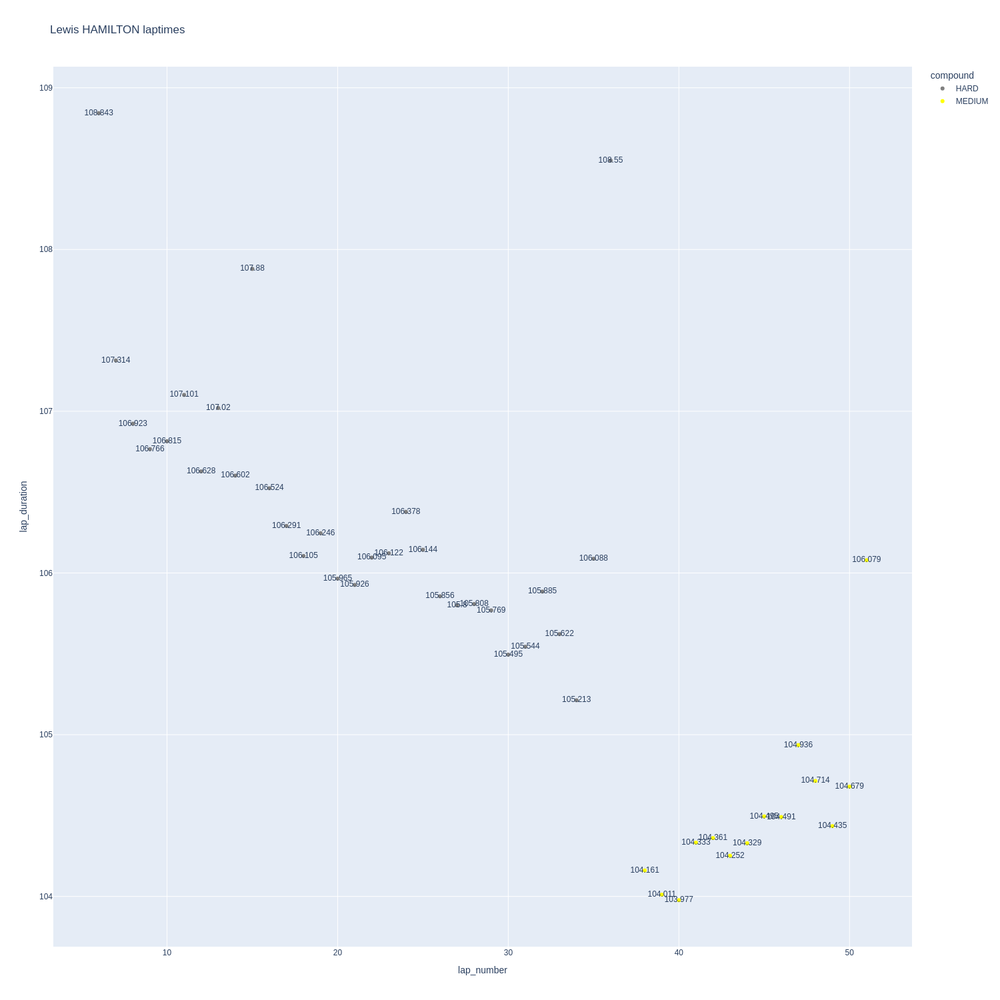

In [412]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

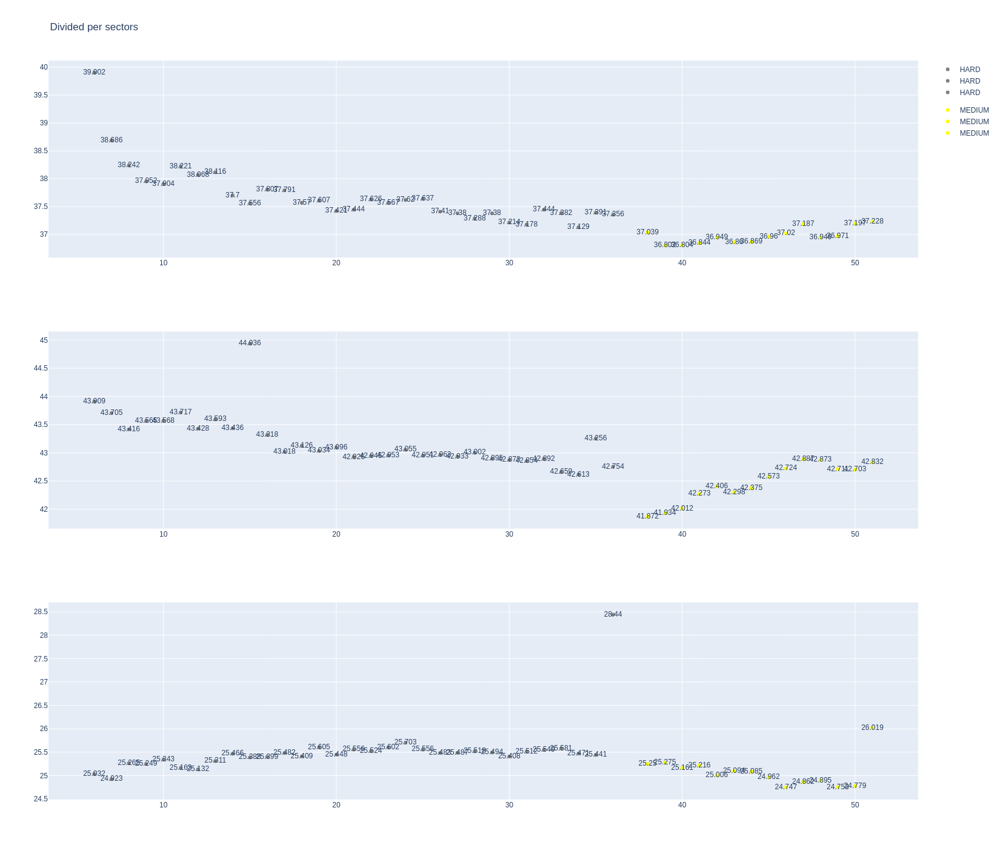

In [413]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [414]:
stintInformation.query('driver_number == 12 or driver_number == 63')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
5,1269,9904,1,12,1,18,MEDIUM,5
20,1269,9904,1,63,1,39,HARD,0
25,1269,9904,2,63,40,51,MEDIUM,6
27,1269,9904,2,12,19,51,HARD,0


In [415]:
data = libraryDataF1.getinfolongruns(jointables,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
77,Kimi ANTONELLI,MEDIUM,2025-09-21T11:14:39.395000+00:00,5,40.389,43.766,25.511,109.666
96,Kimi ANTONELLI,MEDIUM,2025-09-21T11:16:29.123000+00:00,6,38.296,43.428,25.314,107.038
115,Kimi ANTONELLI,MEDIUM,2025-09-21T11:18:16.021000+00:00,7,37.987,43.408,25.273,106.668
134,Kimi ANTONELLI,MEDIUM,2025-09-21T11:20:02.749000+00:00,8,38.529,43.299,25.372,107.200
153,Kimi ANTONELLI,MEDIUM,2025-09-21T11:21:49.970000+00:00,9,37.965,43.379,25.541,106.885
172,Kimi ANTONELLI,MEDIUM,2025-09-21T11:23:36.847000+00:00,10,37.892,43.367,25.631,106.890
191,Kimi ANTONELLI,MEDIUM,2025-09-21T11:25:23.685000+00:00,11,37.865,43.359,25.351,106.575
210,Kimi ANTONELLI,MEDIUM,2025-09-21T11:27:10.291000+00:00,12,38.081,43.461,25.374,106.916
229,Kimi ANTONELLI,MEDIUM,2025-09-21T11:28:57.250000+00:00,13,37.822,43.350,25.397,106.569
248,Kimi ANTONELLI,MEDIUM,2025-09-21T11:30:43.726000+00:00,14,37.677,43.370,25.237,106.284


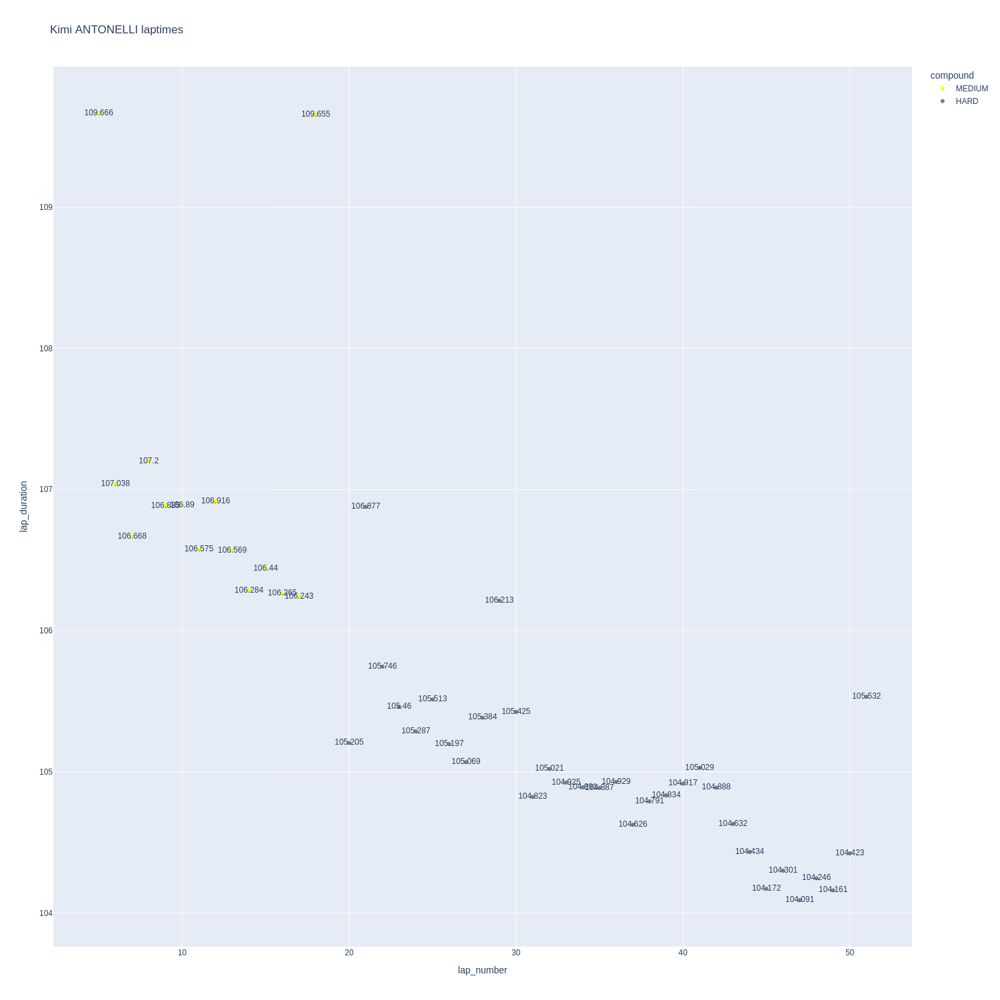

In [416]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

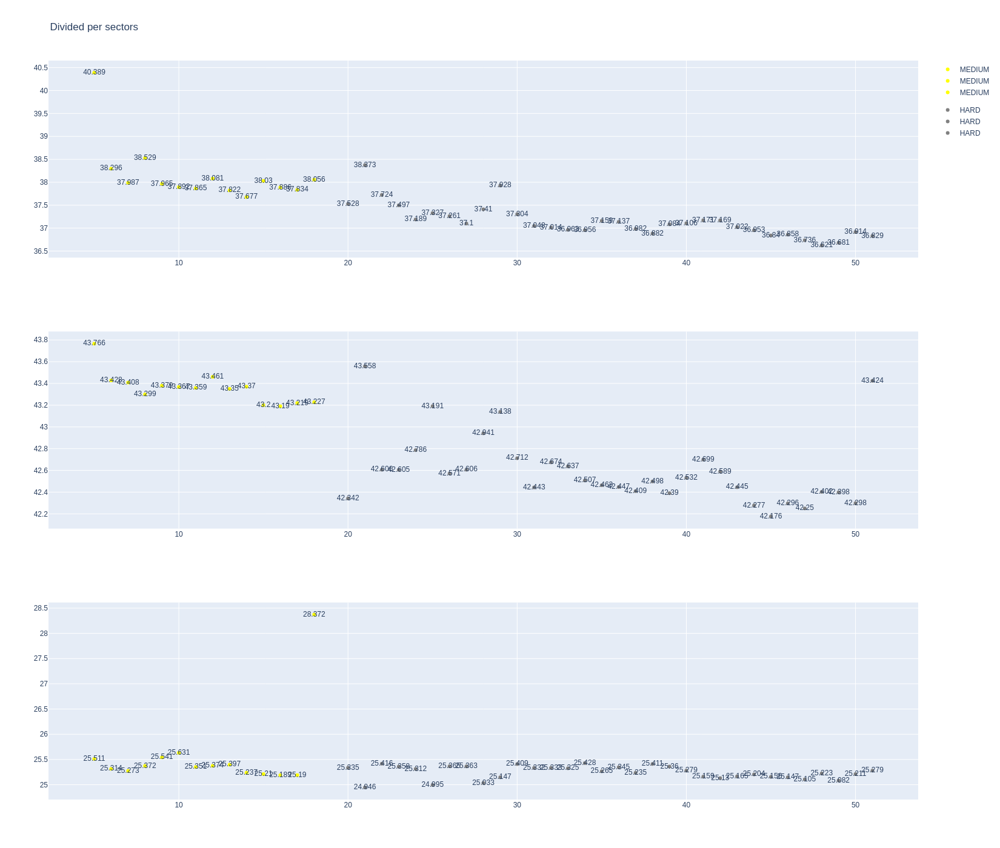

In [417]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [418]:
data = libraryDataF1.getinfolongruns(jointables,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
98,George RUSSELL,HARD,2025-09-21T11:16:30.603000+00:00,6,38.691,43.473,25.010,107.174
117,George RUSSELL,HARD,2025-09-21T11:18:17.643000+00:00,7,39.138,43.484,25.223,107.845
136,George RUSSELL,HARD,2025-09-21T11:20:05.495000+00:00,8,38.399,43.087,25.058,106.544
155,George RUSSELL,HARD,2025-09-21T11:21:51.976000+00:00,9,38.876,43.231,25.001,107.108
174,George RUSSELL,HARD,2025-09-21T11:23:39.041000+00:00,10,38.200,43.021,25.674,106.895
192,George RUSSELL,HARD,2025-09-21T11:25:25.940000+00:00,11,37.829,43.038,25.410,106.277
211,George RUSSELL,HARD,2025-09-21T11:27:12.250000+00:00,12,37.783,43.051,25.274,106.108
230,George RUSSELL,HARD,2025-09-21T11:28:58.221000+00:00,13,37.736,43.195,25.074,106.005
249,George RUSSELL,HARD,2025-09-21T11:30:44.454000+00:00,14,37.792,43.438,25.106,106.336
268,George RUSSELL,HARD,2025-09-21T11:32:30.711000+00:00,15,37.909,43.258,24.989,106.156


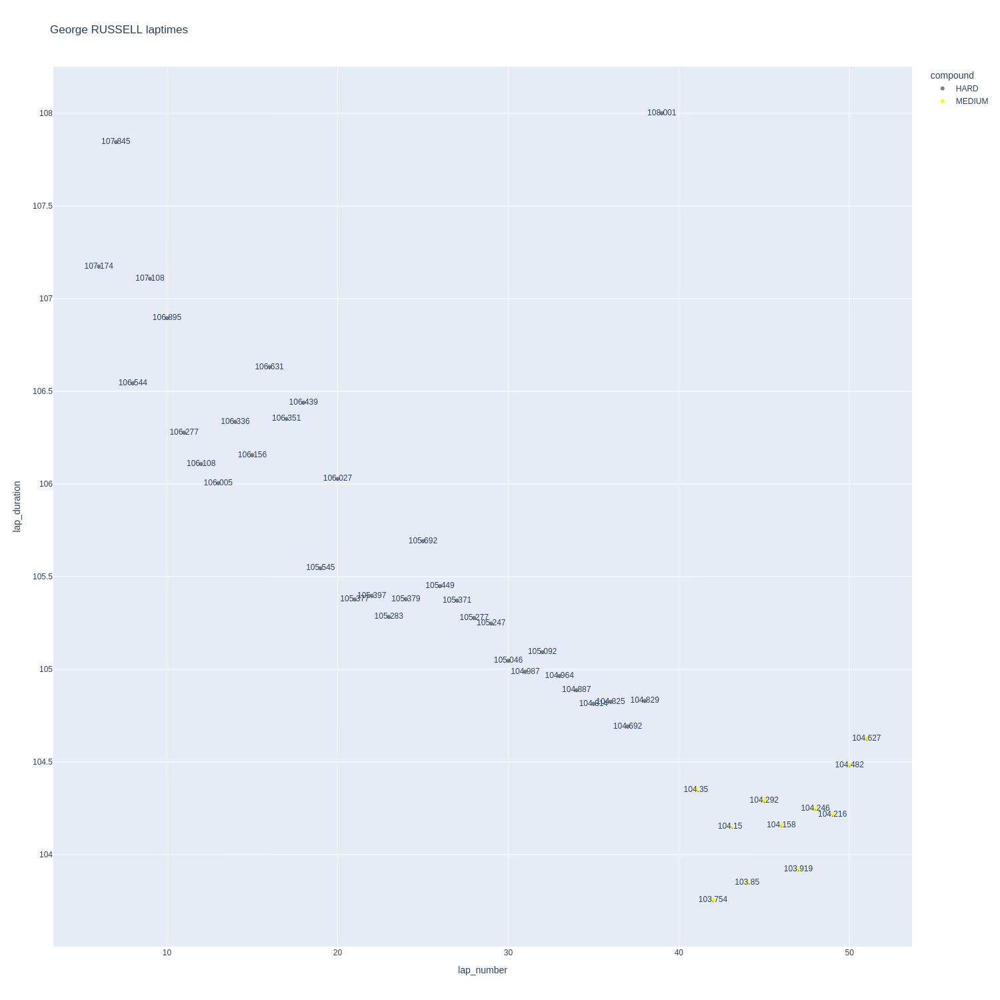

In [419]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

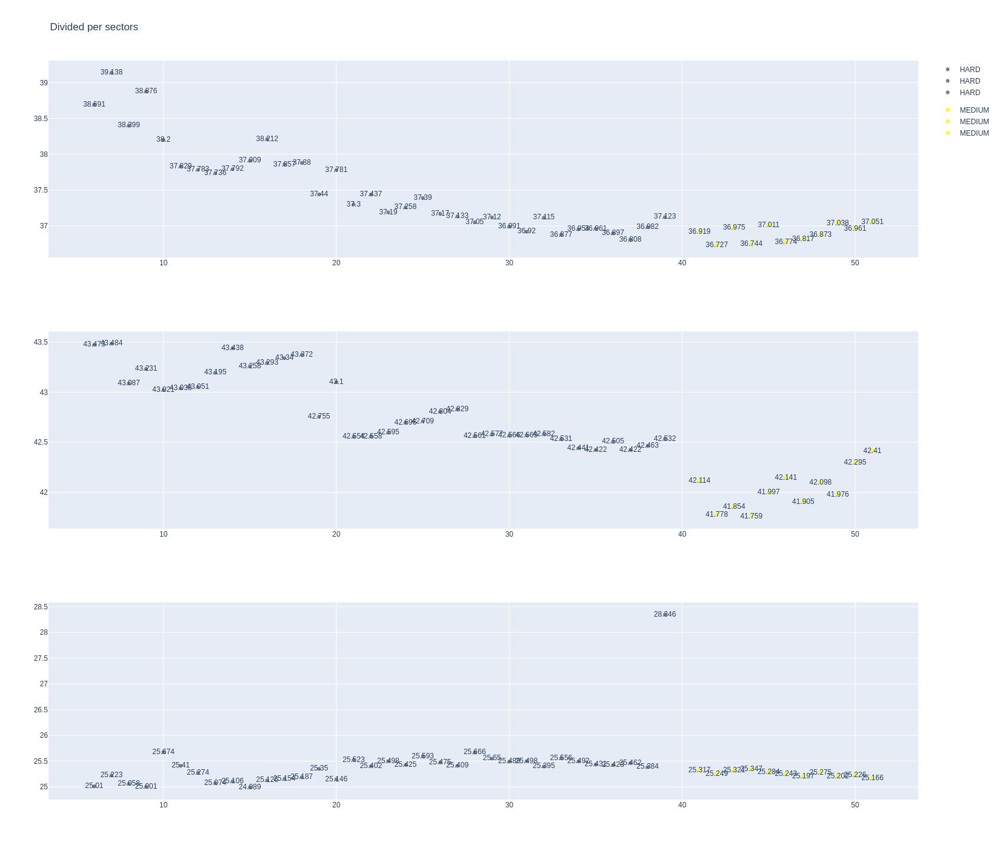

In [420]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [421]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
9,1269,9904,1,81,1,1,MEDIUM,0
17,1269,9904,1,4,1,37,MEDIUM,0
30,1269,9904,2,4,38,51,HARD,0


In [422]:
data = libraryDataF1.getinfolongruns(jointables,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
100,Lando NORRIS,MEDIUM,2025-09-21T11:16:32.198000+00:00,6,38.976,43.659,25.238,107.873
119,Lando NORRIS,MEDIUM,2025-09-21T11:18:20.087000+00:00,7,38.576,43.467,24.980,107.023
138,Lando NORRIS,MEDIUM,2025-09-21T11:20:07.248000+00:00,8,39.017,43.195,25.032,107.244
157,Lando NORRIS,MEDIUM,2025-09-21T11:21:54.388000+00:00,9,38.125,43.435,25.156,106.716
176,Lando NORRIS,MEDIUM,2025-09-21T11:23:41.185000+00:00,10,38.451,43.767,25.164,107.382
195,Lando NORRIS,MEDIUM,2025-09-21T11:25:28.736000+00:00,11,38.201,43.529,25.257,106.987
214,Lando NORRIS,MEDIUM,2025-09-21T11:27:15.408000+00:00,12,38.033,43.404,25.341,106.778
233,Lando NORRIS,MEDIUM,2025-09-21T11:29:02.298000+00:00,13,37.858,43.262,25.156,106.276
252,Lando NORRIS,MEDIUM,2025-09-21T11:30:48.558000+00:00,14,37.786,43.262,25.222,106.270
271,Lando NORRIS,MEDIUM,2025-09-21T11:32:34.808000+00:00,15,37.775,43.519,25.189,106.483


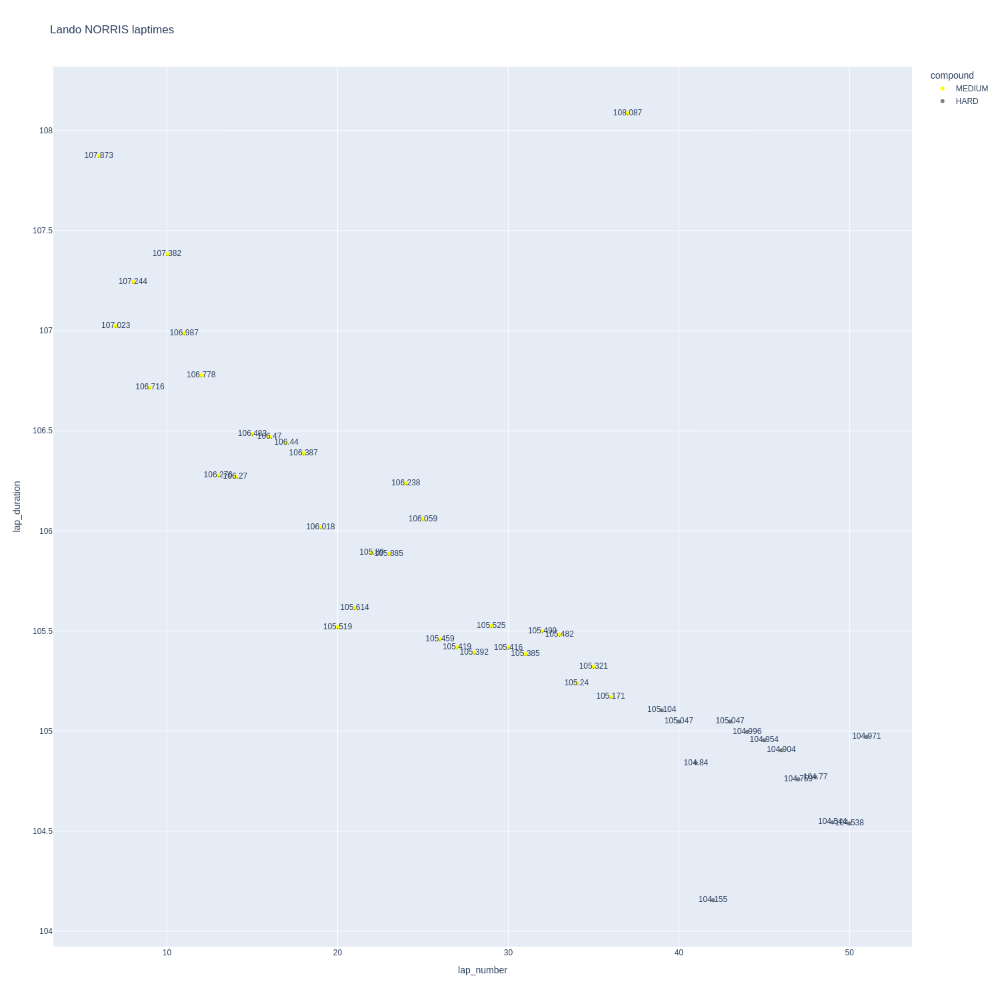

In [423]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

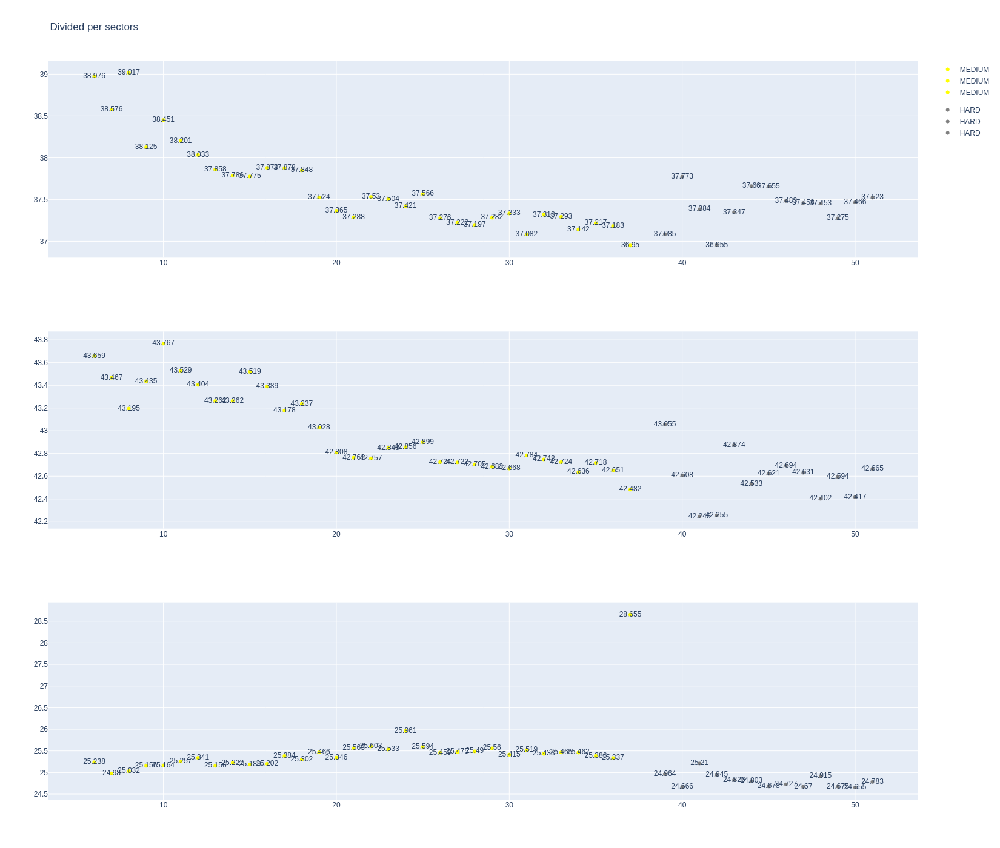

In [424]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [425]:
data = libraryDataF1.getinfolongruns(jointables,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [426]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [427]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [428]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
8,1269,9904,1,14,1,21,MEDIUM,3
18,1269,9904,1,18,1,37,MEDIUM,3
38,1269,9904,2,14,22,51,HARD,0
40,1269,9904,2,18,38,51,HARD,0


In [429]:
data = libraryDataF1.getinfolongruns(jointables,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
103,Fernando ALONSO,MEDIUM,2025-09-21T11:16:33.568000+00:00,6,39.626,44.626,25.538,109.790
122,Fernando ALONSO,MEDIUM,2025-09-21T11:18:23.295000+00:00,7,38.862,44.018,25.821,108.701
142,Fernando ALONSO,MEDIUM,2025-09-21T11:20:11.973000+00:00,8,38.889,43.847,25.262,107.998
161,Fernando ALONSO,MEDIUM,2025-09-21T11:22:00.039000+00:00,9,38.509,43.703,25.274,107.486
180,Fernando ALONSO,MEDIUM,2025-09-21T11:23:47.443000+00:00,10,38.008,43.538,25.509,107.055
199,Fernando ALONSO,MEDIUM,2025-09-21T11:25:34.500000+00:00,11,37.966,43.404,25.251,106.621
218,Fernando ALONSO,MEDIUM,2025-09-21T11:27:21.137000+00:00,12,38.445,43.574,25.245,107.264
237,Fernando ALONSO,MEDIUM,2025-09-21T11:29:08.359000+00:00,13,38.094,43.711,25.367,107.172
256,Fernando ALONSO,MEDIUM,2025-09-21T11:30:55.593000+00:00,14,38.108,43.571,25.356,107.035
275,Fernando ALONSO,MEDIUM,2025-09-21T11:32:42.541000+00:00,15,37.820,43.783,25.482,107.085


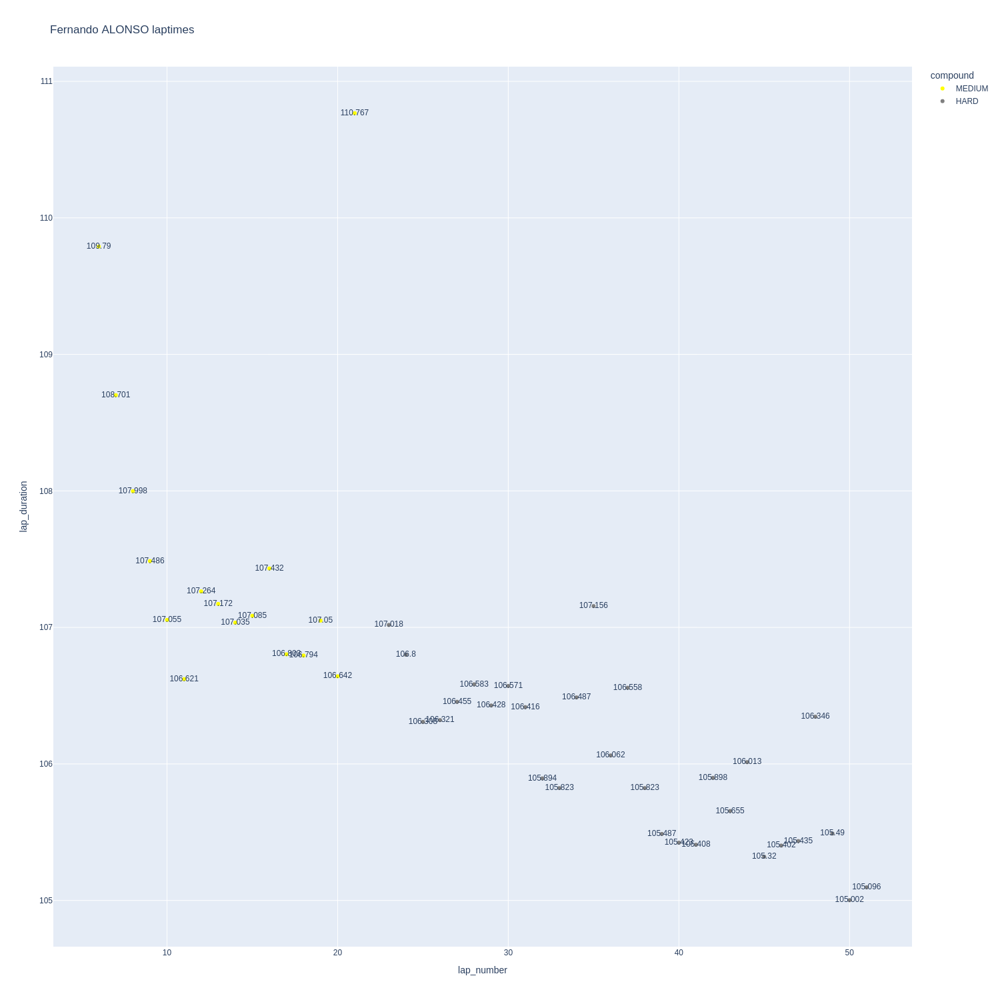

In [430]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

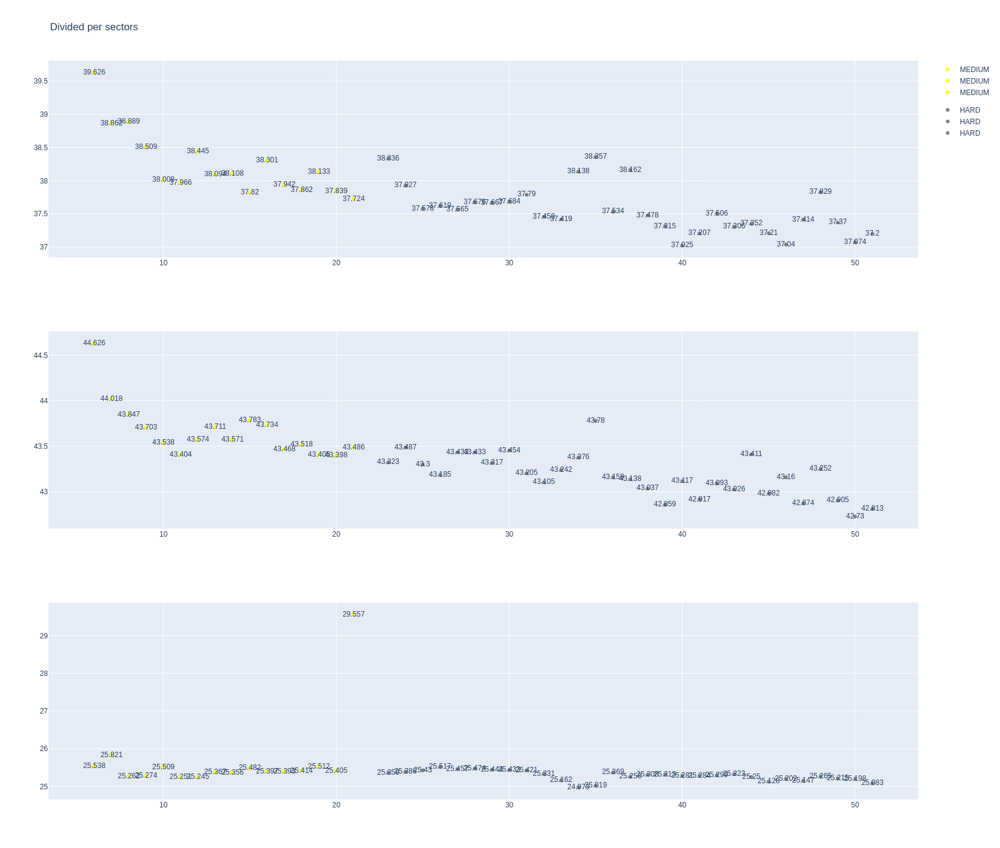

In [431]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [432]:
data = libraryDataF1.getinfolongruns(jointables,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
106,Lance STROLL,MEDIUM,2025-09-21T11:16:35.313000+00:00,6,39.803,44.661,25.405,109.869
125,Lance STROLL,MEDIUM,2025-09-21T11:18:25.121000+00:00,7,39.145,44.381,25.224,108.750
144,Lance STROLL,MEDIUM,2025-09-21T11:20:13.914000+00:00,8,38.847,44.014,25.303,108.164
163,Lance STROLL,MEDIUM,2025-09-21T11:22:02.016000+00:00,9,38.418,43.896,25.306,107.620
182,Lance STROLL,MEDIUM,2025-09-21T11:23:49.624000+00:00,10,38.399,43.913,25.565,107.877
201,Lance STROLL,MEDIUM,2025-09-21T11:25:37.531000+00:00,11,38.451,43.878,25.250,107.579
220,Lance STROLL,MEDIUM,2025-09-21T11:27:25.094000+00:00,12,38.667,44.034,25.230,107.931
239,Lance STROLL,MEDIUM,2025-09-21T11:29:13.087000+00:00,13,38.547,44.048,25.346,107.941
258,Lance STROLL,MEDIUM,2025-09-21T11:31:01.005000+00:00,14,38.446,43.913,25.136,107.495
277,Lance STROLL,MEDIUM,2025-09-21T11:32:48.520000+00:00,15,39.001,44.238,25.348,108.587


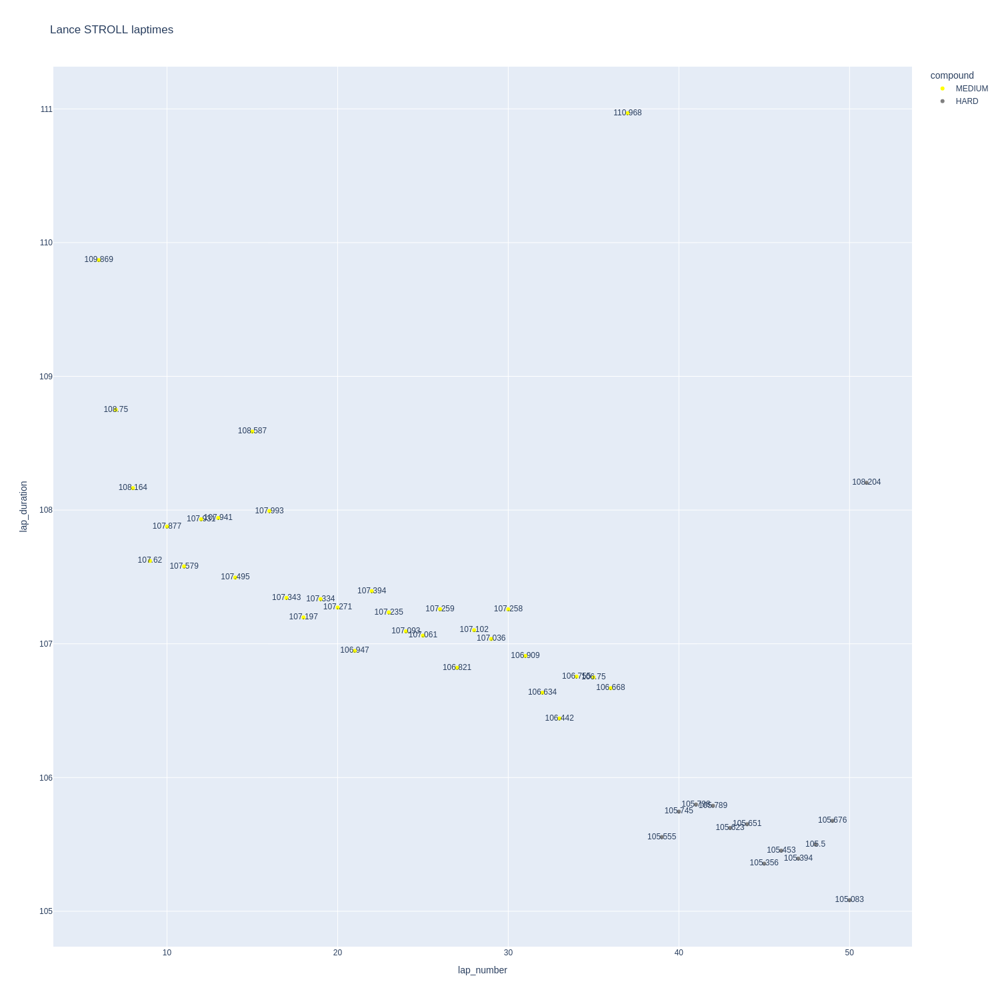

In [433]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

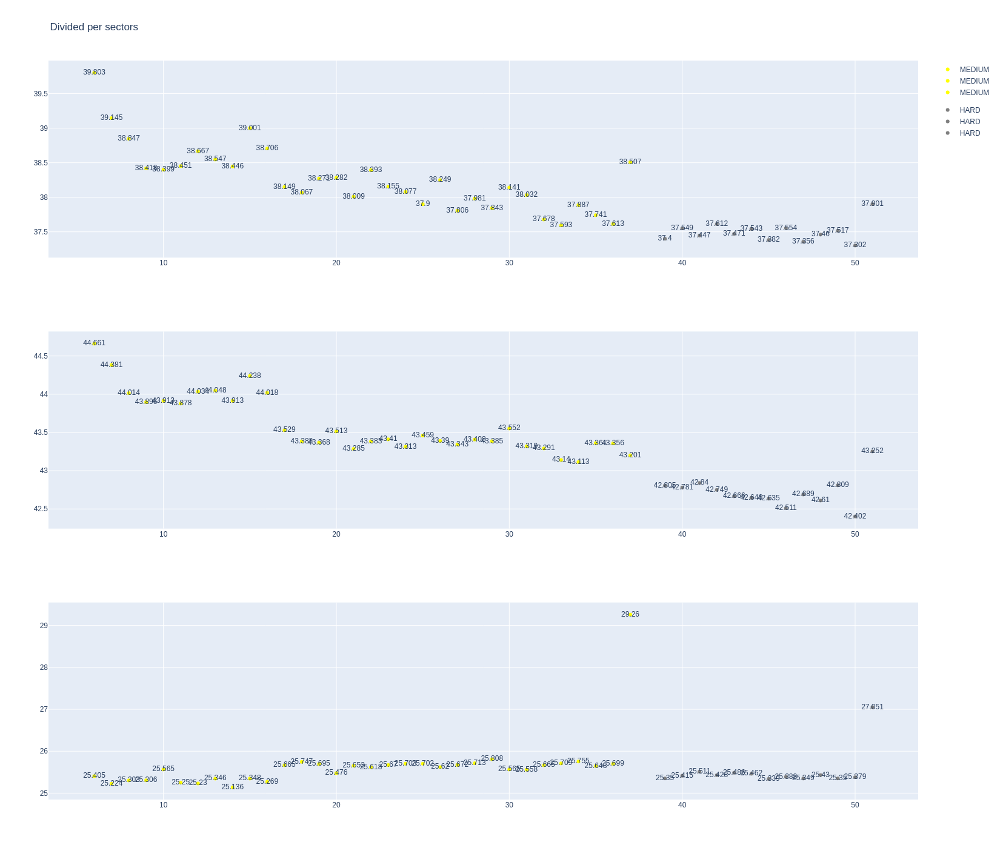

In [434]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [435]:
stintInformation.query('driver_number == 6 or driver_number == 30')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1269,9904,1,30,1,20,MEDIUM,6
13,1269,9904,1,6,1,29,MEDIUM,4
28,1269,9904,2,30,21,51,HARD,1
33,1269,9904,2,6,30,51,HARD,1


In [436]:
data = libraryDataF1.getinfolongruns(jointables,30,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
76,Liam LAWSON,MEDIUM,2025-09-21T11:14:39.055000+00:00,5,39.993,43.512,25.491,108.996
95,Liam LAWSON,MEDIUM,2025-09-21T11:16:28.179000+00:00,6,38.516,43.372,25.197,107.085
114,Liam LAWSON,MEDIUM,2025-09-21T11:18:14.983000+00:00,7,38.249,43.223,25.620,107.092
133,Liam LAWSON,MEDIUM,2025-09-21T11:20:02.231000+00:00,8,38.311,43.137,25.503,106.951
152,Liam LAWSON,MEDIUM,2025-09-21T11:21:49.117000+00:00,9,38.032,43.101,25.551,106.684
171,Liam LAWSON,MEDIUM,2025-09-21T11:23:35.864000+00:00,10,38.151,43.102,25.735,106.988
190,Liam LAWSON,MEDIUM,2025-09-21T11:25:22.787000+00:00,11,37.855,43.357,25.712,106.924
209,Liam LAWSON,MEDIUM,2025-09-21T11:27:09.767000+00:00,12,37.929,43.153,25.606,106.688
228,Liam LAWSON,MEDIUM,2025-09-21T11:28:56.338000+00:00,13,37.857,43.111,25.551,106.519
247,Liam LAWSON,MEDIUM,2025-09-21T11:30:42.876000+00:00,14,37.849,43.217,25.675,106.741


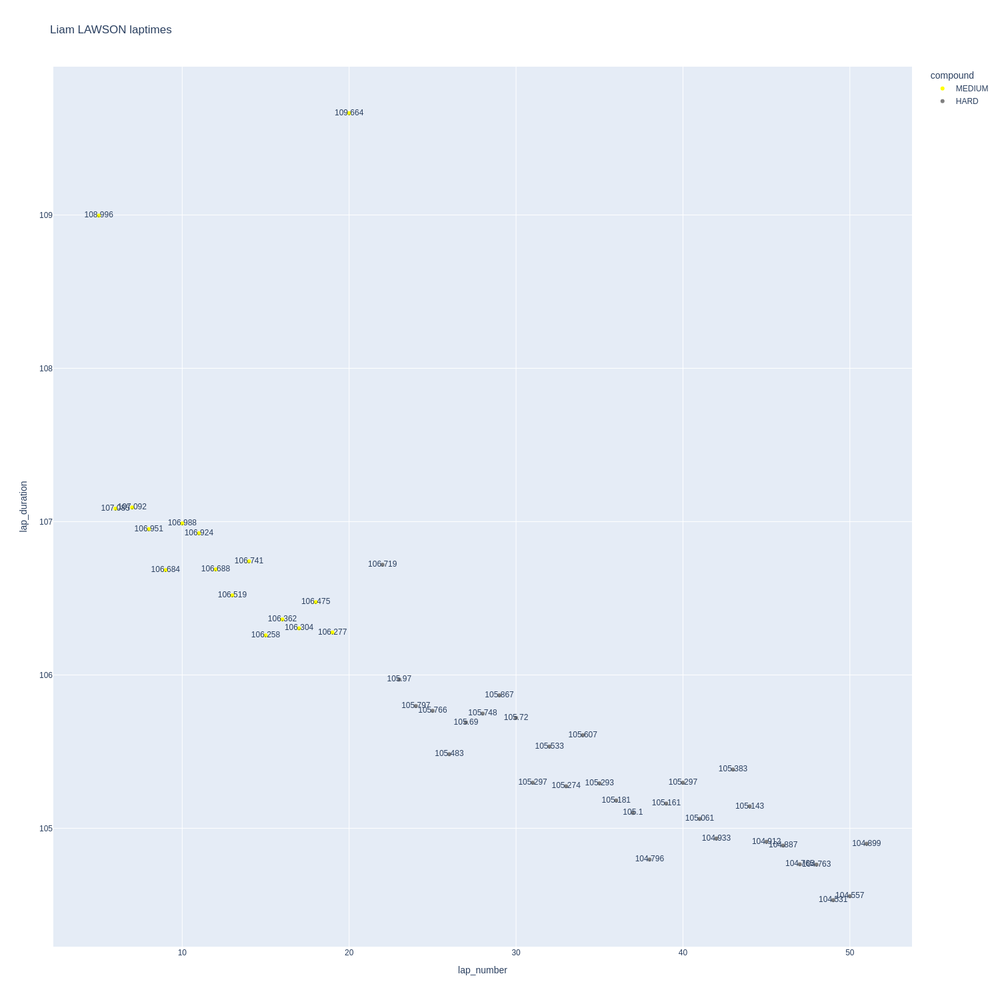

In [437]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

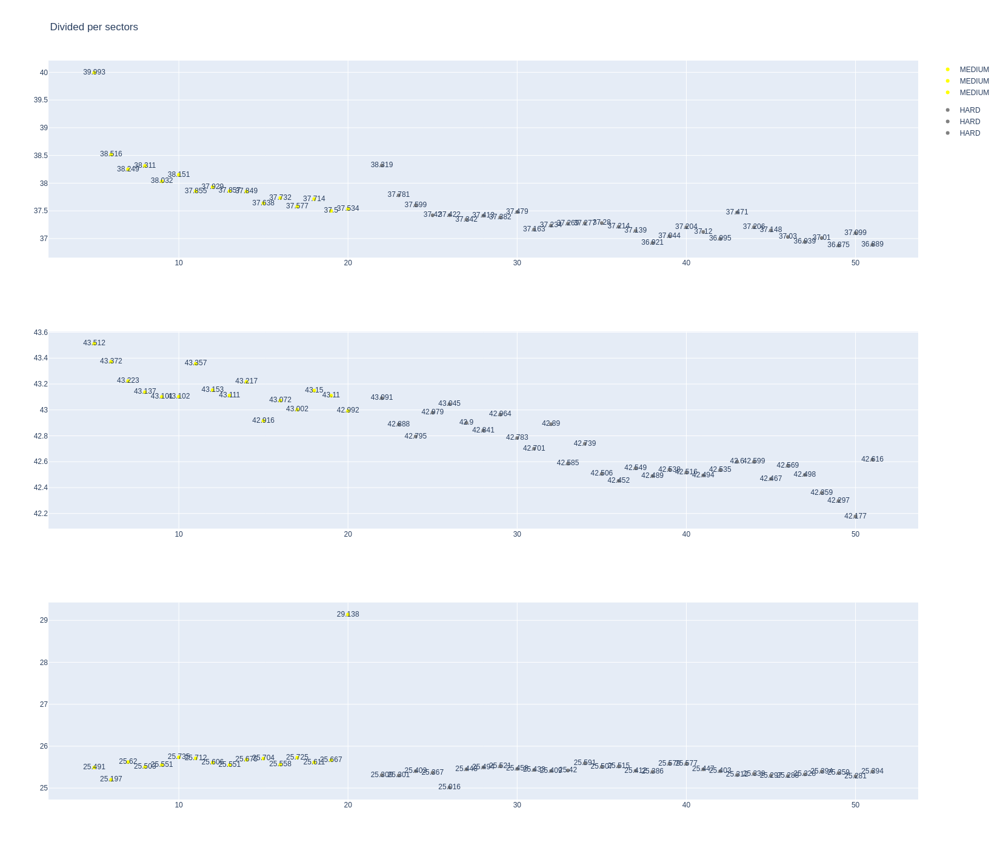

In [438]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [439]:
data = libraryDataF1.getinfolongruns(jointables,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
101,Isack HADJAR,MEDIUM,2025-09-21T11:16:32.445000+00:00,6,39.536,43.822,25.483,108.841
120,Isack HADJAR,MEDIUM,2025-09-21T11:18:21.216000+00:00,7,38.166,43.793,25.459,107.418
139,Isack HADJAR,MEDIUM,2025-09-21T11:20:08.799000+00:00,8,39.229,43.611,25.495,108.335
159,Isack HADJAR,MEDIUM,2025-09-21T11:21:56.905000+00:00,9,38.368,43.541,25.575,107.484
178,Isack HADJAR,MEDIUM,2025-09-21T11:23:44.354000+00:00,10,37.913,43.335,25.700,106.948
197,Isack HADJAR,MEDIUM,2025-09-21T11:25:31.313000+00:00,11,37.773,43.438,25.612,106.823
216,Isack HADJAR,MEDIUM,2025-09-21T11:27:18.199000+00:00,12,38.367,43.246,25.599,107.212
235,Isack HADJAR,MEDIUM,2025-09-21T11:29:05.455000+00:00,13,38.124,43.334,25.611,107.069
254,Isack HADJAR,MEDIUM,2025-09-21T11:30:52.381000+00:00,14,38.182,43.309,25.682,107.173
273,Isack HADJAR,MEDIUM,2025-09-21T11:32:39.587000+00:00,15,37.793,43.413,25.675,106.881


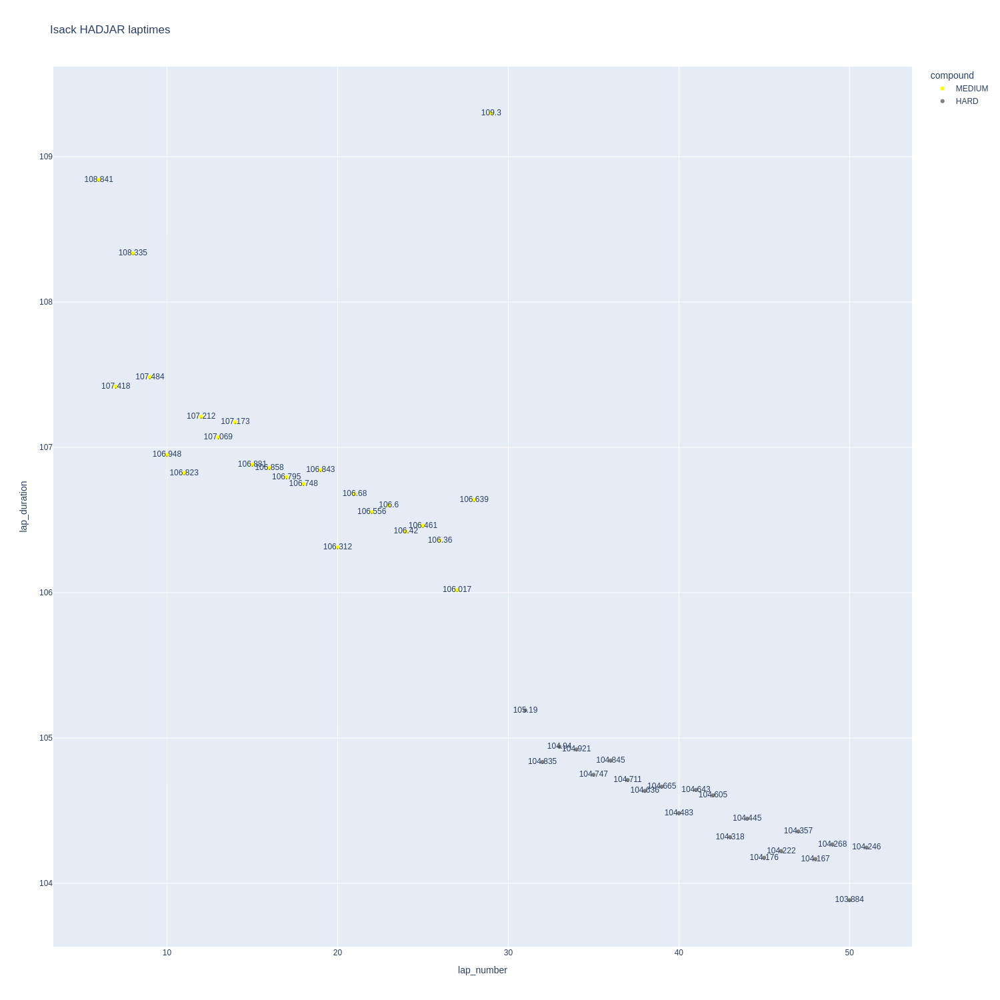

In [440]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

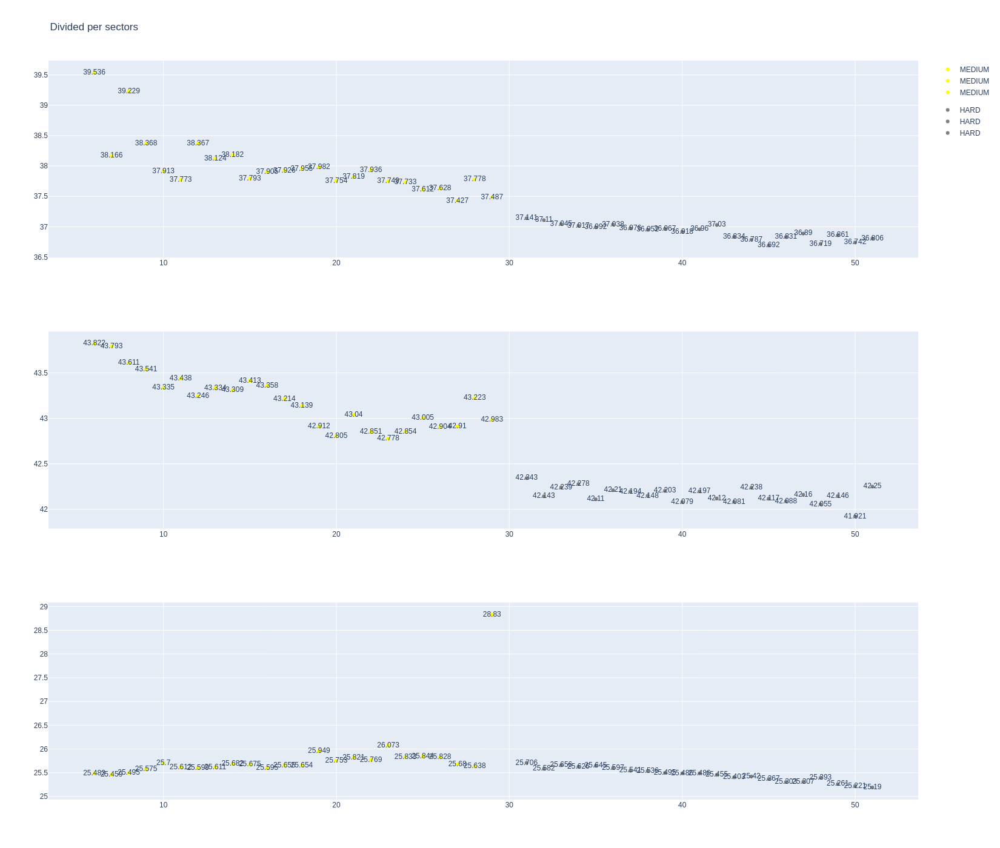

In [441]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [442]:
stintInformation.query('driver_number == 31 or driver_number == 87')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1269,9904,1,31,1,1,HARD,0
2,1269,9904,2,31,2,2,MEDIUM,0
12,1269,9904,1,87,1,28,HARD,0
36,1269,9904,2,87,29,51,MEDIUM,0
37,1269,9904,3,31,3,51,HARD,1


In [443]:
data = libraryDataF1.getinfolongruns(jointables,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
111,Esteban OCON,HARD,2025-09-21T11:16:38.193000+00:00,6,39.829,44.861,25.444,110.134
130,Esteban OCON,HARD,2025-09-21T11:18:28.227000+00:00,7,38.766,44.719,25.331,108.816
149,Esteban OCON,HARD,2025-09-21T11:20:17.014000+00:00,8,38.594,44.579,25.186,108.359
168,Esteban OCON,HARD,2025-09-21T11:22:05.505000+00:00,9,38.413,44.246,25.202,107.861
187,Esteban OCON,HARD,2025-09-21T11:23:53.334000+00:00,10,38.341,44.123,25.097,107.561
206,Esteban OCON,HARD,2025-09-21T11:25:40.949000+00:00,11,38.492,44.238,25.142,107.872
225,Esteban OCON,HARD,2025-09-21T11:27:28.725000+00:00,12,38.540,44.231,25.196,107.967
244,Esteban OCON,HARD,2025-09-21T11:29:16.710000+00:00,13,38.611,44.328,25.131,108.070
263,Esteban OCON,HARD,2025-09-21T11:31:04.668000+00:00,14,38.443,44.115,25.145,107.703
282,Esteban OCON,HARD,2025-09-21T11:32:52.487000+00:00,15,38.691,44.369,25.043,108.103


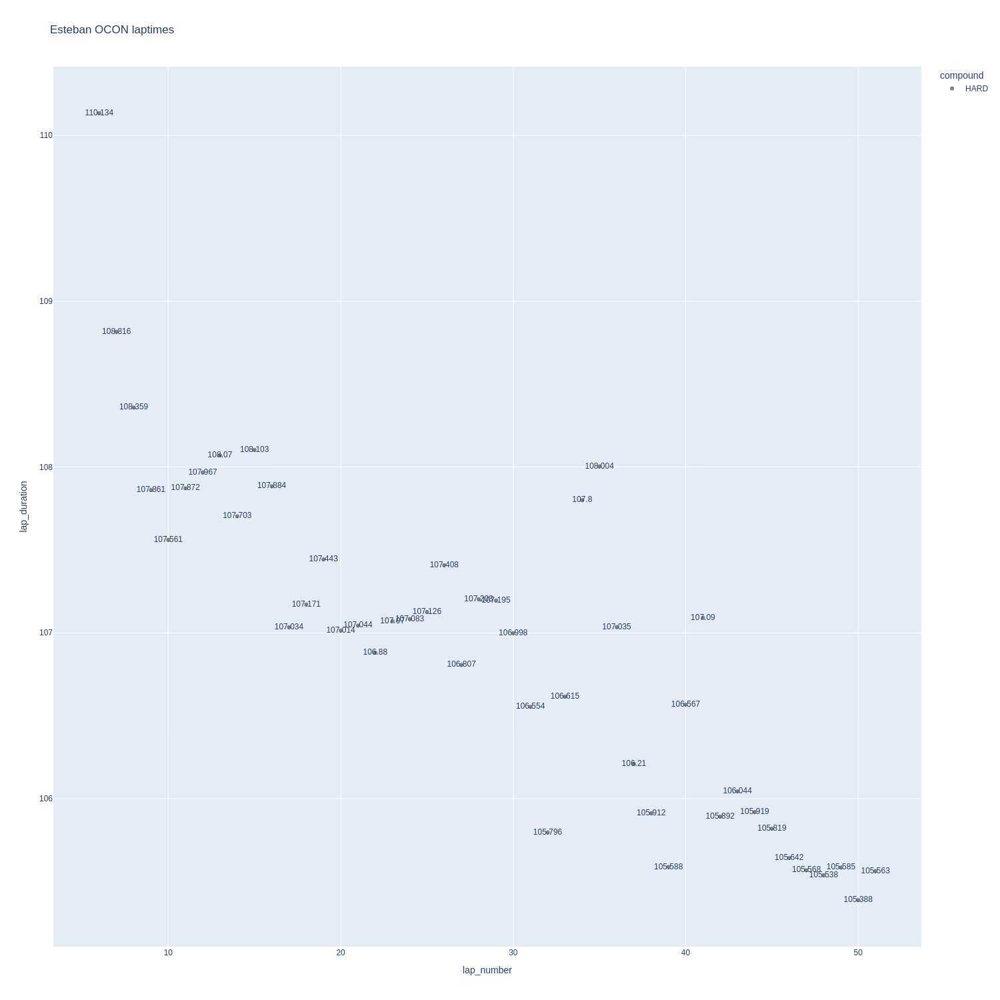

In [444]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

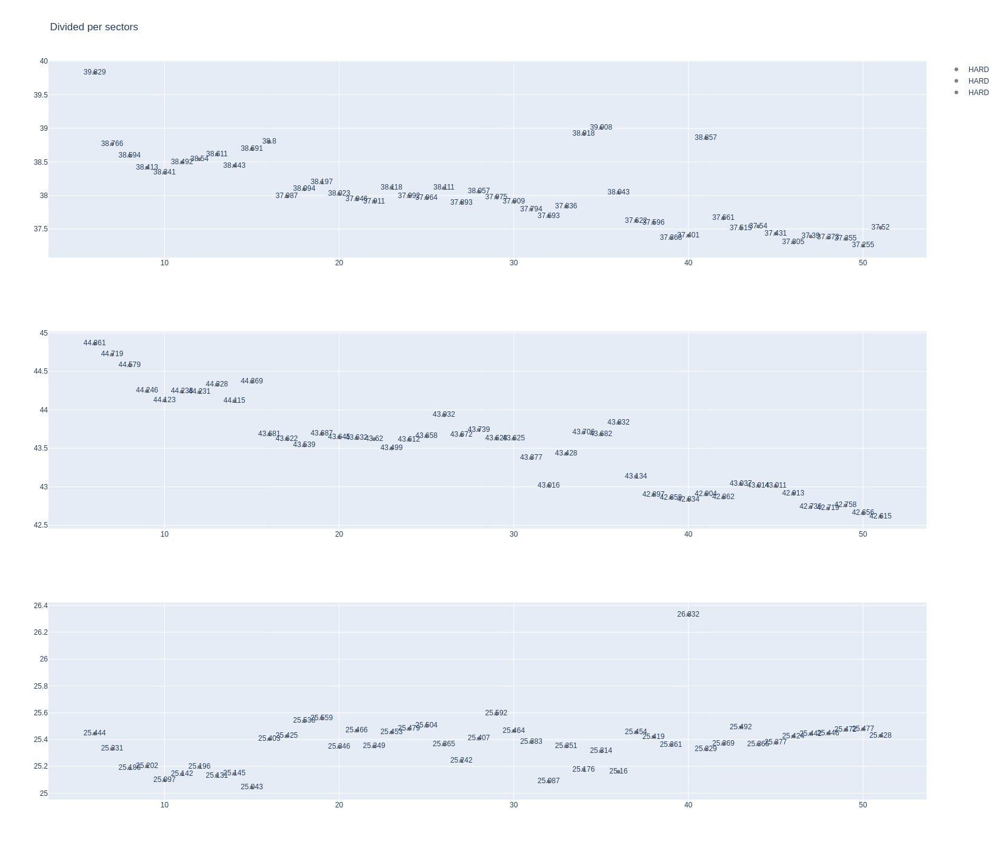

In [445]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [446]:
data = libraryDataF1.getinfolongruns(jointables,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
109,Oliver BEARMAN,HARD,2025-09-21T11:16:37.145000+00:00,6,39.681,44.731,25.274,109.686
128,Oliver BEARMAN,HARD,2025-09-21T11:18:26.733000+00:00,7,39.007,44.611,24.803,108.421
147,Oliver BEARMAN,HARD,2025-09-21T11:20:15.338000+00:00,8,39.352,44.438,25.045,108.835
166,Oliver BEARMAN,HARD,2025-09-21T11:22:03.924000+00:00,9,38.568,44.137,25.035,107.740
185,Oliver BEARMAN,HARD,2025-09-21T11:23:51.843000+00:00,10,38.377,44.028,24.738,107.143
204,Oliver BEARMAN,HARD,2025-09-21T11:25:39.006000+00:00,11,39.171,44.073,24.975,108.219
223,Oliver BEARMAN,HARD,2025-09-21T11:27:27.413000+00:00,12,38.765,44.121,24.992,107.878
242,Oliver BEARMAN,HARD,2025-09-21T11:29:15.031000+00:00,13,38.423,43.729,25.138,107.290
260,Oliver BEARMAN,HARD,2025-09-21T11:31:02.323000+00:00,14,38.289,44.115,25.077,107.481
279,Oliver BEARMAN,HARD,2025-09-21T11:32:49.764000+00:00,15,38.794,44.465,25.186,108.445


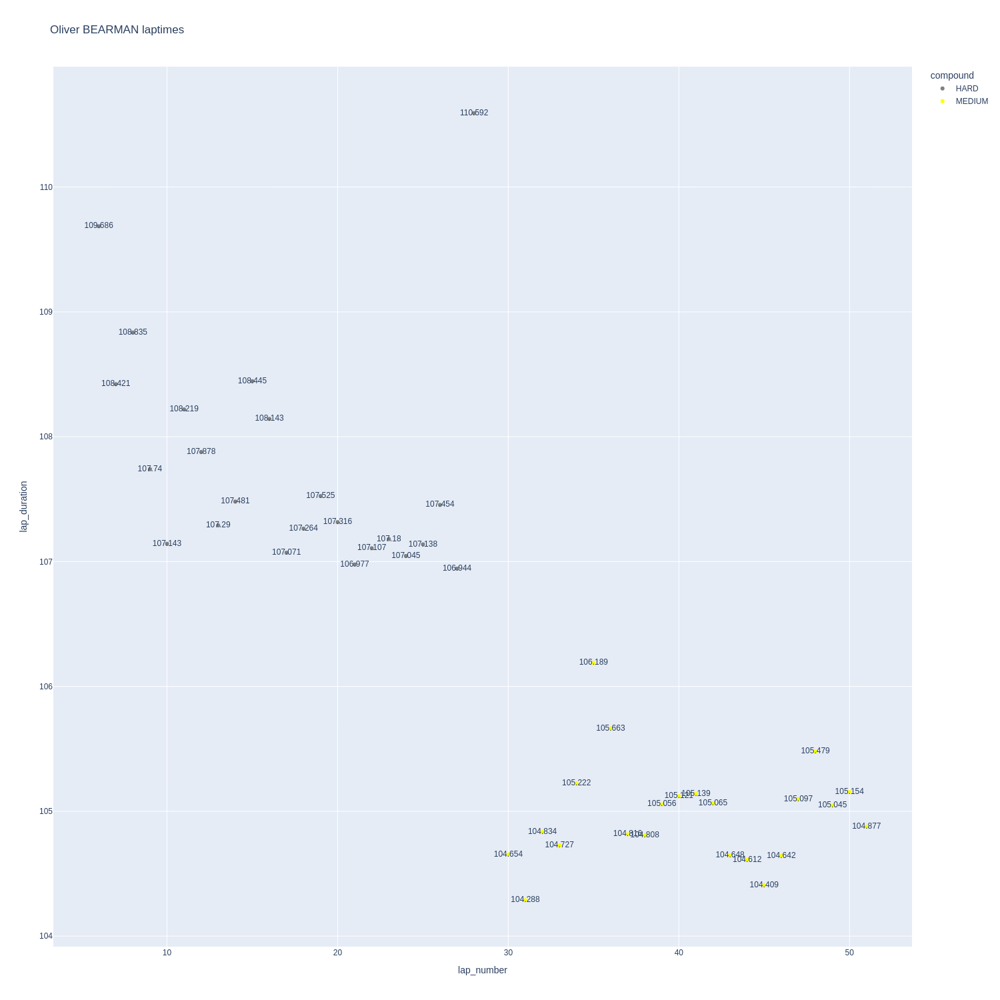

In [447]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

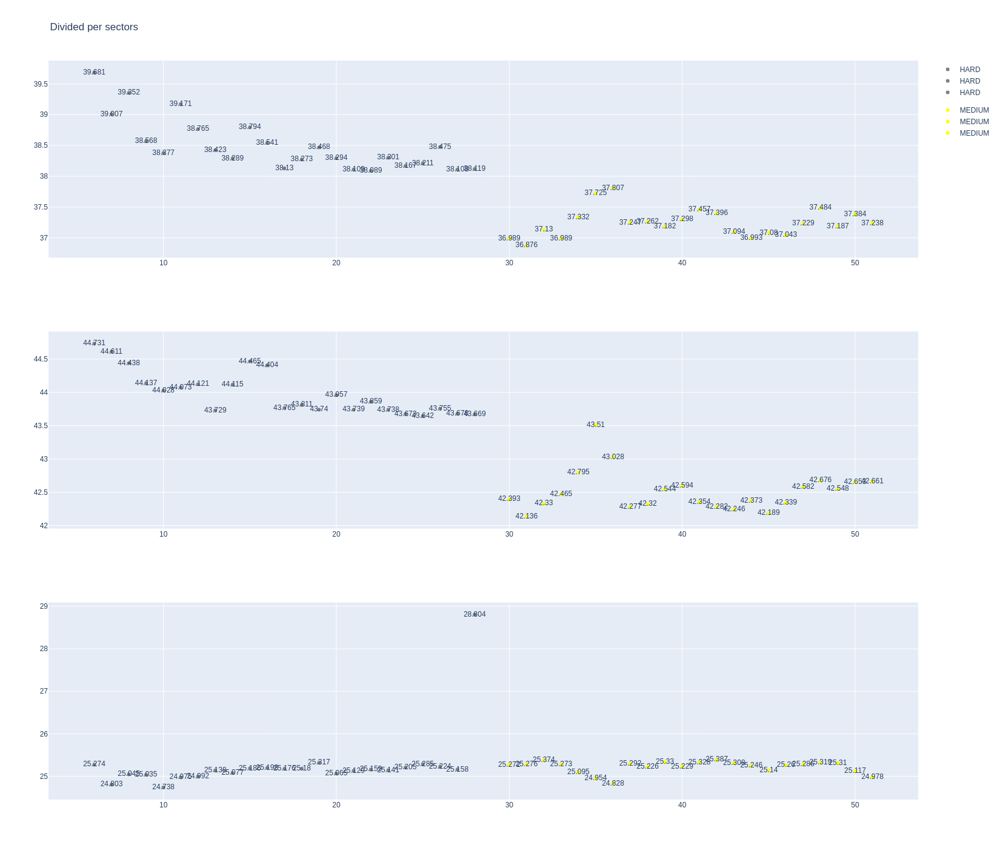

In [448]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [449]:
stintInformation.query('driver_number == 10 or driver_number == 43')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1269,9904,1,43,1,16,MEDIUM,0
14,1269,9904,1,10,1,35,HARD,0
23,1269,9904,2,10,36,50,MEDIUM,0
24,1269,9904,2,43,17,50,HARD,0


In [450]:
data =libraryDataF1.getinfolongruns(jointables,43,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
105,Franco COLAPINTO,MEDIUM,2025-09-21T11:16:34.779000+00:00,6,39.556,44.728,25.251,109.535
124,Franco COLAPINTO,MEDIUM,2025-09-21T11:18:24.339000+00:00,7,39.200,44.242,25.401,108.843
143,Franco COLAPINTO,MEDIUM,2025-09-21T11:20:13.262000+00:00,8,38.694,43.809,25.168,107.671
162,Franco COLAPINTO,MEDIUM,2025-09-21T11:22:00.906000+00:00,9,38.626,43.893,25.479,107.998
181,Franco COLAPINTO,MEDIUM,2025-09-21T11:23:48.870000+00:00,10,38.272,43.813,25.855,107.940
200,Franco COLAPINTO,MEDIUM,2025-09-21T11:25:36.796000+00:00,11,38.441,43.667,25.622,107.730
219,Franco COLAPINTO,MEDIUM,2025-09-21T11:27:24.527000+00:00,12,38.715,43.864,25.551,108.130
238,Franco COLAPINTO,MEDIUM,2025-09-21T11:29:12.707000+00:00,13,38.328,43.857,25.688,107.873
257,Franco COLAPINTO,MEDIUM,2025-09-21T11:31:00.446000+00:00,14,38.228,43.804,25.574,107.606
276,Franco COLAPINTO,MEDIUM,2025-09-21T11:32:48.199000+00:00,15,38.968,44.023,25.687,108.678


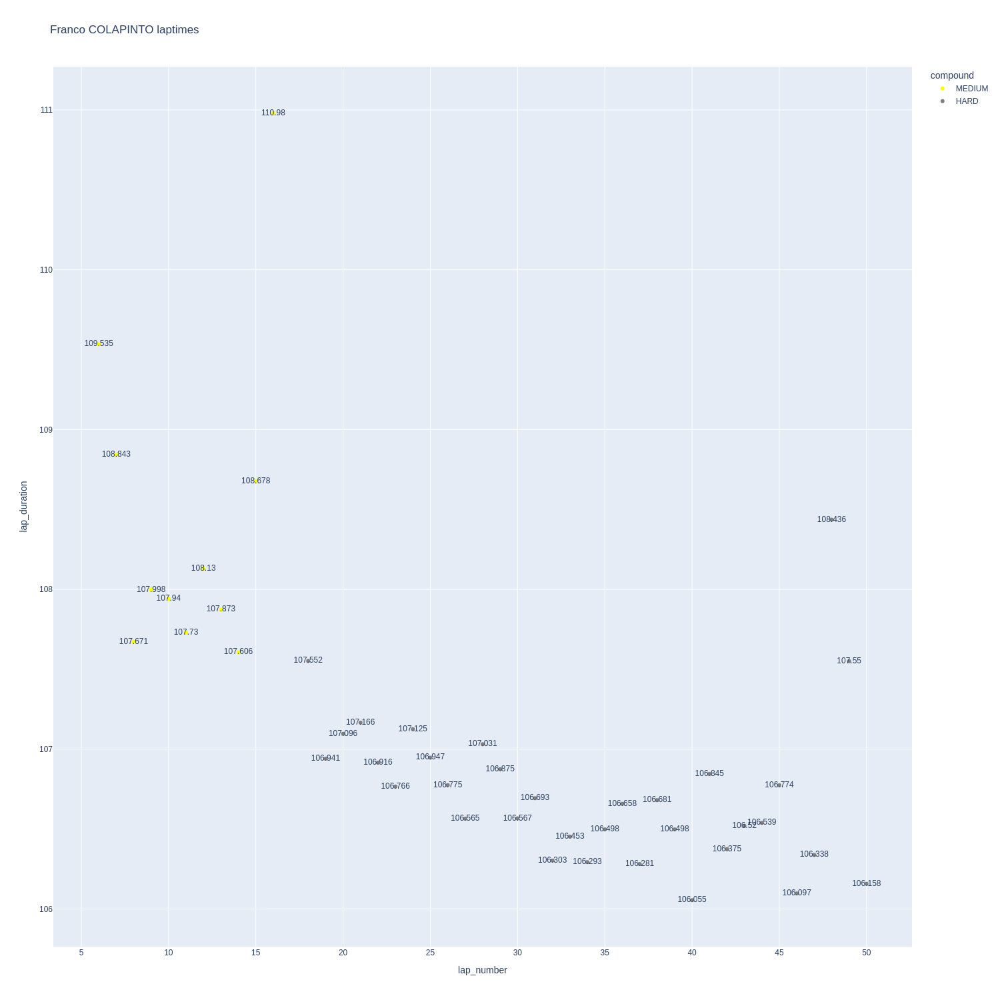

In [451]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

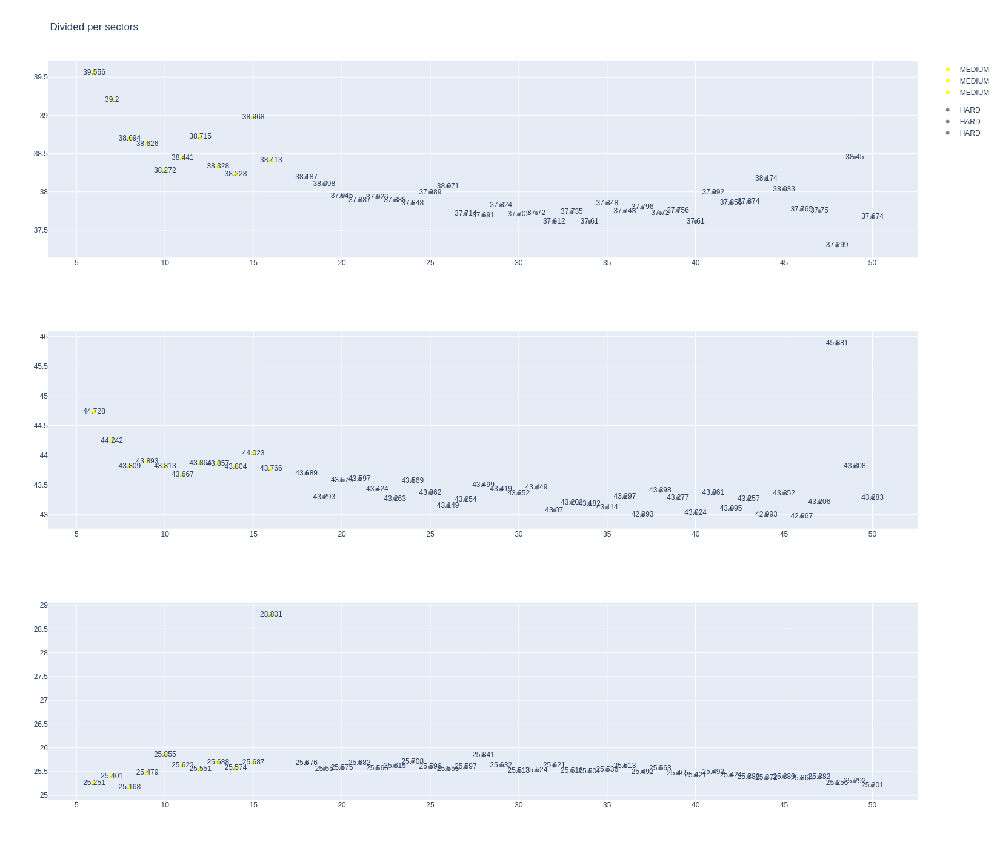

In [452]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [453]:
data = libraryDataF1.getinfolongruns(jointables,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
108,Pierre GASLY,HARD,2025-09-21T11:16:36.473000+00:00,6,39.586,44.911,25.189,109.686
127,Pierre GASLY,HARD,2025-09-21T11:18:26.380000+00:00,7,38.994,44.737,25.109,108.840
146,Pierre GASLY,HARD,2025-09-21T11:20:15.136000+00:00,8,38.943,44.395,25.143,108.481
165,Pierre GASLY,HARD,2025-09-21T11:22:03.669000+00:00,9,38.409,44.122,25.244,107.775
184,Pierre GASLY,HARD,2025-09-21T11:23:51.643000+00:00,10,38.226,44.081,25.074,107.381
203,Pierre GASLY,HARD,2025-09-21T11:25:38.701000+00:00,11,38.676,44.223,25.096,107.995
222,Pierre GASLY,HARD,2025-09-21T11:27:26.818000+00:00,12,38.474,44.287,25.307,108.068
241,Pierre GASLY,HARD,2025-09-21T11:29:14.871000+00:00,13,39.310,44.108,25.328,108.746
261,Pierre GASLY,HARD,2025-09-21T11:31:03.525000+00:00,14,38.304,44.189,25.339,107.832
280,Pierre GASLY,HARD,2025-09-21T11:32:51.521000+00:00,15,39.235,44.312,25.381,108.928


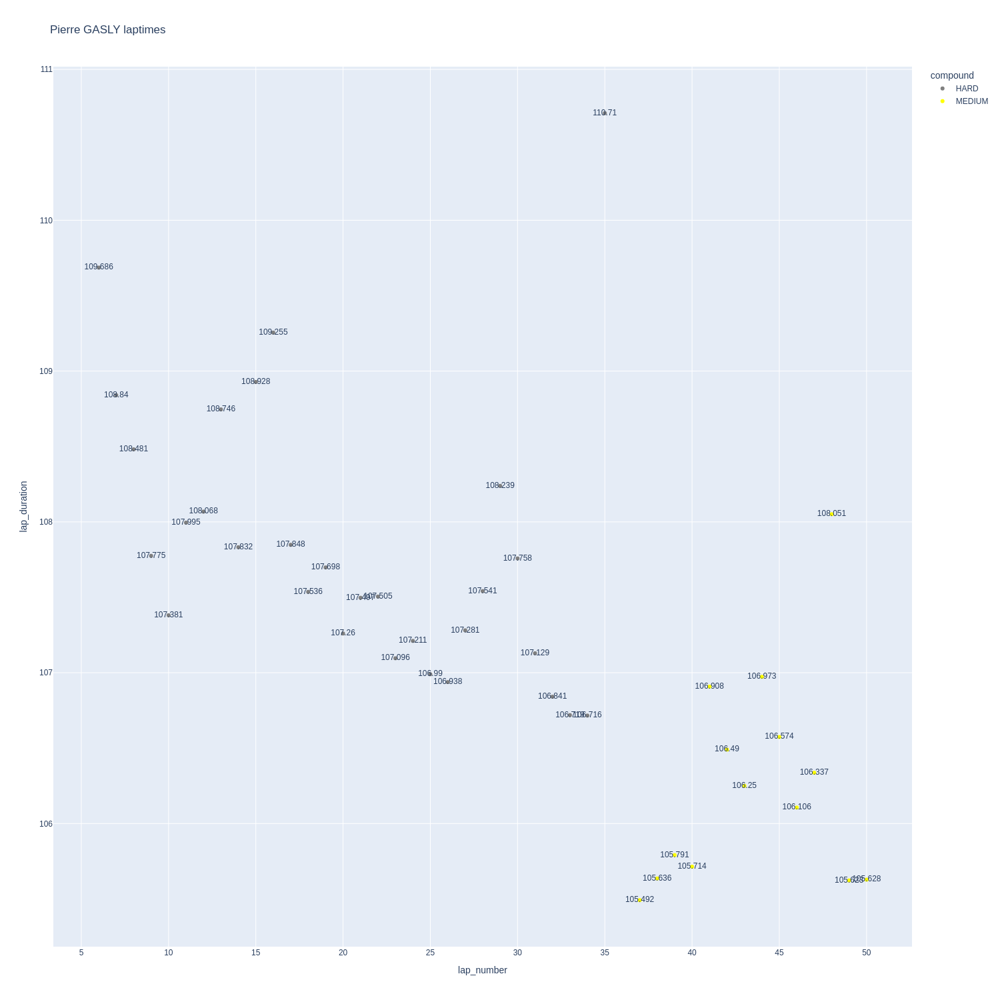

In [454]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

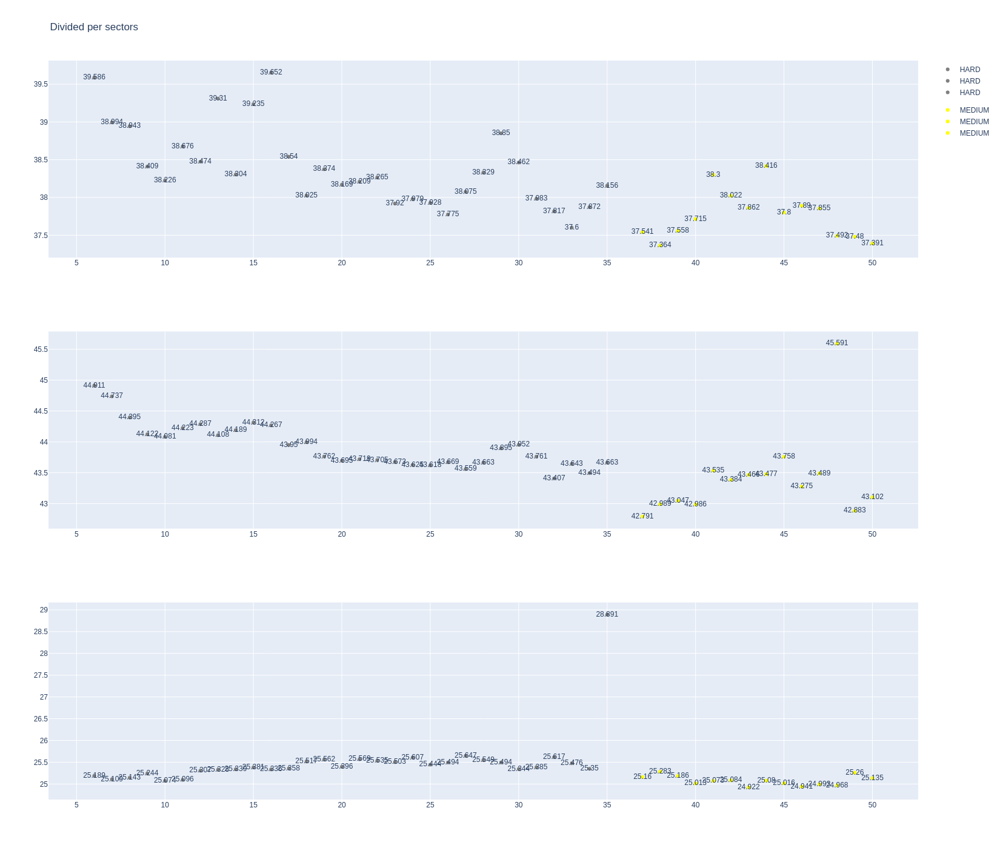

In [455]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [456]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1269,9904,1,23,1,1,MEDIUM,0
3,1269,9904,2,23,2,15,MEDIUM,0
11,1269,9904,1,55,1,27,MEDIUM,5
26,1269,9904,2,55,28,51,HARD,0
34,1269,9904,3,23,16,51,HARD,0


In [457]:
data = libraryDataF1.getinfolongruns(jointables,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
110,Alexander ALBON,MEDIUM,2025-09-21T11:16:37.350000+00:00,6,39.847,44.787,25.081,109.715
129,Alexander ALBON,MEDIUM,2025-09-21T11:18:27.383000+00:00,7,39.137,44.727,25.217,109.081
148,Alexander ALBON,MEDIUM,2025-09-21T11:20:16.199000+00:00,8,38.904,44.434,24.957,108.295
167,Alexander ALBON,MEDIUM,2025-09-21T11:22:04.346000+00:00,9,38.696,44.140,25.144,107.980
186,Alexander ALBON,MEDIUM,2025-09-21T11:23:52.318000+00:00,10,38.453,44.016,25.179,107.648
205,Alexander ALBON,MEDIUM,2025-09-21T11:25:40.016000+00:00,11,38.596,44.131,25.106,107.833
224,Alexander ALBON,MEDIUM,2025-09-21T11:27:27.886000+00:00,12,38.620,44.215,25.079,107.914
243,Alexander ALBON,MEDIUM,2025-09-21T11:29:15.730000+00:00,13,38.860,44.110,25.088,108.058
262,Alexander ALBON,MEDIUM,2025-09-21T11:31:03.883000+00:00,14,38.715,43.910,24.941,107.566
281,Alexander ALBON,MEDIUM,2025-09-21T11:32:51.549000+00:00,15,38.296,44.071,28.552,110.919


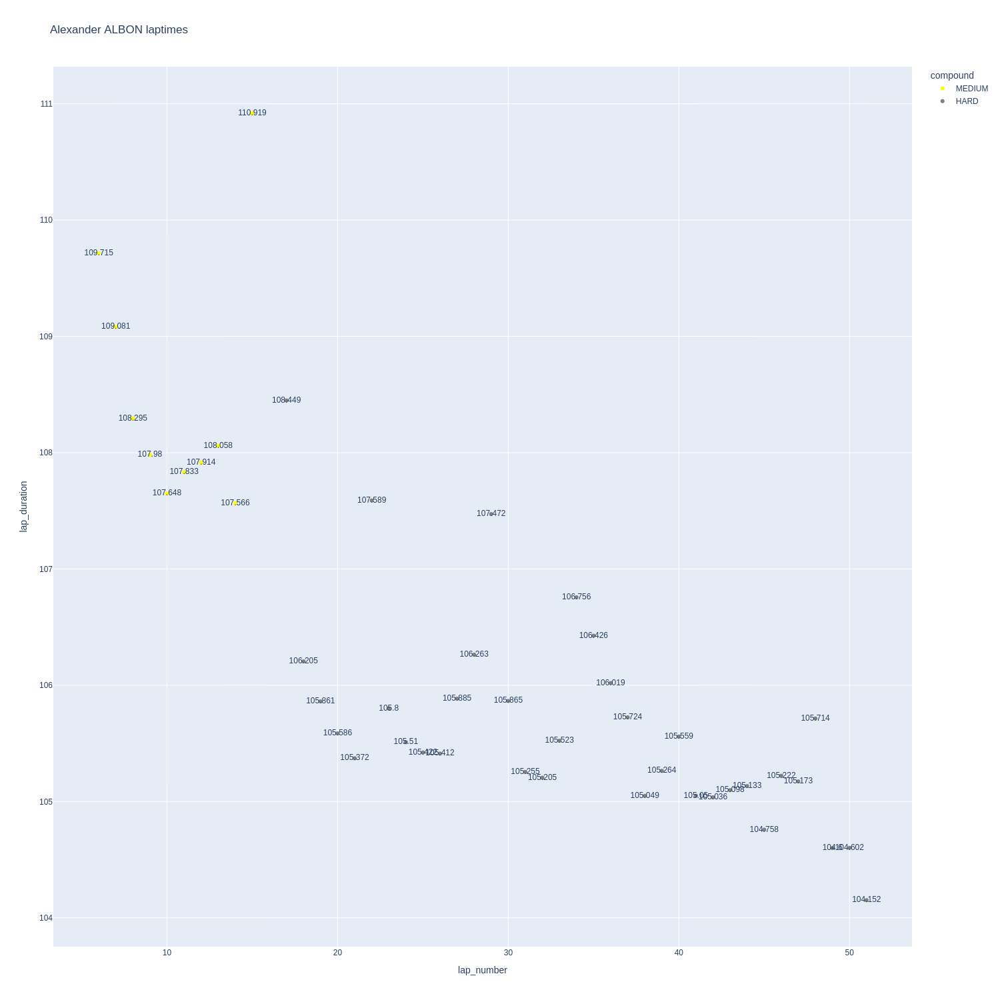

In [458]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

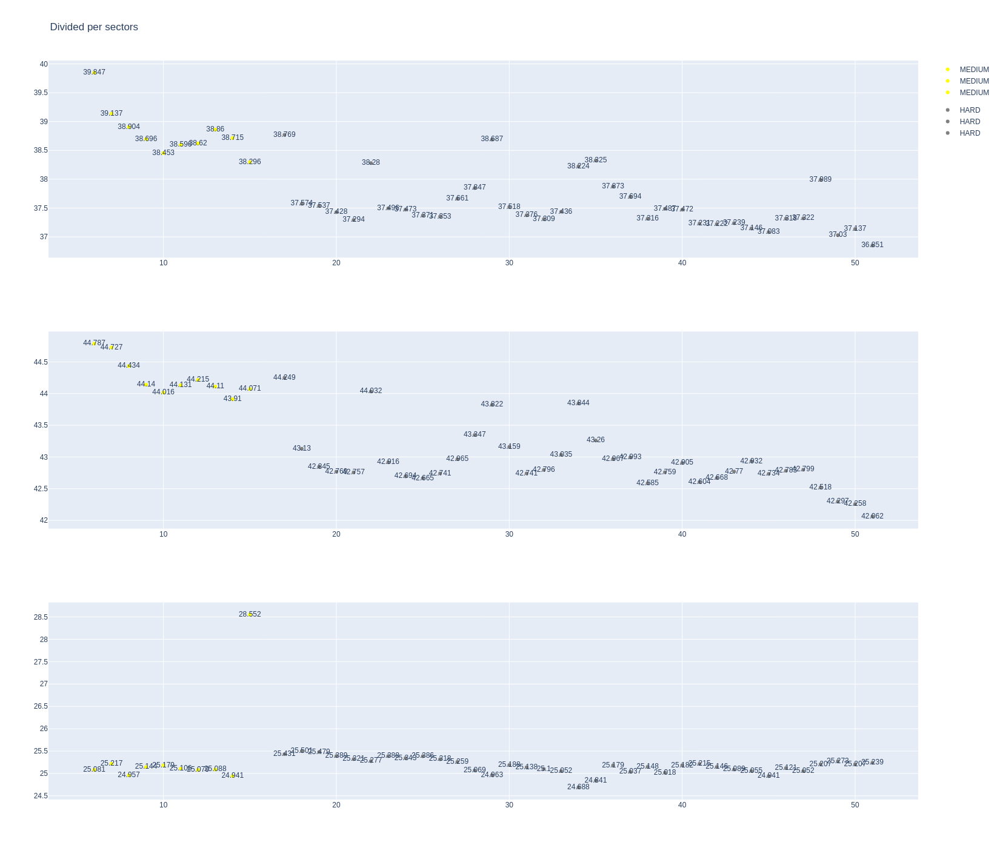

In [459]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [460]:
data= libraryDataF1.getinfolongruns(jointables,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
75,Carlos SAINZ,MEDIUM,2025-09-21T11:14:38.845000+00:00,5,39.318,43.538,25.730,108.586
94,Carlos SAINZ,MEDIUM,2025-09-21T11:16:27.395000+00:00,6,38.171,43.279,25.817,107.267
113,Carlos SAINZ,MEDIUM,2025-09-21T11:18:14.724000+00:00,7,37.828,42.796,25.622,106.246
132,Carlos SAINZ,MEDIUM,2025-09-21T11:20:01.043000+00:00,8,37.910,42.899,25.625,106.434
151,Carlos SAINZ,MEDIUM,2025-09-21T11:21:47.293000+00:00,9,37.789,43.318,25.696,106.803
170,Carlos SAINZ,MEDIUM,2025-09-21T11:23:34.176000+00:00,10,37.623,43.240,25.921,106.784
189,Carlos SAINZ,MEDIUM,2025-09-21T11:25:20.997000+00:00,11,37.484,43.313,25.784,106.581
208,Carlos SAINZ,MEDIUM,2025-09-21T11:27:07.485000+00:00,12,37.602,43.243,25.698,106.543
227,Carlos SAINZ,MEDIUM,2025-09-21T11:28:54.027000+00:00,13,NaN,43.019,25.680,106.301
246,Carlos SAINZ,MEDIUM,2025-09-21T11:30:40.365000+00:00,14,37.348,43.028,25.729,106.105


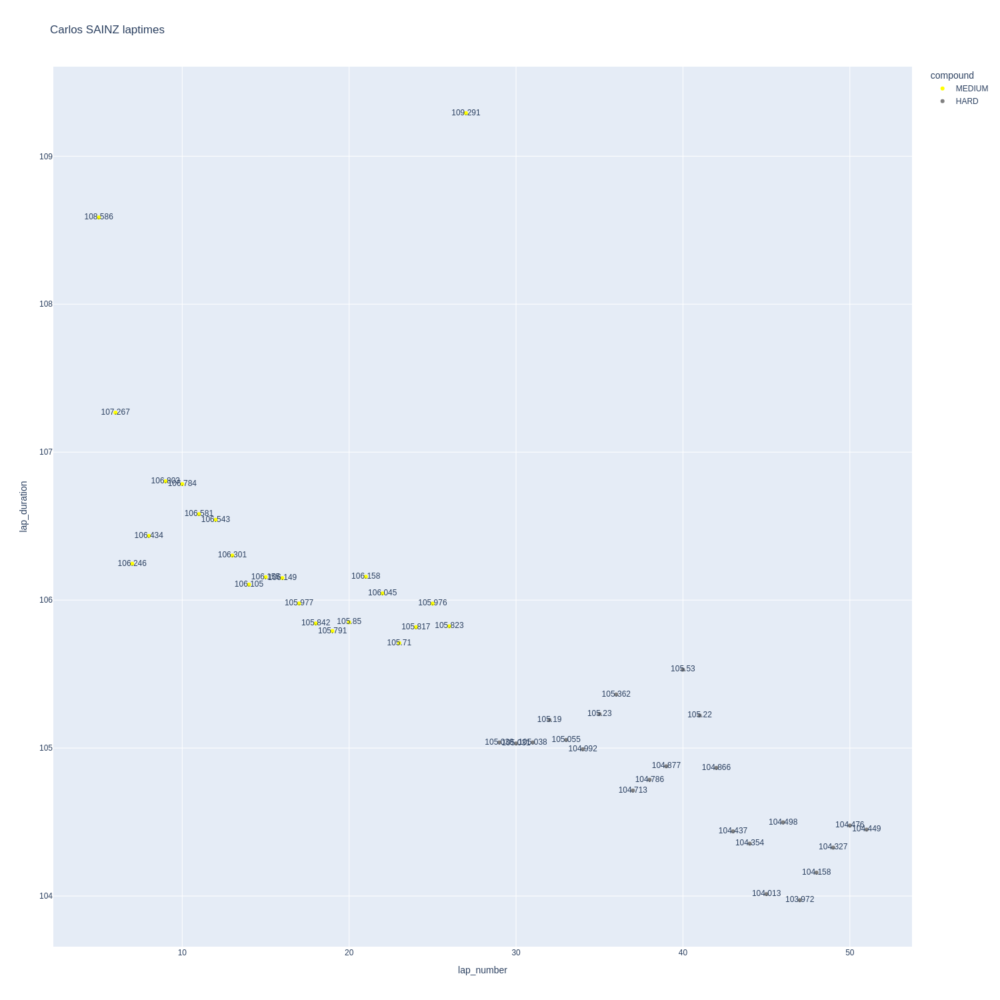

In [461]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

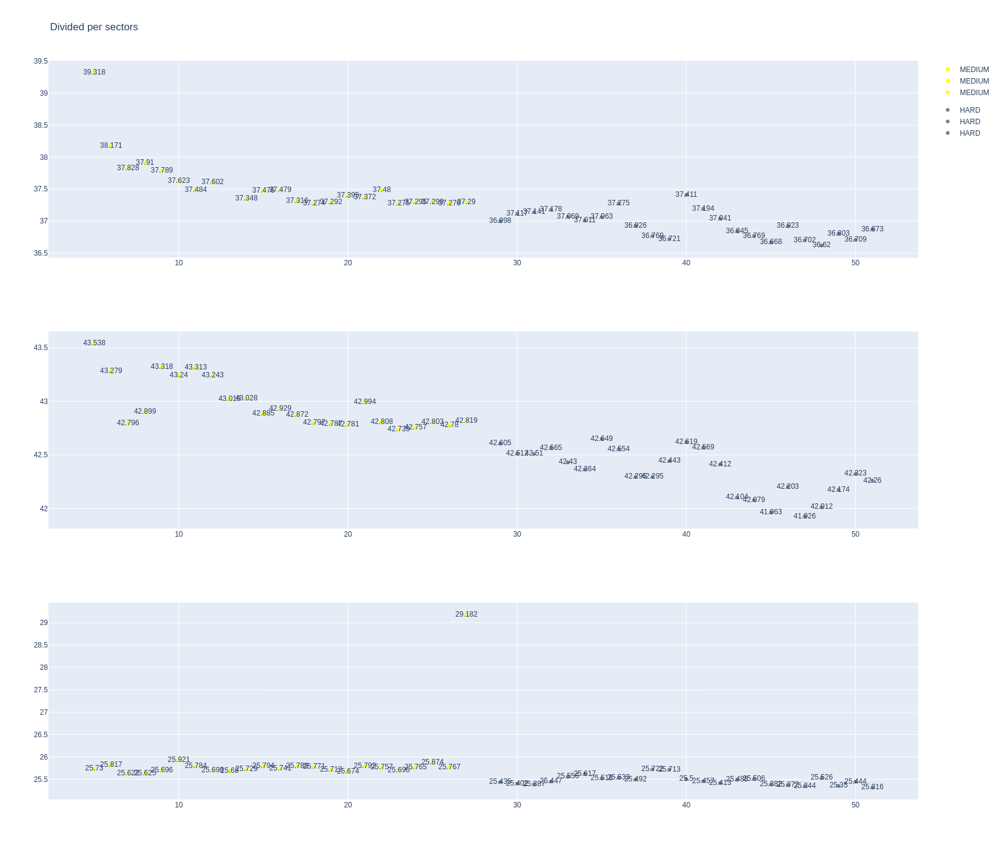

In [462]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [463]:
stintInformation.query('driver_number == 27 or driver_number == 5')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
10,1269,9904,1,5,1,26,HARD,0
16,1269,9904,1,27,1,36,HARD,0
35,1269,9904,2,5,27,51,MEDIUM,0
39,1269,9904,2,27,37,51,MEDIUM,0


In [464]:
data = libraryDataF1.getinfolongruns(jointables,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
107,Nico HULKENBERG,HARD,2025-09-21T11:16:36.023000+00:00,6,39.469,44.864,25.298,109.631
126,Nico HULKENBERG,HARD,2025-09-21T11:18:25.706000+00:00,7,39.082,44.426,25.161,108.669
145,Nico HULKENBERG,HARD,2025-09-21T11:20:14.339000+00:00,8,39.133,44.079,25.179,108.391
164,Nico HULKENBERG,HARD,2025-09-21T11:22:02.732000+00:00,9,38.470,44.059,25.266,107.795
183,Nico HULKENBERG,HARD,2025-09-21T11:23:50.555000+00:00,10,38.273,43.958,25.002,107.233
202,Nico HULKENBERG,HARD,2025-09-21T11:25:37.825000+00:00,11,38.833,44.231,25.224,108.288
221,Nico HULKENBERG,HARD,2025-09-21T11:27:26.146000+00:00,12,38.299,44.043,25.189,107.531
240,Nico HULKENBERG,HARD,2025-09-21T11:29:13.525000+00:00,13,38.608,44.156,25.140,107.904
259,Nico HULKENBERG,HARD,2025-09-21T11:31:01.547000+00:00,14,38.521,43.972,25.103,107.596
278,Nico HULKENBERG,HARD,2025-09-21T11:32:49.140000+00:00,15,38.924,44.311,25.159,108.394


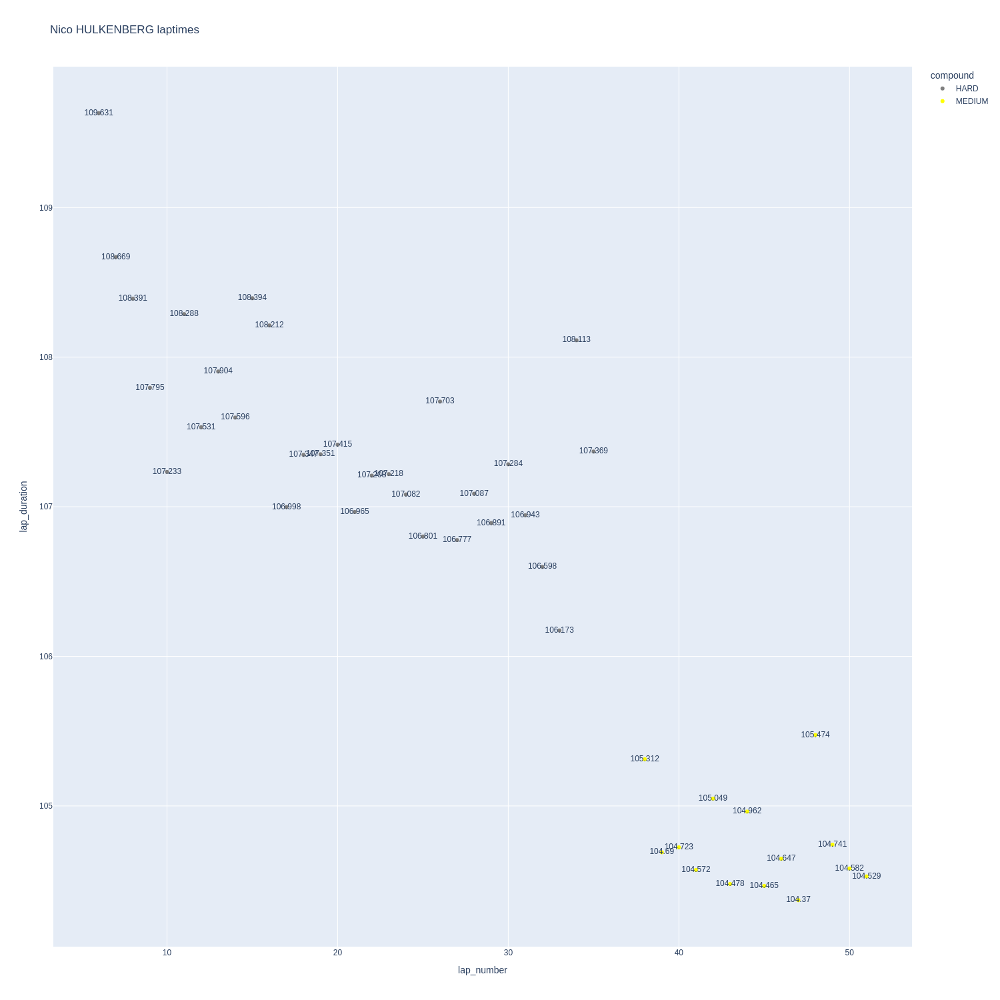

In [465]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

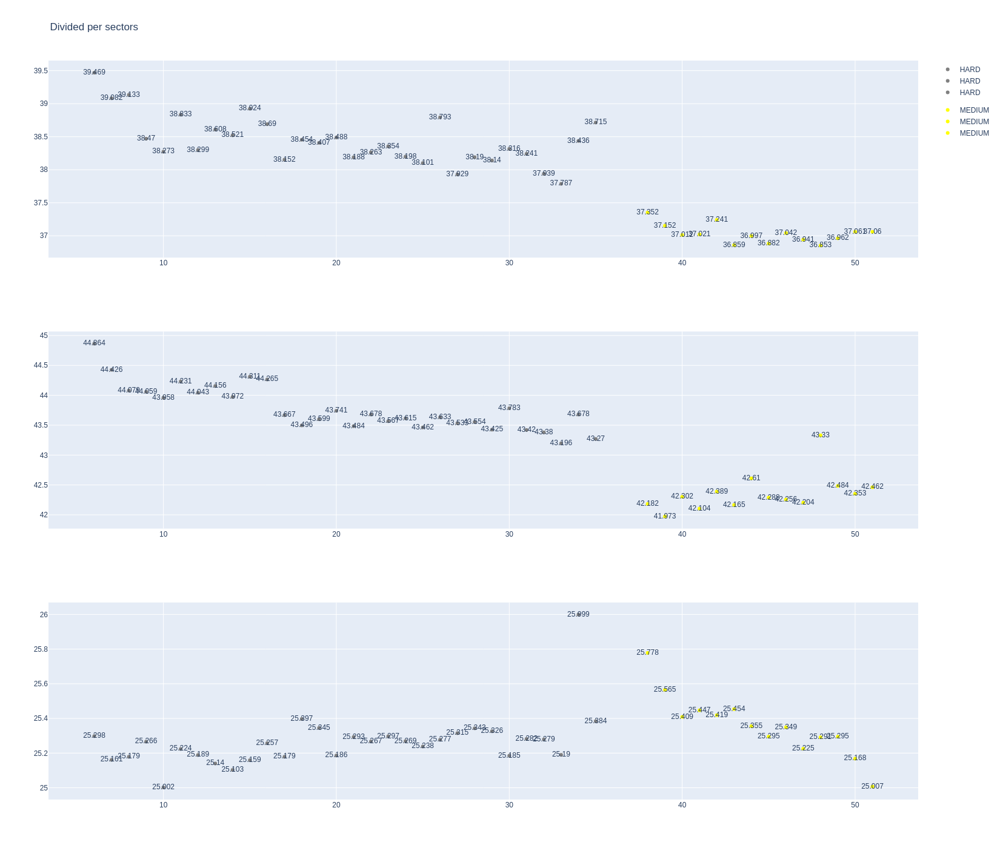

In [466]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [467]:
data = libraryDataF1.getinfolongruns(jointables,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
104,Gabriel BORTOLETO,HARD,2025-09-21T11:16:34.125000+00:00,6,39.651,44.666,25.355,109.672
123,Gabriel BORTOLETO,HARD,2025-09-21T11:18:23.765000+00:00,7,38.898,44.173,25.010,108.081
141,Gabriel BORTOLETO,HARD,2025-09-21T11:20:11.822000+00:00,8,38.371,43.561,25.512,107.444
160,Gabriel BORTOLETO,HARD,2025-09-21T11:21:59.277000+00:00,9,38.278,43.545,25.449,107.272
179,Gabriel BORTOLETO,HARD,2025-09-21T11:23:46.584000+00:00,10,37.929,43.406,25.616,106.951
198,Gabriel BORTOLETO,HARD,2025-09-21T11:25:33.499000+00:00,11,38.089,43.385,25.450,106.924
217,Gabriel BORTOLETO,HARD,2025-09-21T11:27:20.506000+00:00,12,38.200,43.507,25.535,107.242
236,Gabriel BORTOLETO,HARD,2025-09-21T11:29:07.619000+00:00,13,37.993,43.460,25.459,106.912
255,Gabriel BORTOLETO,HARD,2025-09-21T11:30:54.520000+00:00,14,38.037,43.447,25.469,106.953
274,Gabriel BORTOLETO,HARD,2025-09-21T11:32:41.572000+00:00,15,38.011,43.403,25.548,106.962


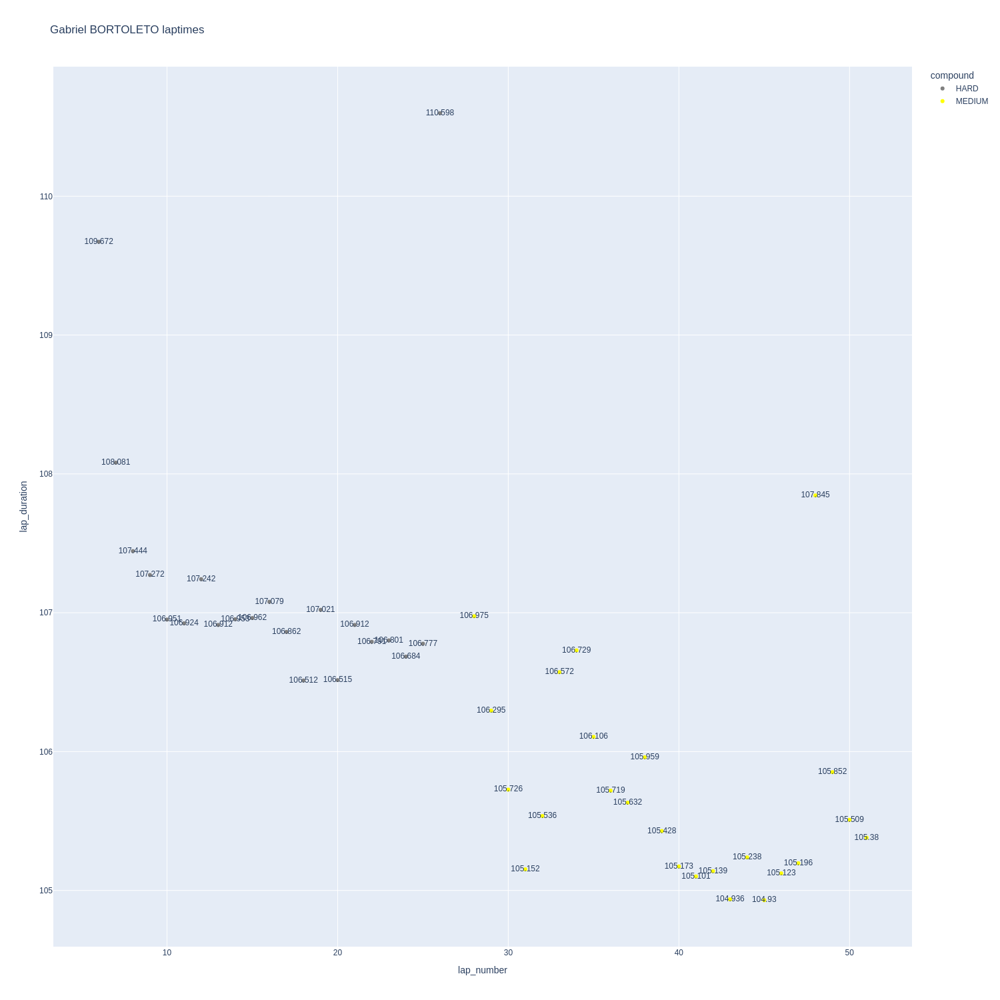

In [468]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

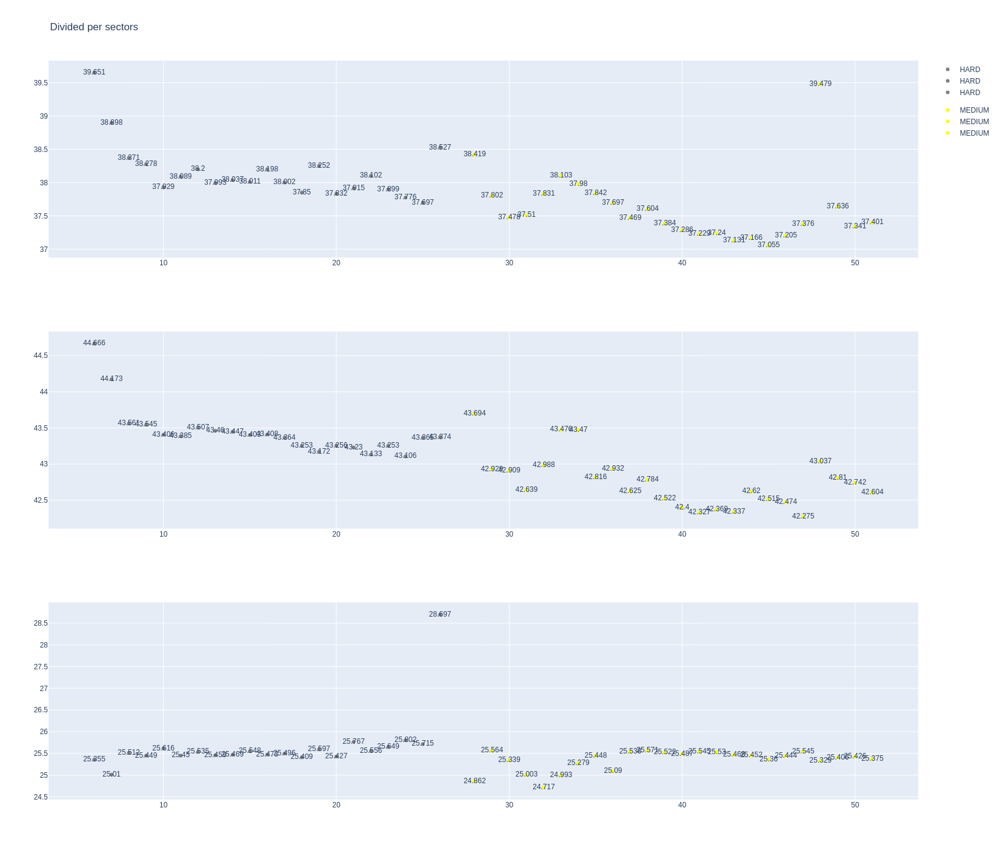

In [469]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

### Pits
Before to finish the analysis, I added the Pits sections where it can see how much time teams spent in the box.

In [470]:
pit = libraryDataF1.obtain_information('pit',session_key=9904)

In [471]:
jointables = pd.merge(drivers,pit,on=['driver_number']).query("pit_duration<120")
jointables
pit_duration = pd.DataFrame(jointables.groupby('team_name')['pit_duration'].mean().sort_values(ascending=True))
pit_duration

,pit_duration
team_name,
Racing Bulls,20.200000
Mercedes,20.200000
Ferrari,20.250000
Red Bull Racing,20.250000
Kick Sauber,20.350000
Williams,20.533333
Haas F1 Team,20.800000
Alpine,21.250000
McLaren,21.900000
